In [1]:
### start from here
from scipy.interpolate import CubicSpline
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import shapiro, ttest_rel, wilcoxon
import numpy as np

import matplotlib.pyplot as plt
treated = ["ABINGTON",  "AMBLER",  "CHELTENHAM",  "COLLEGEVILLE",  "CONSHOHOCKEN", 
                   "EAST GREENVILLE",  "EAST NORRITON",  "FRANCONIA" , "GREEN LANE", "HATFIELD TOWNSHIP", 
                   "HORSHAM" , "JENKINTOWN",  "LANSDALE",  "LIMERICK",  "LOWER GWYNEDD", 
                   "LOWER MERION",  "LOWER MORELAND",  "LOWER POTTSGROVE",  "LOWER PROVIDENCE",  "LOWER SALFORD", 
                   "MARLBOROUGH",  "MONTGOMERY",  "NARBERTH",  "PENNSBURG",  "PERKIOMEN", 
                   "PLYMOUTH",  "POTTSTOWN",  "RED HILL",  "ROCKLEDGE",  "ROYERSFORD", 
                   "SCHWENKSVILLE",  "SKIPPACK",  "SOUDERTON",  "TELFORD",  "TOWAMENCIN", 
                   "UPPER DUBLIN",  "UPPER FREDERICK",  "UPPER GWYNEDD",  "UPPER HANOVER",  "UPPER MERION", 
                   "UPPER MORELAND",  "UPPER POTTSGROVE",  "UPPER PROVIDENCE",  "UPPER SALFORD",  "WEST CONSHOHOCKEN", 
                   "WEST NORRITON",  "WEST POTTSGROVE",  "WHITEMARSH",  "WHITPAIN",  "WORCESTER"]
control = ["BRIDGEPORT", "BRYN ATHYN", "DOUGLASS", "HATBORO", "HATFIELD BORO", 
                   "LOWER FREDERICK", "NEW HANOVER", "NORRISTOWN", "NORTH WALES", "SALFORD", 
                   "SPRINGFIELD", "TRAPPE"]         

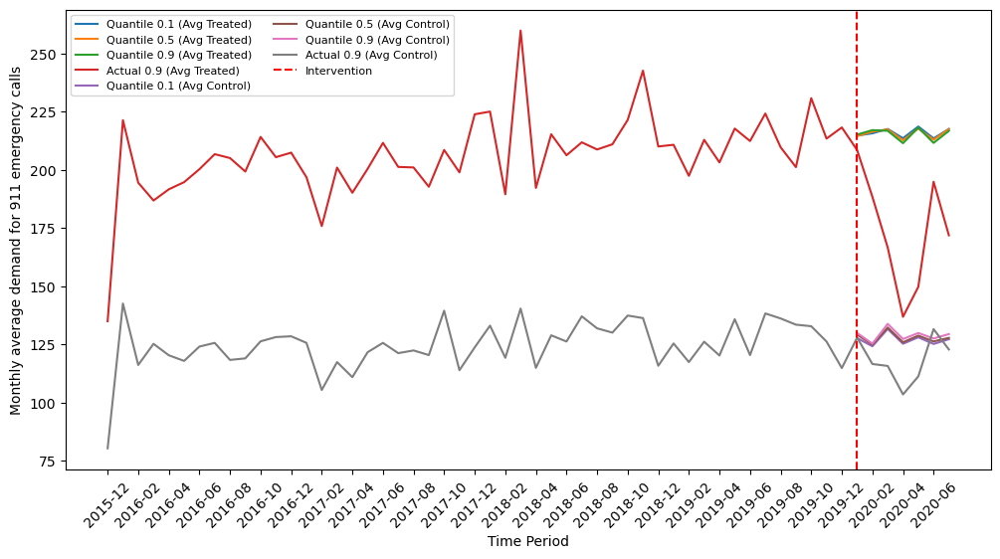

In [5]:

# Get a list of all CSV files in the folder for quantiles 0.1, 0.5, and 0.9
quantiles = ['0.1', '0.5', '0.9']
csv_files = {q: './results/nn_model_results/rnn/processed_ensemble_forecasts/callsMT2_LSTMcell_cocob_without_stl_decomposition_'+f'{q}.txt' for q in quantiles}


dataset_name = 'calls911_benchmarks'
data_index = pd.read_csv('./datasets/text_data/calls911/'+dataset_name+'.csv')
data_index.set_index(pd.to_datetime(data_index['date'], format = '%Y-%m-%d').apply(lambda x: x.strftime("%Y-%m")), inplace=True)
data_index = data_index.iloc[:,1:]

all_columns = data_index.columns.tolist()

# Create a binary mask indicating whether each column is treated (1) or control (0)
tnc = [1 if col in treated else 0 for col in all_columns]

# Create a dictionary to store the dataframes for each quantile
dfs = {q: [] for q in quantiles}

# Iterate over each quantile
for quantile, files in csv_files.items():
    # Iterate over each file for the quantile
    # Load the text data from CSV
    data = pd.read_csv(files, header=None)

    # Transpose the data for better visualization (units as rows, time periods as columns)
    transposed_data = data.transpose()

    # Append the transposed dataframe to the list for the current quantile
    dfs[quantile].append(transposed_data)

# Concatenate the dataframes along the columns (units) for each quantile
concatenated_data = {q: pd.concat(frames, axis=1) for q, frames in dfs.items()}


# a boolean list to denote whether the unit is treated or controled
tnc_bool = [bool(value) for value in tnc]
flipped_tnc_bool = [not value for value in tnc_bool]

# average predicted treated units
averages_predicted_treated = {q: concatenated_data[q][concatenated_data[q].columns[tnc_bool]].mean(axis=1) for q in quantiles}

# average actual treated units
averages_actual_treated = data_index[data_index.columns[tnc_bool]].mean(axis=1)

# average predicted control units
averages_predicted_control = {q: concatenated_data[q][concatenated_data[q].columns[flipped_tnc_bool]].mean(axis=1) for q in quantiles}

# average actual control units
averages_actual_control = data_index[data_index.columns[flipped_tnc_bool]].mean(axis=1)


# Plot the averages
fig, ax = plt.subplots(figsize=(12, 6))

for quantile, average_data in averages_predicted_treated.items():
    ax.plot((len(averages_actual_treated)-average_data.index-1)[::], average_data, label=f'Quantile {quantile} (Avg Treated)')
ax.plot(averages_actual_treated.index, averages_actual_treated, label=f'Actual {quantile} (Avg Treated)')

for quantile, average_data in averages_predicted_control.items():
    ax.plot((len(averages_actual_treated)-average_data.index-1)[::-1], average_data, label=f'Quantile {quantile} (Avg Control)')
ax.plot(averages_actual_control.index, averages_actual_control, label=f'Actual {quantile} (Avg Control)')

# Add a vertical line at 2020-01
plt.axvline("2020-01", color='red', linestyle='--', label='Intervention')

ax.set_xlabel('Time Period')
ax.set_ylabel('Monthly average demand for 911 emergency calls')
ax.legend(loc='upper left', bbox_to_anchor=(0, 1), ncol=2, fontsize=8)
plt.xticks(averages_actual_control.index[::2],rotation=45)
plt.show()

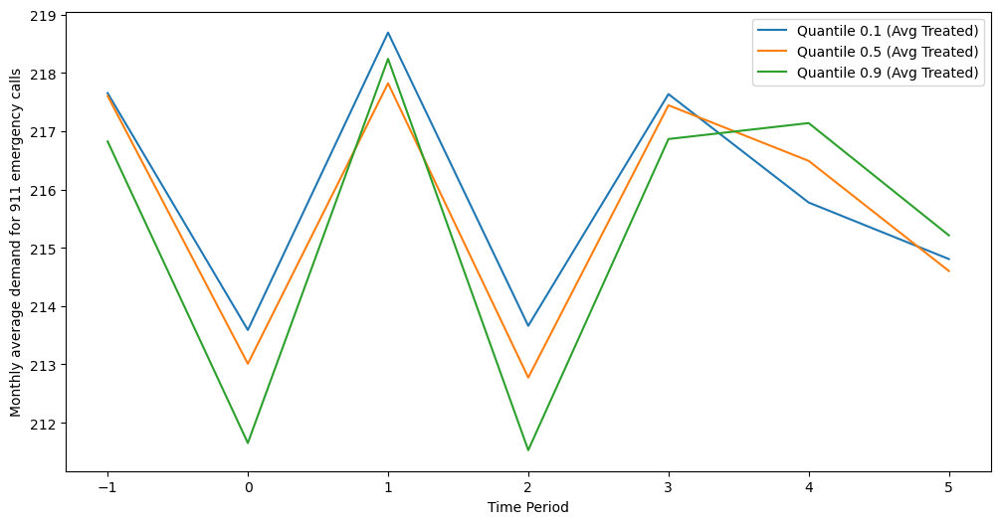

In [6]:
# Plot the averages
fig, ax = plt.subplots(figsize=(12, 6))

for quantile, average_data in averages_predicted_treated.items():
    ax.plot(average_data.index-1, average_data, label=f'Quantile {quantile} (Avg Treated)')

# for quantile, average_data in averages_predicted_control.items():
#     ax.plot((len(averages_actual_treated)-average_data.index-1)[::-1], average_data, label=f'Quantile {quantile} (Avg Control)')

ax.set_xlabel('Time Period')
ax.set_ylabel('Monthly average demand for 911 emergency calls')
ax.legend()
# ax.legend(loc='upper left', bbox_to_anchor=(0, 1), ncol=2, fontsize=9)
# plt.xticks(averages_actual_control.index[::2],rotation=45)
plt.show()

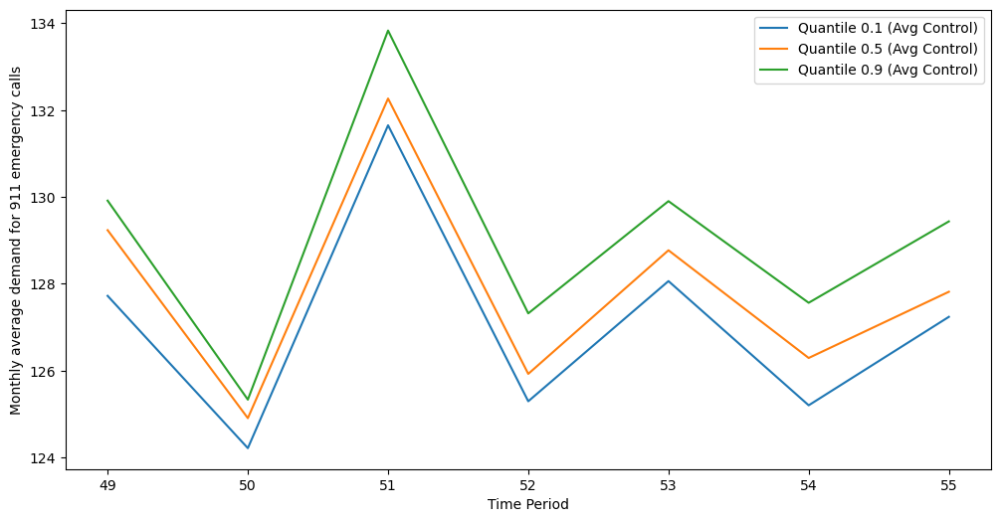

In [7]:
# Plot the averages
fig, ax = plt.subplots(figsize=(12, 6))

# for quantile, average_data in averages_predicted_treated.items():
#     ax.plot(average_data.index-1, average_data, label=f'Quantile {quantile} (Avg Treated)')

for quantile, average_data in averages_predicted_control.items():
    ax.plot((len(averages_actual_treated)-average_data.index-1)[::-1], average_data, label=f'Quantile {quantile} (Avg Control)')

ax.set_xlabel('Time Period')
ax.set_ylabel('Monthly average demand for 911 emergency calls')
ax.legend()
# ax.legend(loc='upper left', bbox_to_anchor=(0, 1), ncol=2, fontsize=9)
# plt.xticks(averages_actual_control.index[::2],rotation=45)
plt.show()

In [10]:
# MEAN DIFFERENCE TESTING

# 1. Preparing the data
for q in quantiles:
    # Treated group
    diff_I = pd.DataFrame(averages_predicted_treated[q], columns=['Predicted'])
    diff_I['Y'] = list(averages_actual_treated[-len(averages_predicted_treated[q]):].values)
    diff_I['ab_diff'] = abs(diff_I['Predicted'] - diff_I['Y'])
    diff_I['ab_sum_av'] = (abs(diff_I['Predicted']) + abs(diff_I['Y'])) / 2
    diff_I['ab_diff_propY'] = diff_I['ab_diff'] / diff_I['Y']
    diff_I['ab_diff_propT'] = diff_I['ab_diff'] / diff_I['Predicted']
    diff_I['ab_diff_propYF'] = diff_I['ab_diff'] / diff_I['ab_sum_av']


    # Control group
    diff_NI = pd.DataFrame(averages_predicted_control[q], columns=['Predicted'])
    diff_NI['Y'] = list(averages_actual_control[-len(averages_predicted_control[q]):].values)
    diff_NI['ab_diff'] = abs(diff_NI['Predicted'] - diff_NI['Y'])
    diff_NI['ab_sum_av'] = (abs(diff_NI['Predicted']) + abs(diff_NI['Y'])) / 2
    diff_NI['ab_diff_propY'] = diff_NI['ab_diff'] / diff_NI['Y']
    diff_NI['ab_diff_propT'] = diff_NI['ab_diff'] / diff_NI['Predicted']
    diff_NI['ab_diff_propYF'] = diff_NI['ab_diff'] / diff_NI['ab_sum_av']

    # 2. MEAN SIGNIFICANCE TESTS FOR relative differences
    diff_I_vec = diff_I['ab_diff_propT'].values * 100
    diff_NI_vec = diff_NI['ab_diff_propT'].values * 100
    print(q)
    # Display mean and median for each group
    print("Treated Group TTE - Mean:", diff_I['ab_diff'].mean())
    print("Control Group TTE - Mean:", diff_NI['ab_diff'].mean())

    print("Treated Group - Mean:", diff_I_vec.mean(), "Median:", pd.Series(diff_I_vec).median())
    print("Control Group - Mean:", diff_NI_vec.mean(), "Median:", pd.Series(diff_NI_vec).median())
    if q == "0.5":
        # Shapiro-Wilk’s test for normality
        shapiro_diff_I = shapiro(diff_I_vec)
        shapiro_diff_NI = shapiro(diff_NI_vec)

        print("Shapiro-Wilk test p-value for Treated Group:", shapiro_diff_I.pvalue)
        print("Shapiro-Wilk test p-value for Control Group:", shapiro_diff_NI.pvalue)

        # Apply t-test if data is normally distributed, otherwise Wilcoxon signed-rank test
        if shapiro_diff_I.pvalue > 0.05 and shapiro_diff_NI.pvalue > 0.05:
            t_test_result = ttest_rel(diff_I_vec, diff_NI_vec)
            print("T-Test p-value:", t_test_result.pvalue)
        else:
            wilcoxon_test_result = wilcoxon(diff_I_vec, diff_NI_vec)
            print("Wilcoxon test p-value:", wilcoxon_test_result.pvalue)

0.1
Treated Group TTE - Mean: 42.08429884462212
Control Group TTE - Mean: 10.446486880293282
Treated Group - Mean: 19.494423139795067 Median: 19.965307920184205
Control Group - Mean: 8.208475537454818 Median: 6.14614858571603
0.5
Treated Group TTE - Mean: 41.78916027919133
Control Group TTE - Mean: 10.912430991402596
Treated Group - Mean: 19.398517897300415 Median: 19.888804920739663
Control Group - Mean: 8.525667853556655 Median: 6.665019663781571
Shapiro-Wilk test p-value for Treated Group: 0.8075667023658752
Shapiro-Wilk test p-value for Control Group: 0.5748091340065002
T-Test p-value: 0.003952851840901288
0.9
Treated Group TTE - Mean: 41.46267802710146
Control Group TTE - Mean: 11.704676378578089
Treated Group - Mean: 19.279602024935315 Median: 20.11611389375507
Control Group - Mean: 9.050808238337556 Median: 6.982702054321376


In [124]:


# Get a list of all CSV files in the folder for quantiles 0.1, 0.5, and 0.9
quantiles = ['0.1', '0.5', '0.9']
dataset_name = 'sim_10_60_l_he'


,series_id,value,c_t,time_series_length,amount_of_time_series,dgp,te_intervention,tnc
time,,,,,,,,
1,10_1_60_linear_heterogeneous,4.000000,control,60,10,linear,heterogeneous,0
1,10_2_60_linear_heterogeneous,4.000000,control,60,10,linear,heterogeneous,0
1,10_3_60_linear_heterogeneous,4.000000,control,60,10,linear,heterogeneous,0
1,10_4_60_linear_heterogeneous,4.000000,control,60,10,linear,heterogeneous,0
1,10_5_60_linear_heterogeneous,4.000000,control,60,10,linear,heterogeneous,0
...,...,...,...,...,...,...,...,...
60,10_6_60_linear_heterogeneous,5.331190,treated,60,10,linear,heterogeneous,1
60,10_7_60_linear_heterogeneous,3.879921,treated,60,10,linear,heterogeneous,1
60,10_8_60_linear_heterogeneous,12.673118,treated,60,10,linear,heterogeneous,1


In [43]:
# Sample DataFrame (replace this with your actual data)
data = {
    'Time_Period_1': [1, 2, 3, 4, 5],
    'Time_Period_2': [5, 4, 3, 2, 1],
    'Time_Period_3': [2, 3, 1, 4, 5],
}

df = pd.DataFrame(data)
print(df)
# Calculate the quantiles for each unit at each time period
quantiles_df = df.apply(lambda col: col.quantile([0.25, 0.5, 0.75])).transpose()

# Display the resulting DataFrame with quantiles
print(quantiles_df)

   Time_Period_1  Time_Period_2  Time_Period_3
0              1              5              2
1              2              4              3
2              3              3              1
3              4              2              4
4              5              1              5
               0.25  0.50  0.75
Time_Period_1   2.0   3.0   4.0
Time_Period_2   2.0   3.0   4.0
Time_Period_3   2.0   3.0   4.0


In [9]:
int(101/2)

50

In [22]:


def table2(dataset_name, data_type, model, forecast_horizon, plot_or_not=False):

    quantiles = ['0.1', '0.5', '0.9']
    concatenated_data = None
    single_data = None
    csv_files = None
    if data_type == 'calls911' and model == 'DeepProbCP':
        csv_files = {q: './results/nn_model_results/rnn/processed_ensemble_forecasts/callsMT2_LSTMcell_cocob_without_stl_decomposition_'\
                 +f'{q}.txt' for q in quantiles}  
    elif data_type == 'sim' and model == 'DeepProbCP':
        csv_files = {q: './results/nn_model_results/rnn/processed_ensemble_forecasts/'+dataset_name+'_LSTMcell_cocob_without_stl_decomposition_'\
                 +f'{q}.txt' for q in quantiles}  
    # elif model in ['DeepProbCP', 'deepAR']:
    #     # Get a list of all CSV files in the folder for quantiles 0.1, 0.5, and 0.9
    #     csv_files = {q: './results/benchmarks/predicted/' + dataset_name +\
    #              '_' + model +f'_{q}.txt' for q in quantiles}
    elif model == 'tft':
        csv_files = {q: './results/benchmarks/predicted/' + dataset_name +\
                 '_' + model +f'_{q}.csv' for q in quantiles}
    elif model in ['causalimpact', 'tsmixer']:
        single_data = pd.read_csv('./results/benchmarks/predicted/' + dataset_name +\
                 '_' + model +'.csv', header=None).T
        
    if csv_files:
        # Create a dictionary to store the dataframes for each quantile
        dfs = {q: [] for q in quantiles}

        # Iterate over each quantile
        for quantile, files in csv_files.items():
            # Iterate over each file for the quantile
            # Load the text data from CSV
            data = pd.read_csv(files, header=None)

            # Transpose the data for better visualization (units as rows, time periods as columns)
            transposed_data = data.transpose()

            # Append the transposed dataframe to the list for the current quantile
            dfs[quantile].append(transposed_data)

        # Concatenate the dataframes along the columns (units) for each quantile
        concatenated_data = {q: pd.concat(frames, axis=1) for q, frames in dfs.items()}
        print(concatenated_data['0.5'].shape)
    
    data_wor = pd.read_csv('./datasets/text_data/'+data_type+'/'+dataset_name+'.csv')
    data_wr = pd.read_csv('./datasets/text_data/'+data_type+'/'+dataset_name+'_for_errors.csv').iloc[:,1:]
    no_of_series = len(data_wor.columns)
    length_of_series = len(data_wor.index)
    if data_type == "calls911":
        treated = ["ABINGTON",  "AMBLER",  "CHELTENHAM",  "COLLEGEVILLE",  "CONSHOHOCKEN",
                  "EAST GREENVILLE",  "EAST NORRITON",  "FRANCONIA" , "GREEN LANE", "HATFIELD TOWNSHIP",
                  "HORSHAM" , "JENKINTOWN",  "LANSDALE",  "LIMERICK",  "LOWER GWYNEDD",
                  "LOWER MERION",  "LOWER MORELAND",  "LOWER POTTSGROVE",  "LOWER PROVIDENCE",  "LOWER SALFORD",
                  "MARLBOROUGH",  "MONTGOMERY",  "NARBERTH",  "PENNSBURG",  "PERKIOMEN",
                  "PLYMOUTH",  "POTTSTOWN",  "RED HILL",  "ROCKLEDGE",  "ROYERSFORD",
                  "SCHWENKSVILLE",  "SKIPPACK",  "SOUDERTON",  "TELFORD",  "TOWAMENCIN",
                  "UPPER DUBLIN",  "UPPER FREDERICK",  "UPPER GWYNEDD",  "UPPER HANOVER",  "UPPER MERION",
                  "UPPER MORELAND",  "UPPER POTTSGROVE",  "UPPER PROVIDENCE",  "UPPER SALFORD",  "WEST CONSHOHOCKEN",
                  "WEST NORRITON",  "WEST POTTSGROVE",  "WHITEMARSH",  "WHITPAIN",  "WORCESTER"]
        control = ["BRIDGEPORT", "BRYN ATHYN", "DOUGLASS", "HATBORO", "HATFIELD BORO",
                      "LOWER FREDERICK", "NEW HANOVER", "NORRISTOWN", "NORTH WALES", "SALFORD",
                      "SPRINGFIELD", "TRAPPE"]
        
        data_wor.set_index(pd.to_datetime(data_wor['date'], format = '%Y-%m-%d').apply(lambda x: x.strftime("%Y-%m")), inplace=True)
        all_columns = data_wor.columns[1:].tolist()
        # Create a binary mask indicating whether each column is treated (1) or control (0)
        tnc = [1 if col in treated else 0 for col in all_columns]
        data_index = data_wor.iloc[:,1:]
    if data_type == "sim":
        tnc = [0] * int((no_of_series)/2) +\
            [1] * int(no_of_series-int((no_of_series)/2))
        print(len(tnc))
        actual_treated_orig_A = data_wr.iloc[length_of_series-forecast_horizon:, int(no_of_series-int((no_of_series)/2))-1:]
        data_index = data_wor
    # a boolean list to denote whether the unit is treated or controled
    tnc_bool = [bool(value) for value in tnc]
    flipped_tnc_bool = [not value for value in tnc_bool]

    
    if concatenated_data:
        # print(concatenated_data['0.1'])
        # average predicted treated units
        averages_predicted_treated = {q: concatenated_data[q][concatenated_data[q].columns[tnc_bool]].mean(axis=1) for q in quantiles}
        # print(data_index)
        # average actual treated units
        actual_treated_intervened = data_index[data_index.columns[tnc_bool]]
        averages_actual_treated = actual_treated_intervened.mean(axis=1)

        # average predicted control units
        averages_predicted_control = {q: concatenated_data[q][concatenated_data[q].columns[flipped_tnc_bool]].mean(axis=1) for q in quantiles}

        # average actual control units
        averages_actual_control = data_index[data_index.columns[flipped_tnc_bool]].mean(axis=1)

        # for tte
        if model == 'DeepProbCP':
            # quantile_90_pred = concatenated_data['0.9'][concatenated_data['0.9'].columns[tnc_bool]]
            cs = CubicSpline(list(concatenated_data.keys()),\
                [concatenated_data['0.1'], concatenated_data['0.5'],\
                concatenated_data['0.9']], bc_type='natural')
            smoothed_pred = np.transpose(cs(list(concatenated_data.keys())), (1, 0, 2))
            smoothed_pred = pd.DataFrame(smoothed_pred[:,1,:])
        else:
            smoothed_pred = concatenated_data['0.5'][concatenated_data['0.5'].columns[tnc_bool]].iloc[-forecast_horizon:, :]
        
    else:
        # for tte
        smoothed_pred = single_data[single_data.columns[tnc_bool]]
        averages_predicted_treated = smoothed_pred.mean(axis=1)
        
        actual_treated_intervened = data_index[data_index.columns[tnc_bool]]
        averages_actual_treated = actual_treated_intervened.mean(axis=1)
        
        averages_predicted_control = single_data[single_data.columns[flipped_tnc_bool]].mean(axis=1)
        
        averages_actual_control = data_index[data_index.columns[flipped_tnc_bool]].mean(axis=1)
        
        
    
    # if data_type == "calls911":
    actual_treated_intervened_A = actual_treated_intervened.iloc[-forecast_horizon:, :]
    # if data_type == "sim":
    #     actual_treated_intervened_A = actual_treated_intervened.iloc[-12:, :]
    
    if data_type == "calls911":
        quantile_10_pred = np.quantile(np.ravel(smoothed_pred), 0.1)
        # print(quantile_10_pred)
        quantile_10_actual = np.quantile(np.ravel(actual_treated_intervened_A), 0.1)
        # print(quantile_10_actual)
        # print(len(actual_treated_intervened_A[actual_treated_intervened_A>quantile_10_actual].mean().values))
        # print(len(smoothed_pred[smoothed_pred>quantile_10_pred].mean().values))
        ate_10 = actual_treated_intervened_A[actual_treated_intervened_A>quantile_10_actual].mean().mean() - \
                smoothed_pred[smoothed_pred>quantile_10_pred].mean().mean()
        print('Average Treatment Effect for q > 10%: ', ate_10)
        # Writing the results to file
        with open('./results/TE_SMAPE/' + dataset_name +\
                    '_' + model +'_ate_10_mean.txt', 'w') as f:
            # f.write('\n'.join([mean_SMAPE_str, median_SMAPE_str, std_SMAPE_str]))
            f.write('\n'.join(['Average Treatment Effect for q > 10%:', str(ate_10)]))
        
        quantile_50_pred = np.quantile(np.ravel(smoothed_pred), 0.5)
        # quantile_50_pred = concatenated_data['0.5'][concatenated_data['0.5'].columns[tnc_bool]]
        quantile_50_actual = np.quantile(np.ravel(actual_treated_intervened_A), 0.5)
        # ate_50 = np.mean(quantile_50_actual - quantile_50_pred, axis=1)
        ate_50 = actual_treated_intervened_A[actual_treated_intervened_A>quantile_50_actual].mean().mean() - \
                smoothed_pred[smoothed_pred>quantile_50_pred].mean().mean()
        print('Average Treatment Effect for q > 50%: ', ate_50)
        # Writing the results to file
        with open('./results/TE_SMAPE/' + dataset_name +\
                    '_' + model +'_ate_50_mean.txt', 'w') as f:
            # f.write('\n'.join([mean_SMAPE_str, median_SMAPE_str, std_SMAPE_str]))
            f.write('\n'.join(['Average Treatment Effect for q > 50%:', str(ate_50)]))
        # np.savetxt('./results/TE_SMAPE/' + dataset_name +\
        #             '_' + model +'_ate_50_vector.txt', ate_50, delimiter=",", fmt='%f')

        quantile_90_pred = np.quantile(np.ravel(smoothed_pred), 0.9)
        # quantile_90_pred = concatenated_data['0.9'][concatenated_data['0.9'].columns[tnc_bool]]
        quantile_90_actual = np.quantile(np.ravel(actual_treated_intervened_A), 0.9)
        # ate_90 = np.mean(quantile_90_actual - quantile_90_pred, axis=1)
        ate_90 = actual_treated_intervened_A[actual_treated_intervened_A>quantile_90_actual].mean().mean() - \
                smoothed_pred[smoothed_pred>quantile_90_pred].mean().mean()
        print('Average Treatment Effect for q > 90%: ', ate_90)
        # Writing the results to file
        with open('./results/TE_SMAPE/' + dataset_name +\
                    '_' + model +'_ate_90_mean.txt', 'w') as f:
            # f.write('\n'.join([mean_SMAPE_str, median_SMAPE_str, std_SMAPE_str]))
            f.write('\n'.join(['Average Treatment Effect for q > 90%:', str(ate_90)]))
        # np.savetxt('./results/TE_SMAPE/' + dataset_name +\
        #             '_' + model +'_ate_90_vector.txt', ate_90, delimiter=",", fmt='%f')

    else:            
        #### Total Treatement Effect for q > 90%
        smoothed_pred.index = actual_treated_intervened_A.index
        quantile_90_orig = actual_treated_orig_A.apply(lambda row: row.quantile([0.9]), axis=1)
        quantile_90_actual = actual_treated_intervened_A.apply(lambda row: row.quantile([0.9]), axis=1)
        quantile_90_pred = smoothed_pred.apply(lambda row: row.quantile([0.9]), axis=1)
        tte_90_true = actual_treated_intervened_A[actual_treated_intervened_A.gt(np.array(quantile_90_actual), axis=1)].mean(axis=1) - \
                            actual_treated_orig_A[actual_treated_orig_A.gt(np.array(quantile_90_orig), axis=1)].mean(axis=1)
        tte_90_pred = actual_treated_intervened_A[actual_treated_intervened_A.gt(np.array(quantile_90_actual), axis=1)].mean(axis=1) - \
                            smoothed_pred[smoothed_pred.gt(np.array(quantile_90_pred), axis=1)].mean(axis=1)

        print('True Average Treatement Effect on the Treated Unit for q > 90%: : ', str(tte_90_true.mean()))
        print('Average Treatment Effect on the Treated Unit for q > 90%: ', str(tte_90_pred.mean()))
        # Writing the results to file
        # with open('./results/TE_SMAPE/' + dataset_name +\
        #             '_' + model +'_tte_90_true.txt', 'w') as f:
        #     # f.write('\n'.join([mean_SMAPE_str, median_SMAPE_str, std_SMAPE_str]))
        #     f.write('\n'.join(['True Total Treatement Effect for q > 90%: ', str(tte_90_true)]))
        np.savetxt('./results/TE_SMAPE/' + dataset_name +\
                    '_' + model +'_tte_90_true_vector.txt', tte_90_true, delimiter=",", fmt='%f')

        # with open('./results/TE_SMAPE/' + dataset_name +\
        #             '_' + model +'_tte_90_pred.txt', 'w') as f:
        #     # f.write('\n'.join([mean_SMAPE_str, median_SMAPE_str, std_SMAPE_str]))
        #     f.write('\n'.join(['Total Treatment Effect for q > 90%: ', str(tte_90_pred)]))
        np.savetxt('./results/TE_SMAPE/' + dataset_name +\
                    '_' + model +'_tte_90_pred_vector.txt', tte_90_pred, delimiter=",", fmt='%f')

        
        #### SMAPE
        time_series_wise_SMAPE = 2 * np.abs(np.array(tte_90_true)\
                                                - np.array(tte_90_pred)) /\
            (np.abs(np.array(tte_90_true))\
                + np.abs(np.array(tte_90_pred)))
        mean_SMAPE = np.mean(time_series_wise_SMAPE)
        mean_SMAPE_str = f"mean_SMAPE for TTE :{mean_SMAPE}"
        print(mean_SMAPE_str)
        np.savetxt('./results/TE_SMAPE/' + dataset_name +\
                    '_' + model +'_SMAPE_TTE.txt', time_series_wise_SMAPE,\
                        delimiter=",", fmt='%f')

    if plot_or_not:
        # Plot the averages
        fig, ax = plt.subplots(figsize=(12, 6))
        if concatenated_data:
            for quantile, average_data in averages_predicted_treated.items():
                ax.plot((len(averages_actual_treated)-average_data.index-1)[::-1],\
                        average_data, label=f'Predicted Quantile {quantile} (Avg Treated)')
            for quantile, average_data in averages_predicted_control.items():
                ax.plot((len(averages_actual_treated)-average_data.index-1)[::-1],\
                         average_data, label=f'Predicted Quantile {quantile} (Avg Control)')
        else:
            ax.plot((len(averages_actual_treated)-averages_predicted_treated.index-1)[::-1],\
                        averages_predicted_treated, label=f'Predicted Treated')
            ax.plot((len(averages_actual_control)-averages_predicted_control.index-1)[::-1],\
                         averages_predicted_control, label=f'Predicted Control')
        ax.plot(averages_actual_treated.index, averages_actual_treated,\
                 label=f'Observed Treated (Avg)')
        # if data_type == "sim":
        #     ax.plot((len(averages_actual_treated)-actual_treated_orig_A.index-1)[::-1], actual_treated_orig_A,\
        #             label=f'Actual Counterfactual (Avg)')
        ax.plot(averages_actual_control.index, averages_actual_control,\
                 label=f'Observed Control (Avg)')

        # Add a vertical line at 2020-01
        if data_type=='calls911':
            intervention_point = "2020-01"
            y_title = 'Monthly average demand for 911 emergency calls'
            plt.xticks(averages_actual_control.index[::2],rotation=45)

        if data_type=='sim':
            intervention_point = len(data_index.index)-12
            y_title = 'Unemployment rate'
            plt.xticks(averages_actual_control.index[::2])

        plt.axvline(intervention_point, color='red', linestyle='--', label='Intervention')
        ax.set_xlabel('Time Period')
        ax.set_ylabel(y_title)
        ax.legend(loc='upper left', bbox_to_anchor=(0, 1), ncol=2, fontsize=8)
        plt.show()

    # MEAN DIFFERENCE TESTING

    # 1. Preparing the data
    if concatenated_data is not None:
        predicted_treated = averages_predicted_treated['0.5']
        predicted_control = averages_predicted_control['0.5']
    if single_data is not None:
        predicted_treated = averages_predicted_treated
        predicted_control = averages_predicted_control
    
    # Treated group
    # print(averages_actual_treated.shape)
    # print(predicted_treated.shape)
    diff_I = pd.DataFrame(predicted_treated, columns=['Predicted'])
    # print(diff_I.shape)
    # print(averages_actual_treated[-len(predicted_treated):].shape)
    diff_I['Y'] = list(averages_actual_treated[-len(predicted_treated):].values)
    # print(diff_I['Predicted'])
    # print(diff_I['Y'])
    diff_I['ab_diff'] = abs(diff_I['Predicted'] - diff_I['Y'])
    diff_I['ab_sum_av'] = (abs(diff_I['Predicted']) + abs(diff_I['Y'])) / 2
    diff_I['ab_diff_propY'] = diff_I['ab_diff'] / diff_I['Y']
    diff_I['ab_diff_propT'] = diff_I['ab_diff'] / diff_I['Predicted']
    diff_I['ab_diff_propYF'] = diff_I['ab_diff'] / diff_I['ab_sum_av']

    # Control group
    diff_NI = pd.DataFrame(predicted_control, columns=['Predicted'])
    diff_NI['Y'] = list(averages_actual_control[-len(predicted_control):].values)
    diff_NI['ab_diff'] = abs(diff_NI['Predicted'] - diff_NI['Y'])
    diff_NI['ab_sum_av'] = (abs(diff_NI['Predicted']) + abs(diff_NI['Y'])) / 2
    diff_NI['ab_diff_propY'] = diff_NI['ab_diff'] / diff_NI['Y']
    diff_NI['ab_diff_propT'] = diff_NI['ab_diff'] / diff_NI['Predicted']
    diff_NI['ab_diff_propYF'] = diff_NI['ab_diff'] / diff_NI['ab_sum_av']

    # 2. MEAN SIGNIFICANCE TESTS FOR relative differences
    diff_I_vec = diff_I['ab_diff_propT'].values * 100
    diff_NI_vec = diff_NI['ab_diff_propT'].values * 100

    # Display mean and median for each group
    print("Treated Group - Mean:", diff_I_vec.mean(), "Median:", pd.Series(diff_I_vec).median())
    print("Control Group - Mean:", diff_NI_vec.mean(), "Median:", pd.Series(diff_NI_vec).median())

    # Shapiro-Wilk’s test for normality
    shapiro_diff_I = shapiro(diff_I_vec)
    shapiro_diff_NI = shapiro(diff_NI_vec)

    print("Shapiro-Wilk test p-value for Treated Group:", shapiro_diff_I.pvalue)
    print("Shapiro-Wilk test p-value for Control Group:", shapiro_diff_NI.pvalue)

    # Apply t-test if data is normally distributed, otherwise Wilcoxon signed-rank test
    if shapiro_diff_I.pvalue > 0.05 and shapiro_diff_NI.pvalue > 0.05:
        t_test_result = ttest_rel(diff_I_vec, diff_NI_vec)
        print("T-Test p-value:", t_test_result.pvalue)
    else:
        wilcoxon_test_result = wilcoxon(diff_I_vec, diff_NI_vec)
        print("Wilcoxon test p-value:", wilcoxon_test_result.pvalue)

(7, 62)
Average Treatment Effect for q > 10%:  -32.72094475650138
Average Treatment Effect for q > 50%:  -43.87830221240654
Average Treatment Effect for q > 90%:  -126.39763051131854


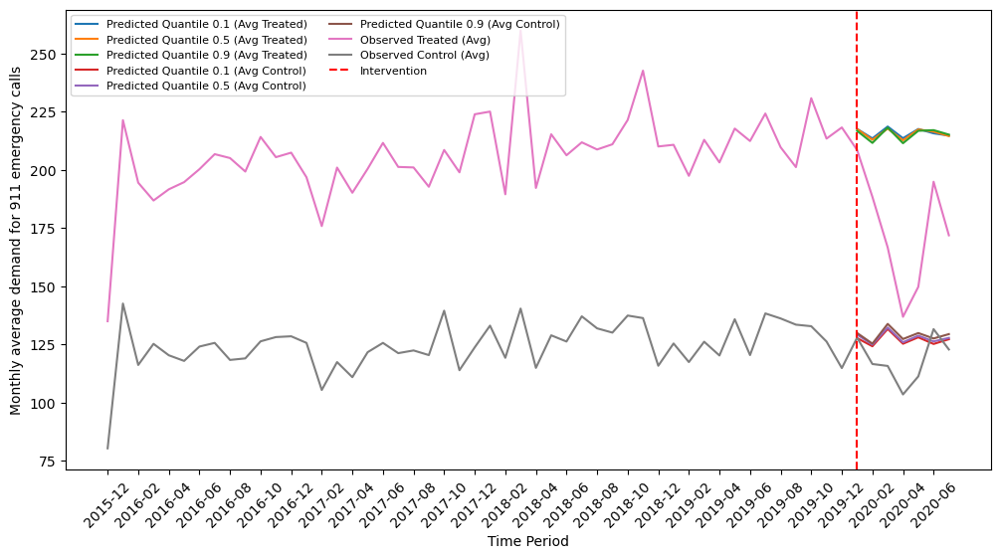

Treated Group - Mean: 19.398517897300415 Median: 19.888804920739663
Control Group - Mean: 8.525667853556655 Median: 6.665019663781571
Shapiro-Wilk test p-value for Treated Group: 0.8075667023658752
Shapiro-Wilk test p-value for Control Group: 0.5748091340065002
T-Test p-value: 0.003952851840901288


In [3]:
dataset_name = 'calls911_benchmarks'
data_type = 'calls911'
model = 'DeepProbCP'
forecast_horizon = 7
table2(dataset_name, data_type, model, forecast_horizon, plot_or_not=True)

In [18]:
dataset_name = 'sim_10_60_l_ho'
data_type = 'sim'
model = 'causalimpact'
forecast_horizon = 12
quantiles = ['0.1','0.5','0.9']
# csv_files = {q: './results/nn_model_results/rnn/processed_ensemble_forecasts/'+dataset_name+'_LSTMcell_cocob_without_stl_decomposition_'\
#                  +f'{q}.txt' for q in quantiles} 
single_data = pd.read_csv('./results/benchmarks/predicted/' + dataset_name +\
                 '_' + model +'.csv', header=None).T

data_wor = pd.read_csv('./datasets/text_data/'+data_type+'/'+dataset_name+'.csv')
data_wr = pd.read_csv('./datasets/text_data/'+data_type+'/'+dataset_name+'_for_errors.csv').iloc[:,1:]
no_of_series = len(data_wor.columns)
length_of_series = len(data_wor.index)

tnc = [0] * int((no_of_series)/2) +\
    [1] * int(no_of_series-int((no_of_series)/2))
print(len(tnc))
actual_treated_orig_A = data_wr.iloc[length_of_series-forecast_horizon:, int(no_of_series-int((no_of_series)/2))-1:]
data_index = data_wor

averages_predicted_treated = single_data[single_data.columns[tnc_bool]]
        
actual_treated_intervened = data_index[data_index.columns[tnc_bool]]
averages_actual_treated = actual_treated_intervened.mean(axis=1)

averages_predicted_control = single_data[single_data.columns[flipped_tnc_bool]]

averages_actual_control = data_index[data_index.columns[flipped_tnc_bool]].mean(axis=1)

# for tte
smoothed_pred = averages_predicted_treated

# if data_type == "calls911":
actual_treated_intervened_A = actual_treated_intervened.iloc[-forecast_horizon:, :]

10


In [17]:
single_data[single_data.columns[tnc_bool]]

,5,6,7,8,9
0,7.100683,5.124819,6.433581,6.148518,5.499151
1,8.337541,5.203502,6.423549,7.251567,4.868924
2,8.631191,5.134811,6.471272,7.689183,4.540572
3,7.381044,5.238239,6.615974,7.787040,6.038115
4,7.379600,4.538223,6.888081,8.678325,4.775356
5,7.056493,3.574203,6.957645,8.512536,2.520041
6,6.675498,3.387370,6.968300,8.674707,3.323581
7,6.590183,3.024056,6.803790,8.670522,1.734338
8,6.525843,3.041597,7.173610,9.798222,1.940212
9,6.683378,2.179502,7.503053,10.790681,0.757175


In [19]:
#### Total Treatement Effect for q > 90%
smoothed_pred.index = actual_treated_intervened_A.index
quantile_90_orig = actual_treated_orig_A.apply(lambda row: row.quantile([0.9]), axis=1)
quantile_90_actual = actual_treated_intervened_A.apply(lambda row: row.quantile([0.9]), axis=1)
quantile_90_pred = smoothed_pred.apply(lambda row: row.quantile([0.9]), axis=1)
tte_90_true = actual_treated_intervened_A[actual_treated_intervened_A.gt(np.array(quantile_90_actual), axis=1)].mean(axis=1) - \
                    actual_treated_orig_A[actual_treated_orig_A.gt(np.array(quantile_90_orig), axis=1)].mean(axis=1)
tte_90_pred = actual_treated_intervened_A[actual_treated_intervened_A.gt(np.array(quantile_90_actual), axis=1)].mean(axis=1) - \
                    smoothed_pred[smoothed_pred.gt(np.array(quantile_90_pred), axis=1)].mean(axis=1)

print('True Average Treatement Effect on the Treated Unit for q > 90%: : ', str(tte_90_true.mean()))
print('Average Treatment Effect on the Treated Unit for q > 90%: ', str(tte_90_pred.mean()))

True Average Treatement Effect on the Treated Unit for q > 90%: :  1.3650308462837772
Average Treatment Effect on the Treated Unit for q > 90%:  0.4088662393173011


[2.         1.88076205 1.0263589  0.00334311 0.22615759 2.
 0.29366796 2.         0.4366037  0.57308059 1.15475603 2.        ]
mean_SMAPE for TTE :1.132894160748083


sim_10_60_l_ho
(12, 10)
10
True Average Treatement Effect on the Treated Unit for q > 90%: :  1.3650308462837772
Average Treatment Effect on the Treated Unit for q > 90%:  -0.3055036408767599
mean_SMAPE for TTE :1.2277484311161169


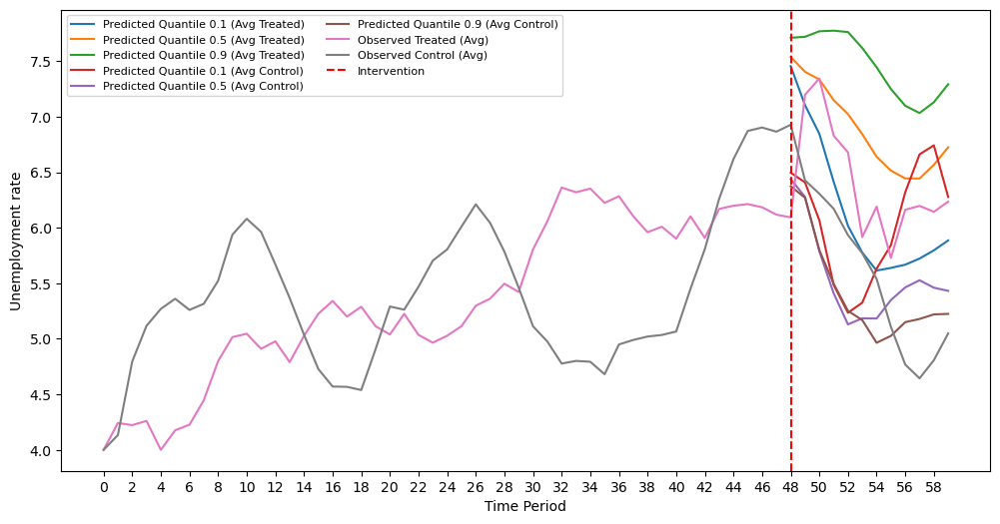

Treated Group - Mean: 7.14631838530789 Median: 5.68097112512448
Control Group - Mean: 9.920601541103162 Median: 10.11711289123157
Shapiro-Wilk test p-value for Treated Group: 0.14308686554431915
Shapiro-Wilk test p-value for Control Group: 0.7659654021263123
T-Test p-value: 0.23281270550210023
 
sim_10_60_nl_ho
(12, 10)
10
True Average Treatement Effect on the Treated Unit for q > 90%: :  2.492755423923825
Average Treatment Effect on the Treated Unit for q > 90%:  5.305863241169867
mean_SMAPE for TTE :0.9563562298427216


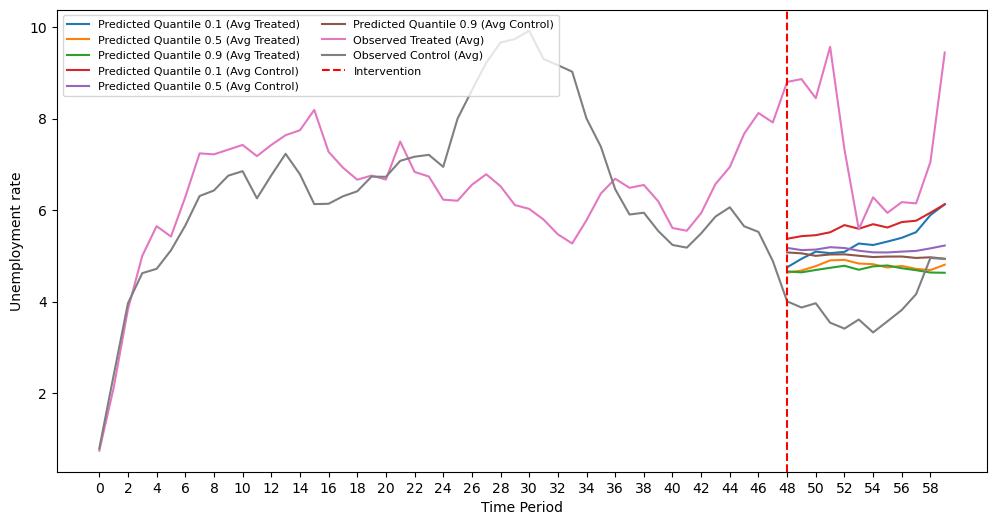

Treated Group - Mean: 56.480249473222834 Median: 49.73986710110492
Control Group - Mean: 23.536053256792048 Median: 24.76199226167526
Shapiro-Wilk test p-value for Treated Group: 0.05435645207762718
Shapiro-Wilk test p-value for Control Group: 0.06859075278043747
T-Test p-value: 0.00791226776152495
 
sim_10_222_l_ho
(12, 10)
10
True Average Treatement Effect on the Treated Unit for q > 90%: :  2.5418054451841
Average Treatment Effect on the Treated Unit for q > 90%:  2.3462616963723497
mean_SMAPE for TTE :0.20960971056655509


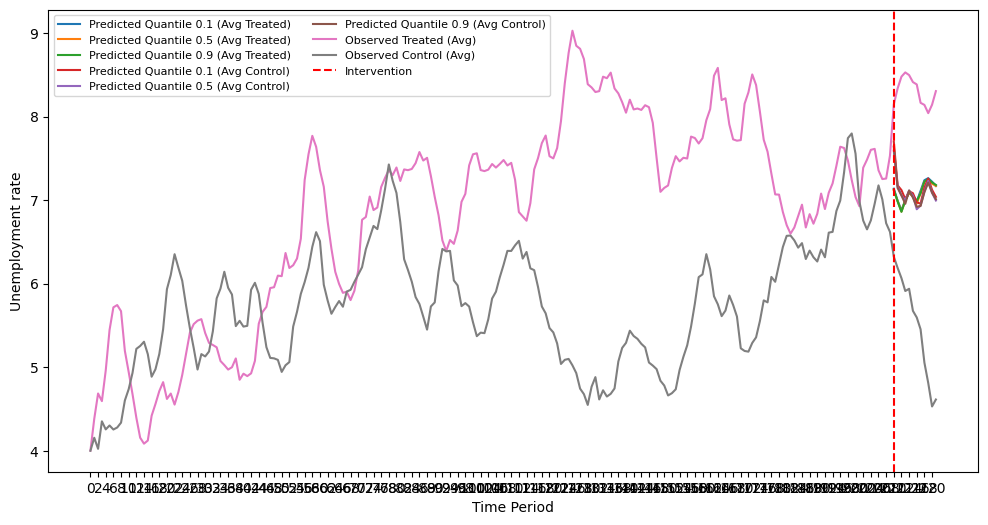

Treated Group - Mean: 17.26794222114833 Median: 17.56447828539934
Control Group - Mean: 22.38056592158271 Median: 19.172194969708258
Shapiro-Wilk test p-value for Treated Group: 0.5826295018196106
Shapiro-Wilk test p-value for Control Group: 0.03606397286057472
Wilcoxon test p-value: 0.33935546875
 
sim_10_222_nl_ho
(12, 10)
10
True Average Treatement Effect on the Treated Unit for q > 90%: :  2.9018507485705833
Average Treatment Effect on the Treated Unit for q > 90%:  -0.0340503416393203
mean_SMAPE for TTE :1.5863266831415104


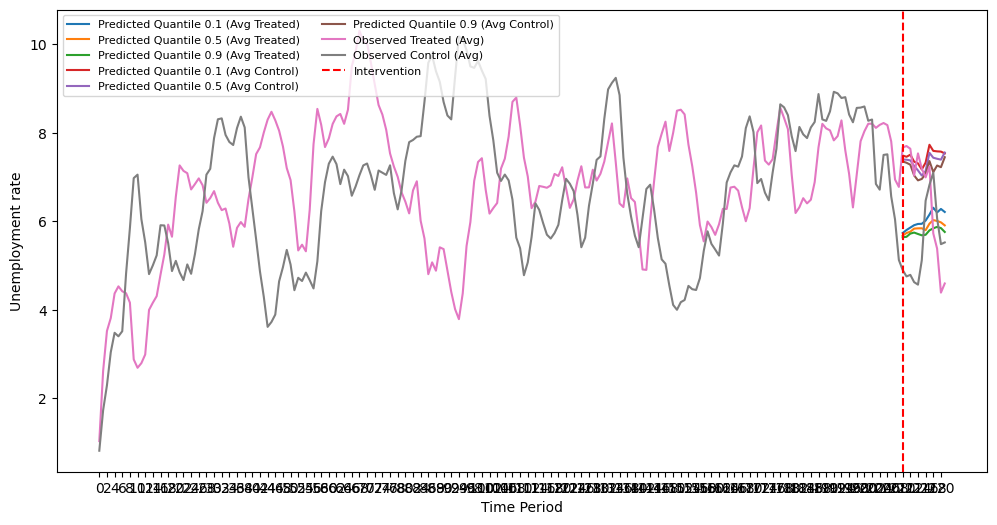

Treated Group - Mean: 23.413179389093557 Median: 22.630508569106937
Control Group - Mean: 24.870603872191356 Median: 27.038059340025434
Shapiro-Wilk test p-value for Treated Group: 0.3599071204662323
Shapiro-Wilk test p-value for Control Group: 0.04262544959783554
Wilcoxon test p-value: 0.38037109375
 
sim_101_60_l_ho
(12, 101)
101
True Average Treatement Effect on the Treated Unit for q > 90%: :  2.080015196911815
Average Treatment Effect on the Treated Unit for q > 90%:  1.305056353300714
mean_SMAPE for TTE :0.588512029149694


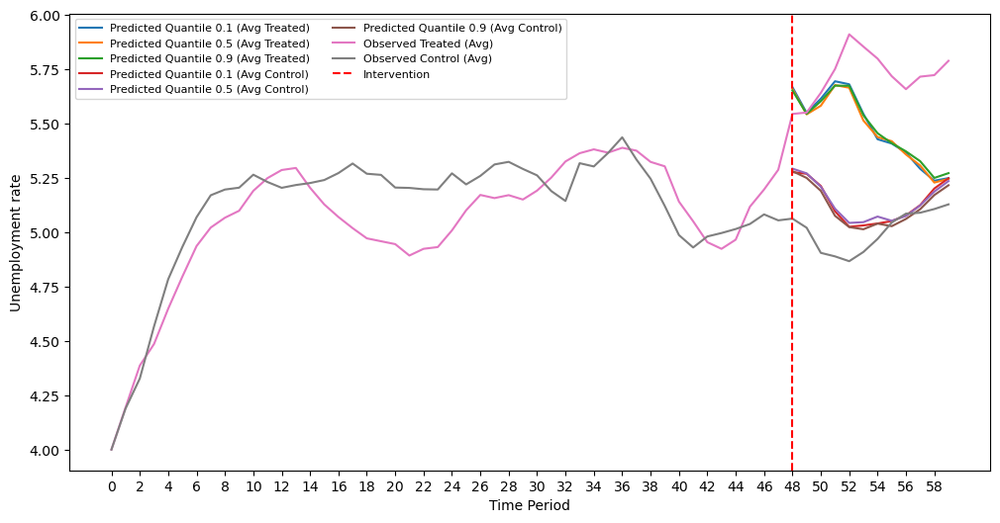

Treated Group - Mean: 5.02522121309923 Median: 5.562546392973071
Control Group - Mean: 2.6739382934457256 Median: 2.3836179636107984
Shapiro-Wilk test p-value for Treated Group: 0.6262862086296082
Shapiro-Wilk test p-value for Control Group: 0.6043128967285156
T-Test p-value: 0.12517119894775017
 
sim_101_60_nl_ho
(12, 101)
101
True Average Treatement Effect on the Treated Unit for q > 90%: :  3.0385411072075974
Average Treatment Effect on the Treated Unit for q > 90%:  0.4778263050573644
mean_SMAPE for TTE :1.3554173688026196


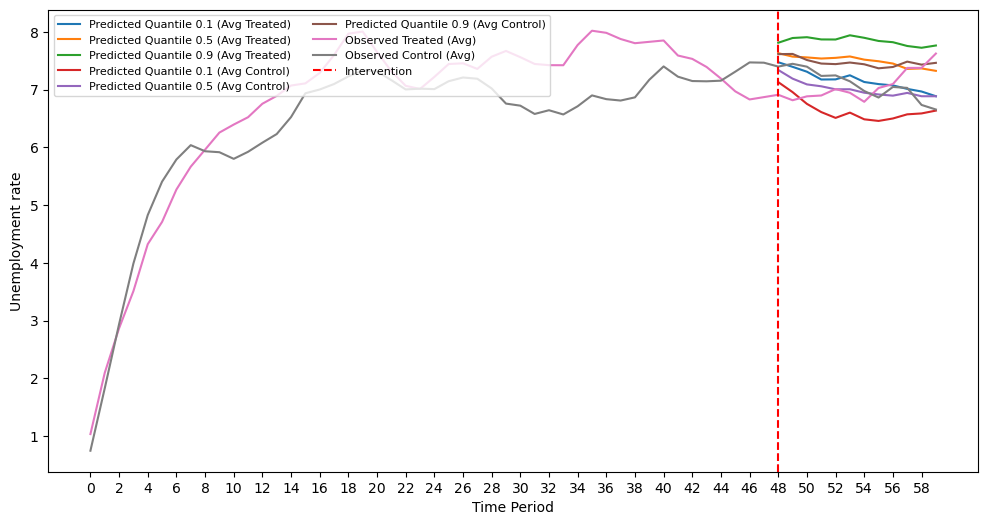

Treated Group - Mean: 6.450129595428503 Median: 7.7316724099370155
Control Group - Mean: 2.233506392408263 Median: 2.1844202143386053
Shapiro-Wilk test p-value for Treated Group: 0.04871198162436485
Shapiro-Wilk test p-value for Control Group: 0.6425687074661255
Wilcoxon test p-value: 0.0048828125
 
sim_101_222_l_ho
(12, 101)
101
True Average Treatement Effect on the Treated Unit for q > 90%: :  2.592828716096483
Average Treatment Effect on the Treated Unit for q > 90%:  2.582263561150762
mean_SMAPE for TTE :0.13809073915397393


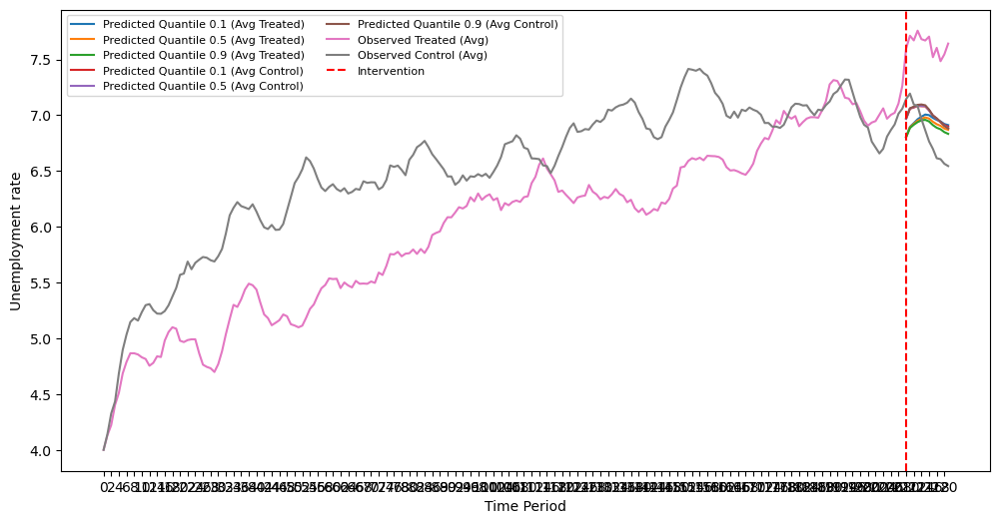

Treated Group - Mean: 10.350702703924021 Median: 10.399335834425084
Control Group - Mean: 3.125764668006323 Median: 3.5259579408448674
Shapiro-Wilk test p-value for Treated Group: 0.3784087300300598
Shapiro-Wilk test p-value for Control Group: 0.12231338024139404
T-Test p-value: 1.465725465174764e-06
 
sim_101_222_nl_ho
(12, 101)
101
True Average Treatement Effect on the Treated Unit for q > 90%: :  2.8790365504901403
Average Treatment Effect on the Treated Unit for q > 90%:  2.8377477842791214
mean_SMAPE for TTE :0.22852967942208716


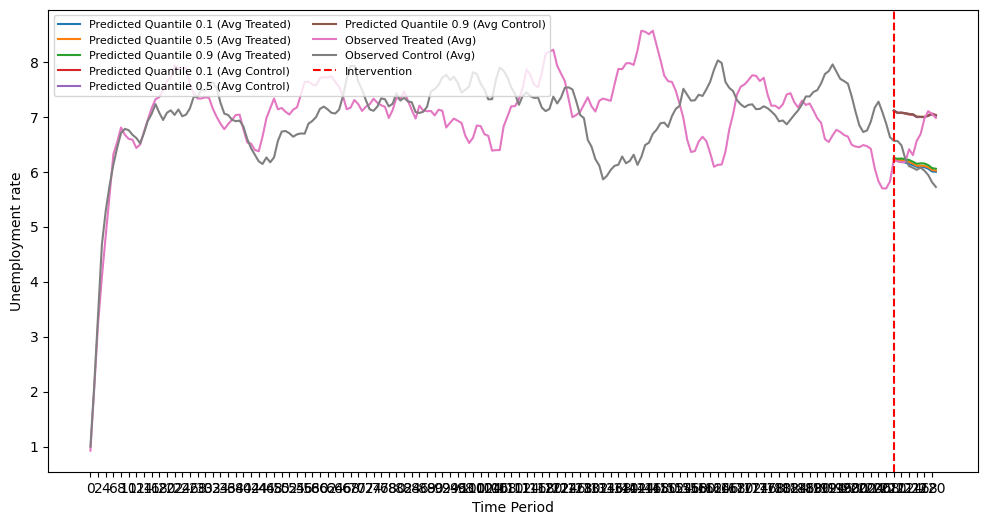

Treated Group - Mean: 7.362939119733735 Median: 5.585367098494807
Control Group - Mean: 12.88876203494914 Median: 13.570119108374012
Shapiro-Wilk test p-value for Treated Group: 0.024866359308362007
Shapiro-Wilk test p-value for Control Group: 0.3460095524787903
Wilcoxon test p-value: 0.00341796875
 
sim_500_60_l_ho
(12, 500)
500
True Average Treatement Effect on the Treated Unit for q > 90%: :  2.255246493880215
Average Treatment Effect on the Treated Unit for q > 90%:  1.6830541402731092
mean_SMAPE for TTE :0.5258440032739203


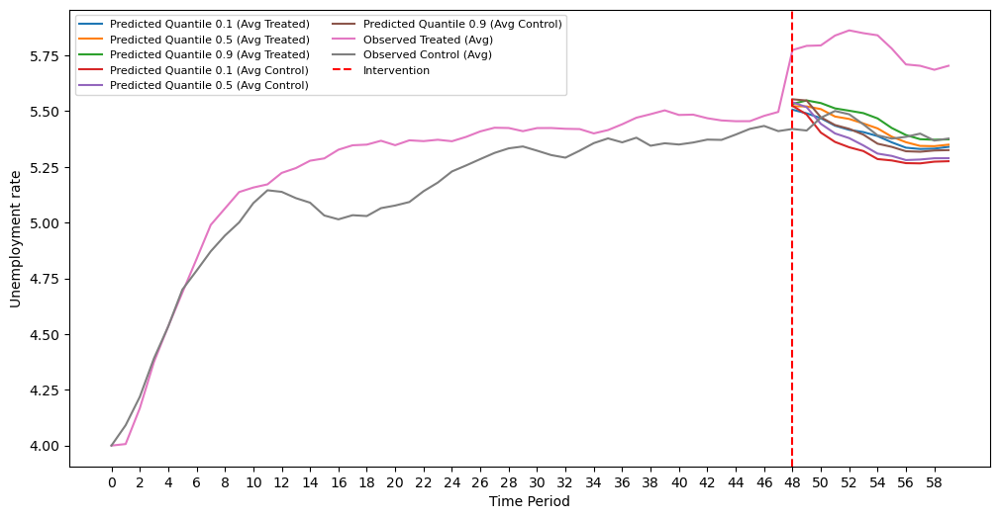

Treated Group - Mean: 6.442936668066999 Median: 6.623411416458585
Control Group - Mean: 1.712227237597715 Median: 1.8188962878897903
Shapiro-Wilk test p-value for Treated Group: 0.11374864727258682
Shapiro-Wilk test p-value for Control Group: 0.02266007289290428
Wilcoxon test p-value: 0.00048828125
 
sim_500_60_nl_ho
(12, 500)
500
True Average Treatement Effect on the Treated Unit for q > 90%: :  3.1625222107604984
Average Treatment Effect on the Treated Unit for q > 90%:  2.030268791571873
mean_SMAPE for TTE :0.506143534239225


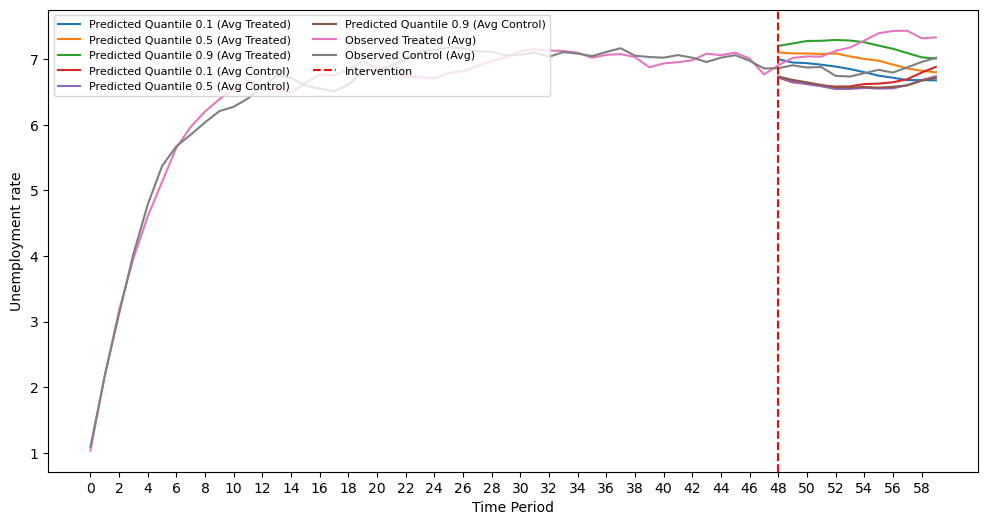

Treated Group - Mean: 4.0222439079870265 Median: 3.3790952060946817
Control Group - Mean: 3.662272151836327 Median: 3.7966921581938093
Shapiro-Wilk test p-value for Treated Group: 0.04338759183883667
Shapiro-Wilk test p-value for Control Group: 0.17635351419448853
Wilcoxon test p-value: 0.67724609375
 
sim_500_222_l_ho
(12, 500)
500
True Average Treatement Effect on the Treated Unit for q > 90%: :  2.5674855168681625
Average Treatment Effect on the Treated Unit for q > 90%:  1.5830570270094402
mean_SMAPE for TTE :0.6366967239678551


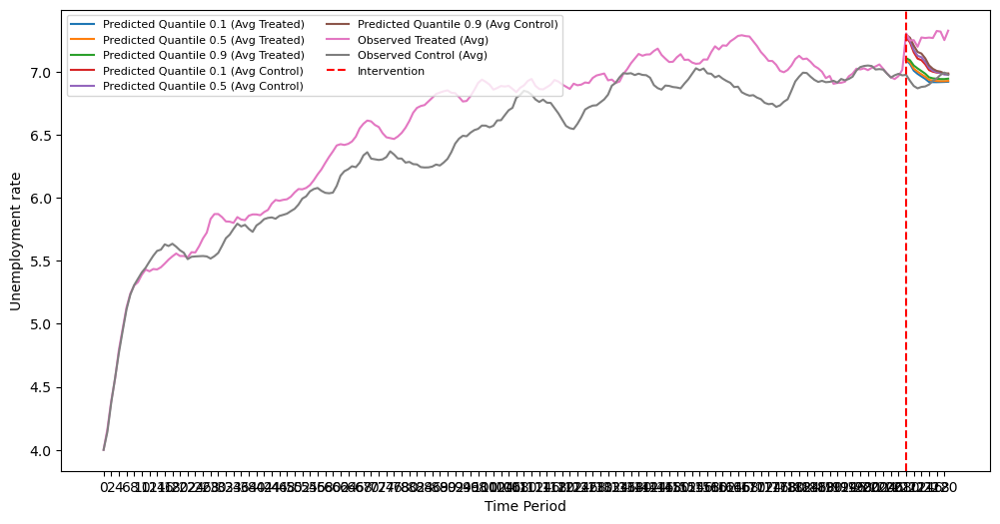

Treated Group - Mean: 4.301235355721173 Median: 4.561553132865653
Control Group - Mean: 2.208919200790223 Median: 2.3293211284256583
Shapiro-Wilk test p-value for Treated Group: 0.19621053338050842
Shapiro-Wilk test p-value for Control Group: 0.11292150616645813
T-Test p-value: 0.026748771018189708
 
sim_500_222_nl_ho
(12, 500)
500
True Average Treatement Effect on the Treated Unit for q > 90%: :  3.052281293202109
Average Treatment Effect on the Treated Unit for q > 90%:  3.192265027161674
mean_SMAPE for TTE :0.15245089054571534


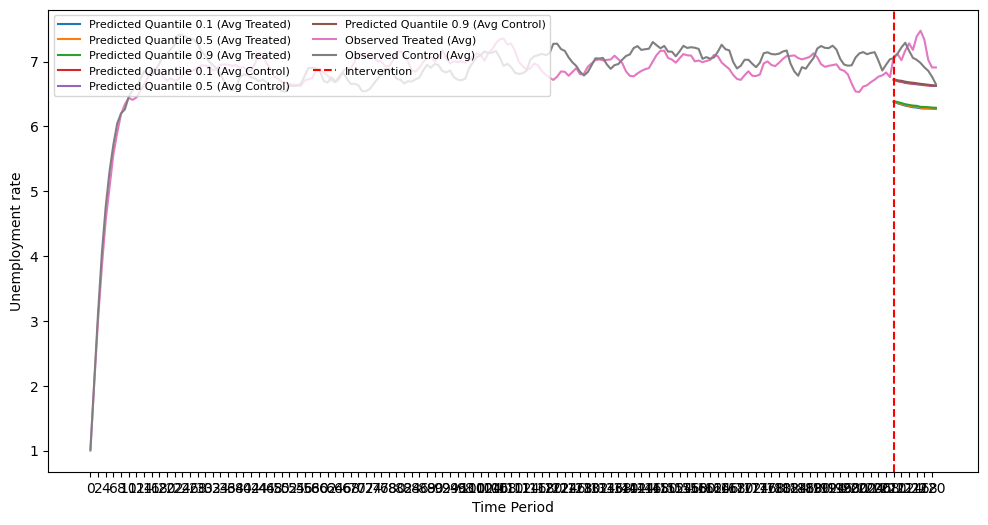

Treated Group - Mean: 13.368278429823802 Median: 12.544525471930756
Control Group - Mean: 5.170386360094995 Median: 5.2642306704383355
Shapiro-Wilk test p-value for Treated Group: 0.2261284738779068
Shapiro-Wilk test p-value for Control Group: 0.996844470500946
T-Test p-value: 3.962826381116997e-06
 
sim_10_60_l_he
(12, 10)
10
True Average Treatement Effect on the Treated Unit for q > 90%: :  0.7508459062654844
Average Treatment Effect on the Treated Unit for q > 90%:  -2.0013166348470492
mean_SMAPE for TTE :1.3074674273480278


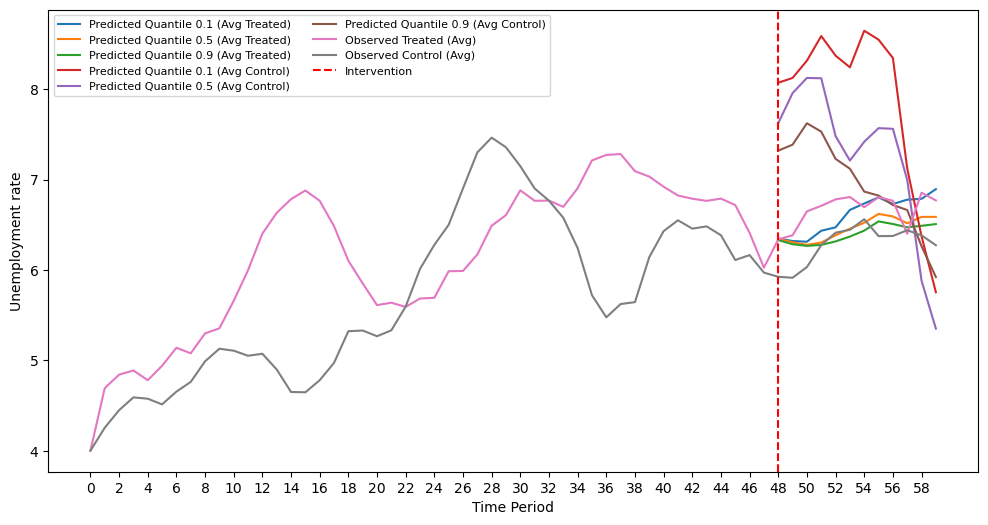

Treated Group - Mean: 3.4968345914544607 Median: 2.775580295407287
Control Group - Mean: 16.508838436029524 Median: 15.733743316486187
Shapiro-Wilk test p-value for Treated Group: 0.34933382272720337
Shapiro-Wilk test p-value for Control Group: 0.3237222731113434
T-Test p-value: 3.349053639433633e-05
 
sim_10_60_nl_he
(12, 10)
10
True Average Treatement Effect on the Treated Unit for q > 90%: :  2.986924125892758
Average Treatment Effect on the Treated Unit for q > 90%:  1.1673608430067317
mean_SMAPE for TTE :0.9201204031570224


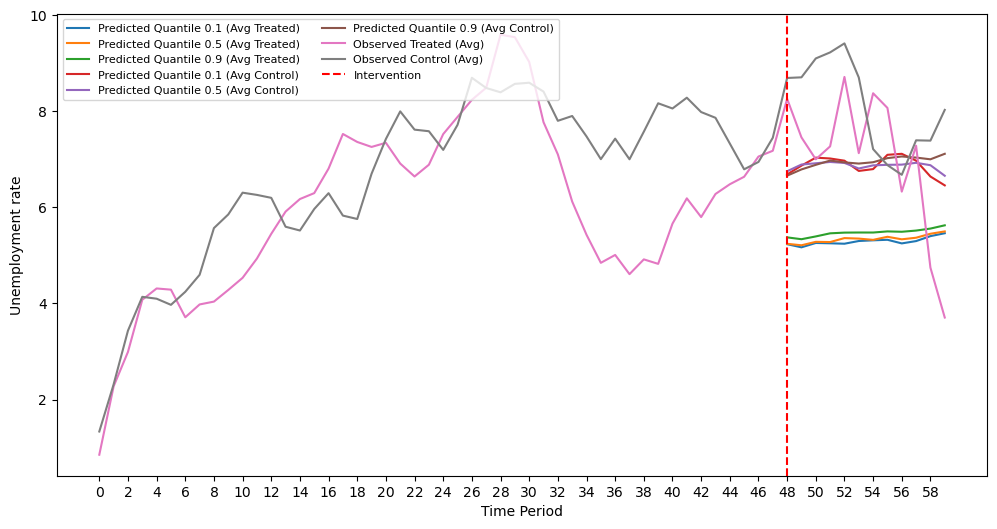

Treated Group - Mean: 39.46579911142123 Median: 36.6997073909197
Control Group - Mean: 18.8398250700014 Median: 23.46277396415835
Shapiro-Wilk test p-value for Treated Group: 0.6612281799316406
Shapiro-Wilk test p-value for Control Group: 0.06944043934345245
T-Test p-value: 0.0015716093770814057
 
sim_10_222_l_he
(12, 10)
10
True Average Treatement Effect on the Treated Unit for q > 90%: :  -0.15427761455658695
Average Treatment Effect on the Treated Unit for q > 90%:  -0.7009294280246546
mean_SMAPE for TTE :0.9684160407078458


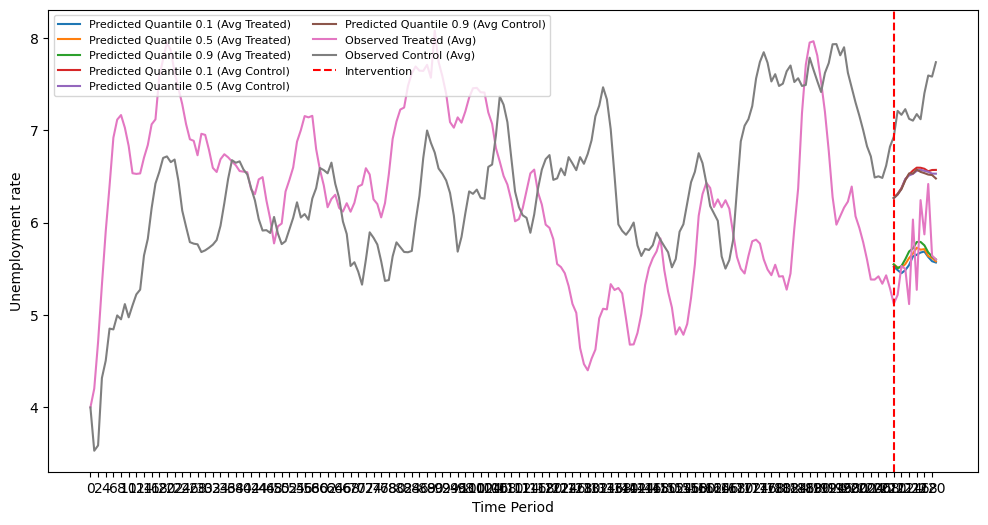

Treated Group - Mean: 5.3749627565874505 Median: 5.944945336975612
Control Group - Mean: 12.364991114053778 Median: 12.11226033182286
Shapiro-Wilk test p-value for Treated Group: 0.22015997767448425
Shapiro-Wilk test p-value for Control Group: 0.46164602041244507
T-Test p-value: 0.0030904889713522167
 
sim_10_222_nl_he
(12, 10)
10
True Average Treatement Effect on the Treated Unit for q > 90%: :  1.6994226634140002
Average Treatment Effect on the Treated Unit for q > 90%:  1.874602261722285
mean_SMAPE for TTE :0.731214481912485


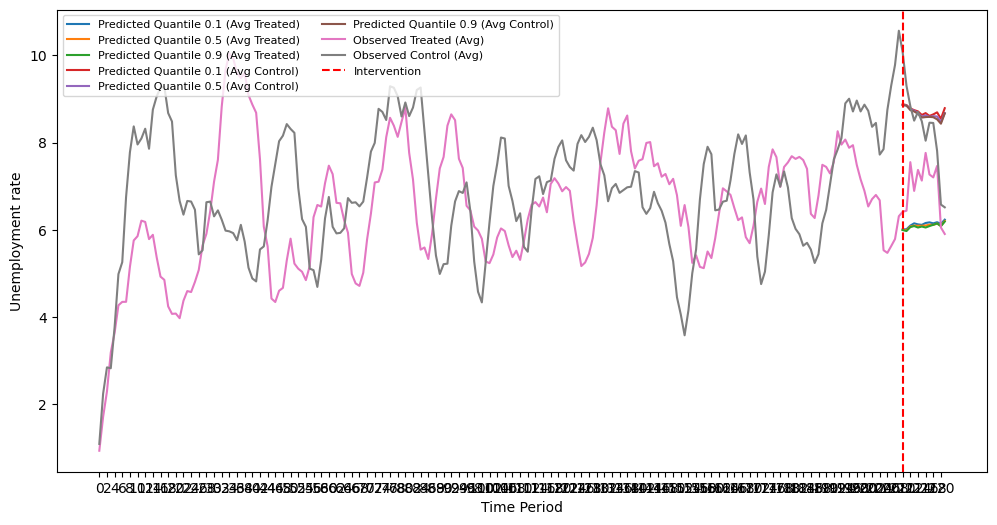

Treated Group - Mean: 15.04000951998151 Median: 17.41028536388683
Control Group - Mean: 7.512954417891777 Median: 3.8444318845209677
Shapiro-Wilk test p-value for Treated Group: 0.642418384552002
Shapiro-Wilk test p-value for Control Group: 0.009804795496165752
Wilcoxon test p-value: 0.17626953125
 
sim_101_60_l_he
(12, 101)
101
True Average Treatement Effect on the Treated Unit for q > 90%: :  3.0706363348683783
Average Treatment Effect on the Treated Unit for q > 90%:  3.7413835156163464
mean_SMAPE for TTE :0.3716729400817504


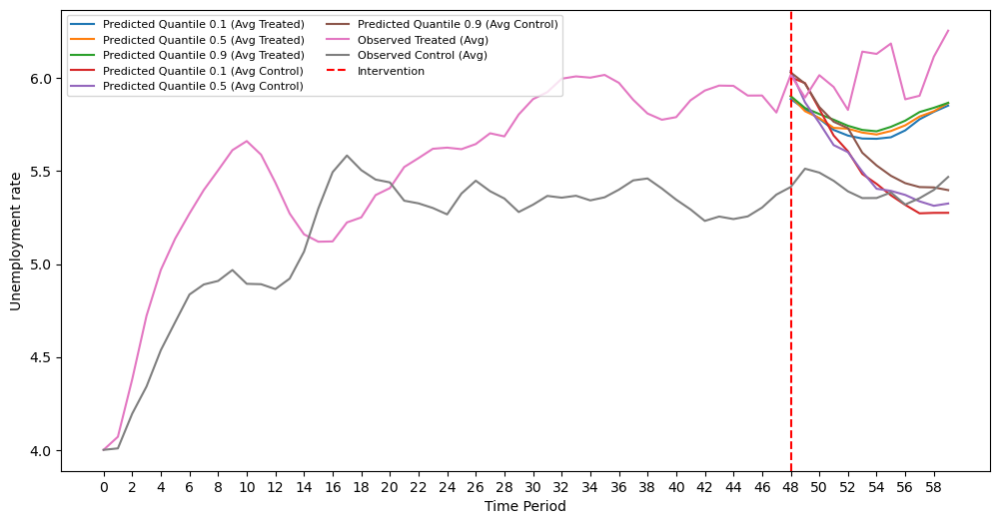

Treated Group - Mean: 4.358110453789057 Median: 3.911621685831517
Control Group - Mean: 3.123404775907637 Median: 2.6414789367020486
Shapiro-Wilk test p-value for Treated Group: 0.0973445251584053
Shapiro-Wilk test p-value for Control Group: 0.06721775978803635
T-Test p-value: 0.3867692198231929
 
sim_101_60_nl_he
(12, 101)
101
True Average Treatement Effect on the Treated Unit for q > 90%: :  3.0640631051167166
Average Treatment Effect on the Treated Unit for q > 90%:  1.7218182756446188
mean_SMAPE for TTE :0.8220907765852323


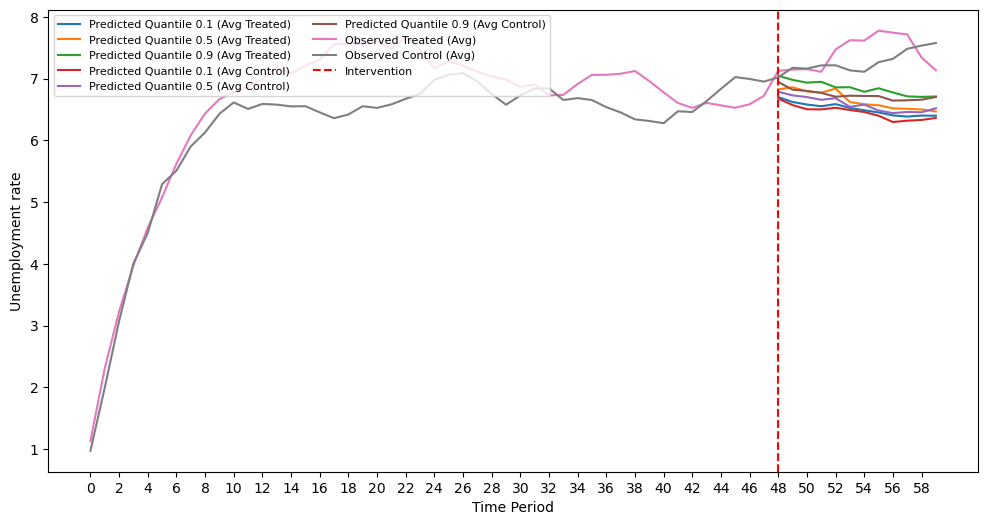

Treated Group - Mean: 11.482976420667157 Median: 11.612214738090564
Control Group - Mean: 10.406655173382187 Median: 8.697711481275384
Shapiro-Wilk test p-value for Treated Group: 0.08245905488729477
Shapiro-Wilk test p-value for Control Group: 0.2694462835788727
T-Test p-value: 0.42857667965765844
 
sim_101_222_l_he
(12, 101)
101
True Average Treatement Effect on the Treated Unit for q > 90%: :  2.353568361350783
Average Treatment Effect on the Treated Unit for q > 90%:  2.889756121870098
mean_SMAPE for TTE :0.21770166717366016


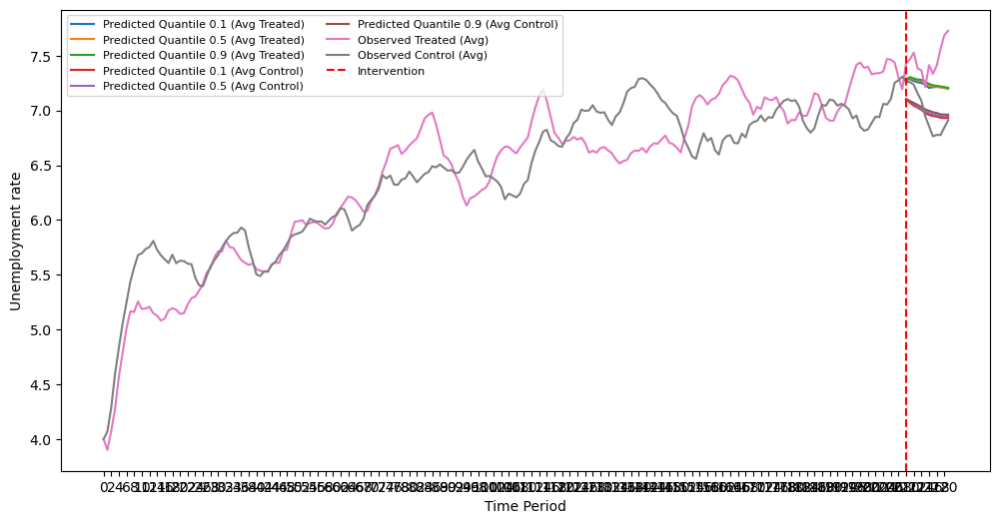

Treated Group - Mean: 3.066578571263515 Median: 2.4537182384556457
Control Group - Mean: 1.8584124267445257 Median: 1.9689937131099184
Shapiro-Wilk test p-value for Treated Group: 0.06500251591205597
Shapiro-Wilk test p-value for Control Group: 0.2959732115268707
T-Test p-value: 0.11599068266147346
 
sim_101_222_nl_he
(12, 101)
101
True Average Treatement Effect on the Treated Unit for q > 90%: :  3.9865590709073255
Average Treatment Effect on the Treated Unit for q > 90%:  3.7704199158795517
mean_SMAPE for TTE :0.40783637930133815


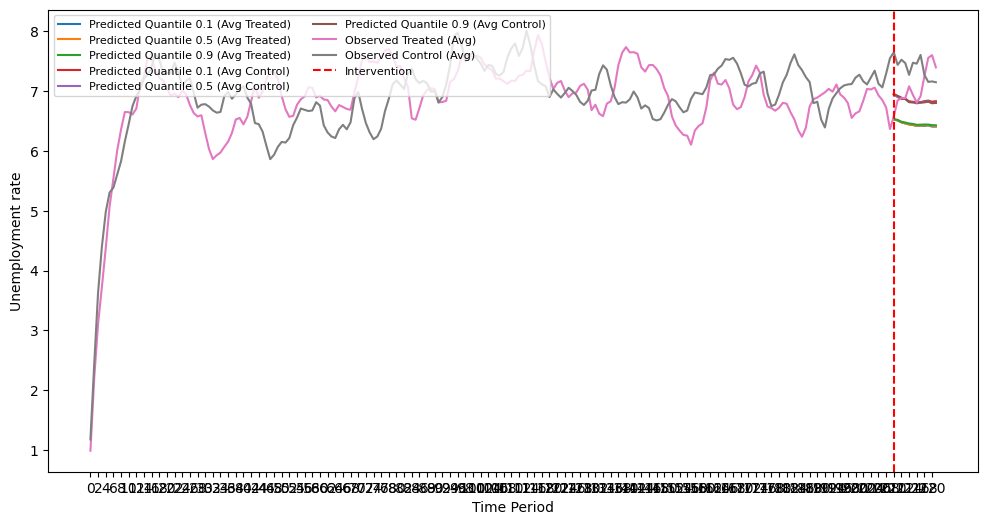

Treated Group - Mean: 9.497394994935313 Median: 7.674446402045461
Control Group - Mean: 7.940024311164861 Median: 8.17894858441607
Shapiro-Wilk test p-value for Treated Group: 0.3871399760246277
Shapiro-Wilk test p-value for Control Group: 0.5480363965034485
T-Test p-value: 0.48128980434214597
 
sim_500_60_l_he
(12, 500)
500
True Average Treatement Effect on the Treated Unit for q > 90%: :  1.573119762057276
Average Treatment Effect on the Treated Unit for q > 90%:  1.3942275387358203
mean_SMAPE for TTE :0.5898496034706417


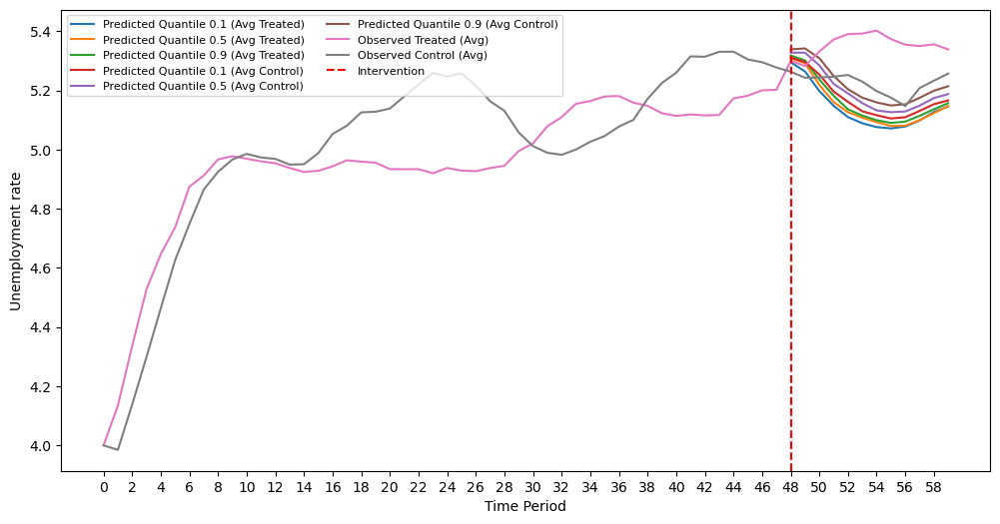

Treated Group - Mean: 3.979407520831425 Median: 4.729175682031935
Control Group - Mean: 1.0719938188030596 Median: 1.1770468245404047
Shapiro-Wilk test p-value for Treated Group: 0.02326052635908127
Shapiro-Wilk test p-value for Control Group: 0.2500048875808716
Wilcoxon test p-value: 0.00341796875
 
sim_500_60_nl_he
(12, 500)
500
True Average Treatement Effect on the Treated Unit for q > 90%: :  2.1767980454062545
Average Treatment Effect on the Treated Unit for q > 90%:  1.4187184855894788
mean_SMAPE for TTE :0.486840761028783


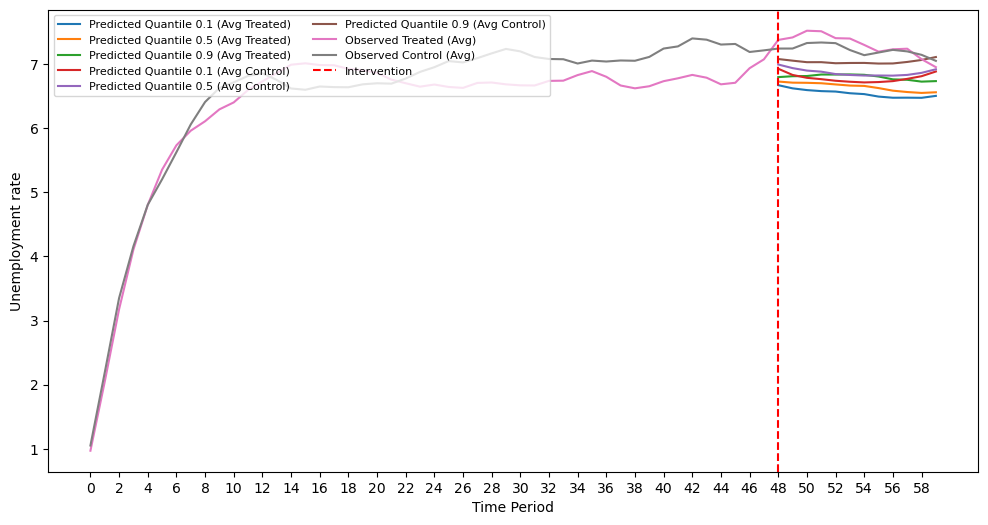

Treated Group - Mean: 9.86945536789177 Median: 10.042492127748478
Control Group - Mean: 5.05897396128596 Median: 5.314852469328356
Shapiro-Wilk test p-value for Treated Group: 0.4541682302951813
Shapiro-Wilk test p-value for Control Group: 0.77852863073349
T-Test p-value: 3.252666083529835e-09
 
sim_500_222_l_he
(12, 500)
500
True Average Treatement Effect on the Treated Unit for q > 90%: :  2.1153736510739116
Average Treatment Effect on the Treated Unit for q > 90%:  1.6558332820446602
mean_SMAPE for TTE :0.5857355075236222


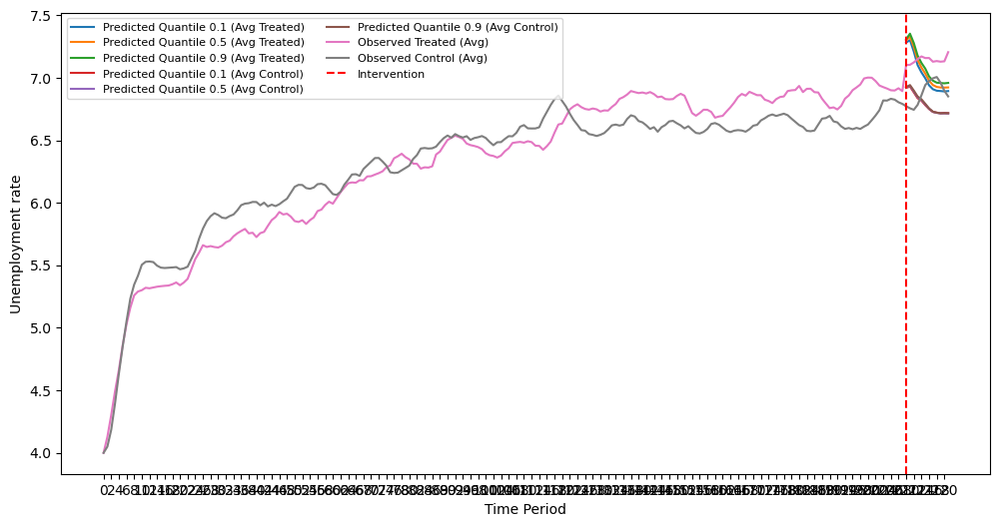

Treated Group - Mean: 2.414335936476807 Median: 2.684747158112849
Control Group - Mean: 2.548371607796756 Median: 2.438903617006053
Shapiro-Wilk test p-value for Treated Group: 0.26035913825035095
Shapiro-Wilk test p-value for Control Group: 0.7096280455589294
T-Test p-value: 0.6423337959484142
 
sim_500_222_nl_he
(12, 500)
500
True Average Treatement Effect on the Treated Unit for q > 90%: :  2.7214775465194383
Average Treatment Effect on the Treated Unit for q > 90%:  1.7483889625640945
mean_SMAPE for TTE :0.650242593957967


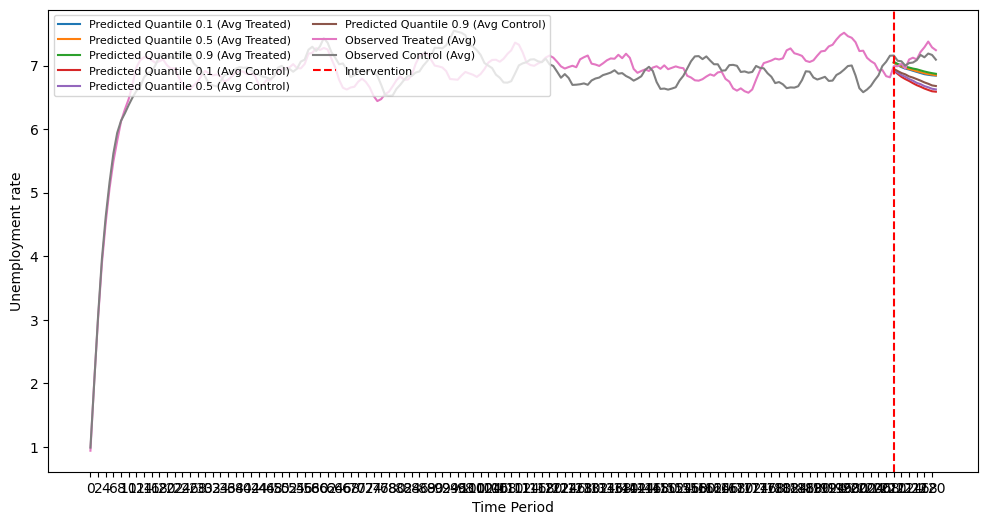

Treated Group - Mean: 3.2918344494935305 Median: 2.736936433466953
Control Group - Mean: 5.147748036297424 Median: 4.770986203080188
Shapiro-Wilk test p-value for Treated Group: 0.1674053817987442
Shapiro-Wilk test p-value for Control Group: 0.0944291204214096
T-Test p-value: 2.297679964215454e-06
 


In [4]:
# 'calls911_benchmarks',\
dataset_name_test = ['sim_10_60_l_ho','sim_10_60_nl_ho',\
                     'sim_10_222_l_ho','sim_10_222_nl_ho',\
                     'sim_101_60_l_ho', 'sim_101_60_nl_ho',\
                     'sim_101_222_l_ho', 'sim_101_222_nl_ho',\
                     'sim_500_60_l_ho', 'sim_500_60_nl_ho',\
                     'sim_500_222_l_ho', 'sim_500_222_nl_ho',\
                     'sim_10_60_l_he', 'sim_10_60_nl_he',\
                     'sim_10_222_l_he', 'sim_10_222_nl_he',\
                     'sim_101_60_l_he', 'sim_101_60_nl_he',\
                     'sim_101_222_l_he', 'sim_101_222_nl_he',\
                     'sim_500_60_l_he', 'sim_500_60_nl_he',\
                     'sim_500_222_l_he', 'sim_500_222_nl_he']
data_type = ['sim']*24 # ['calls911'] + 
forecast_horizon = [12]*24 # [7] + 
model = 'DeepProbCP'
for i in range(len(dataset_name_test)):
    print(dataset_name_test[i])
    table2(dataset_name_test[i], data_type[i], model, forecast_horizon[i], plot_or_not=True)
    print(" ")

calls911_benchmarks
Average Treatment Effect for q > 10%:  -6.538817072939992
Average Treatment Effect for q > 50%:  1.1403568534910278
Average Treatment Effect for q > 90%:  -10.704341132518493


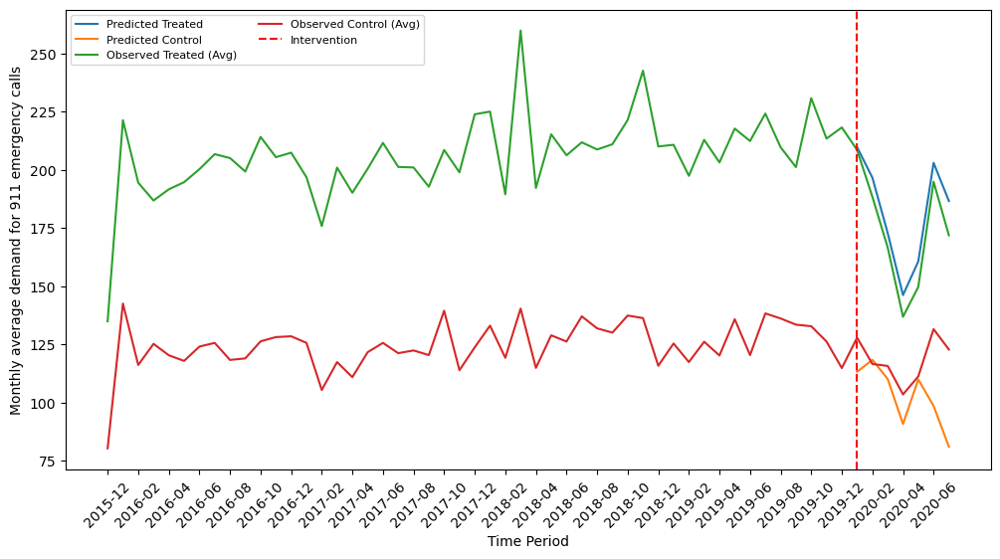

Treated Group - Mean: 4.779983415018875 Median: 4.189468159824407
Control Group - Mean: 17.11968503116398 Median: 12.972156387693948
Shapiro-Wilk test p-value for Treated Group: 0.7072099447250366
Shapiro-Wilk test p-value for Control Group: 0.10779312998056412
T-Test p-value: 0.1211825422298793
 
sim_10_60_l_ho
10
True Average Treatement Effect on the Treated Unit for q > 90%: :  1.3650308462837772
Average Treatment Effect on the Treated Unit for q > 90%:  0.4088662393173011
mean_SMAPE for TTE :1.2334533184196281


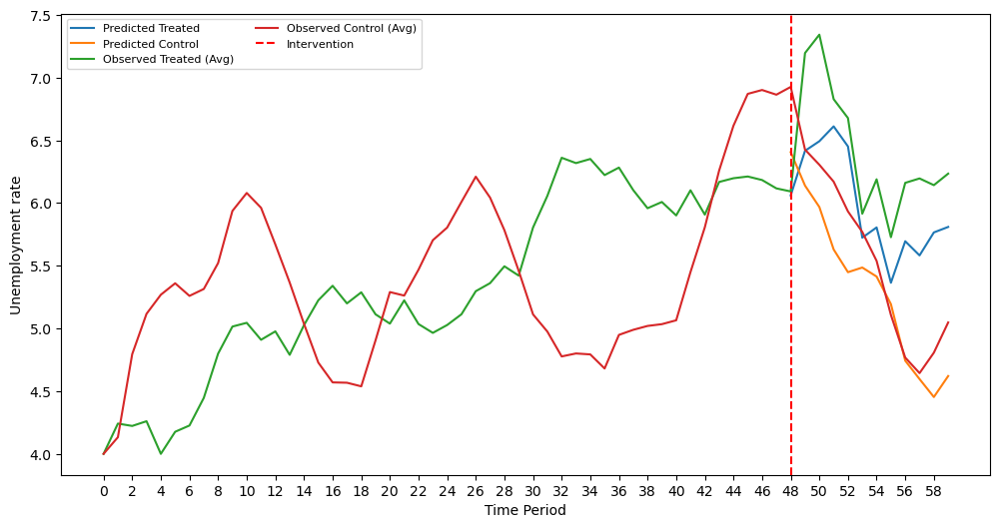

Treated Group - Mean: 6.859142953582183 Median: 6.694590015841505
Control Group - Mean: 5.402534966083343 Median: 5.411626682081943
Shapiro-Wilk test p-value for Treated Group: 0.6685587167739868
Shapiro-Wilk test p-value for Control Group: 0.16506536304950714
T-Test p-value: 0.4337030358895585
 
sim_10_60_nl_ho
10
True Average Treatement Effect on the Treated Unit for q > 90%: :  2.492755423923825
Average Treatment Effect on the Treated Unit for q > 90%:  1.934854619289264
mean_SMAPE for TTE :1.104595487753986


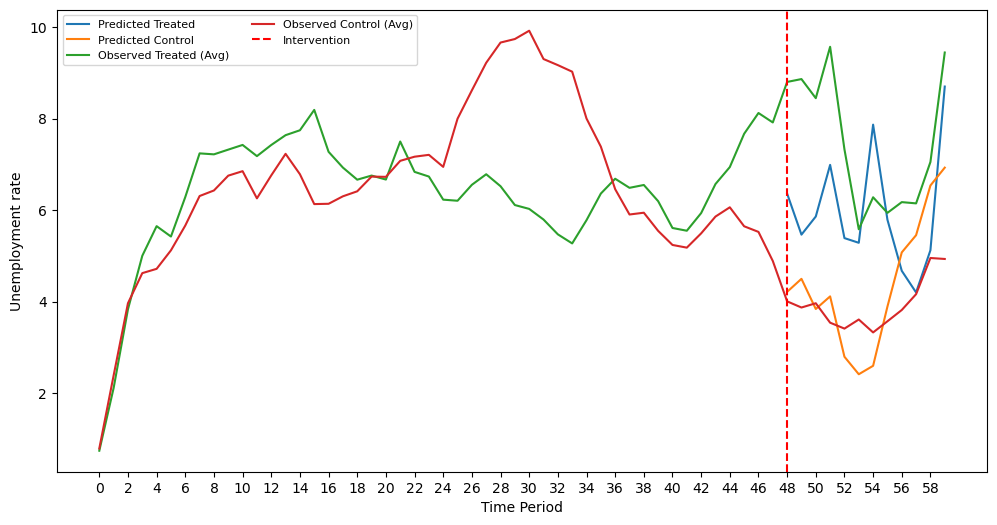

Treated Group - Mean: 30.88152716903896 Median: 36.448573992583846
Control Group - Mean: 20.451933067067106 Median: 22.82126929121873
Shapiro-Wilk test p-value for Treated Group: 0.3735867738723755
Shapiro-Wilk test p-value for Control Group: 0.31294316053390503
T-Test p-value: 0.19980940213798926
 
sim_10_222_l_ho
10
True Average Treatement Effect on the Treated Unit for q > 90%: :  2.5418054451841
Average Treatment Effect on the Treated Unit for q > 90%:  6.340838480310169
mean_SMAPE for TTE :0.8531286472863223


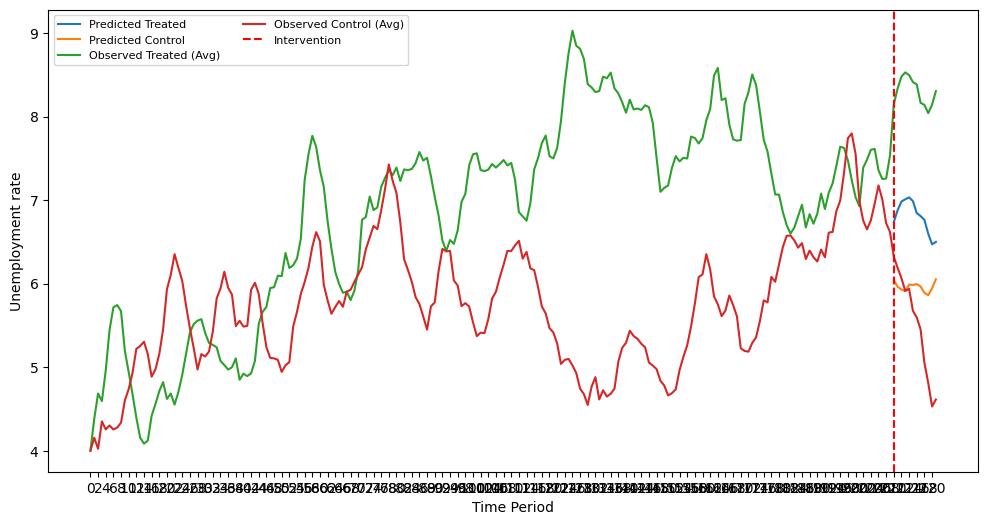

Treated Group - Mean: 22.052453149906956 Median: 21.300959650520713
Control Group - Mean: 9.31219136405809 Median: 5.924655011515906
Shapiro-Wilk test p-value for Treated Group: 0.003932680934667587
Shapiro-Wilk test p-value for Control Group: 0.06206376850605011
Wilcoxon test p-value: 0.00048828125
 
sim_10_222_nl_ho
10
True Average Treatement Effect on the Treated Unit for q > 90%: :  2.9018507485705833
Average Treatment Effect on the Treated Unit for q > 90%:  2.260706377551848
mean_SMAPE for TTE :0.48563596279775156


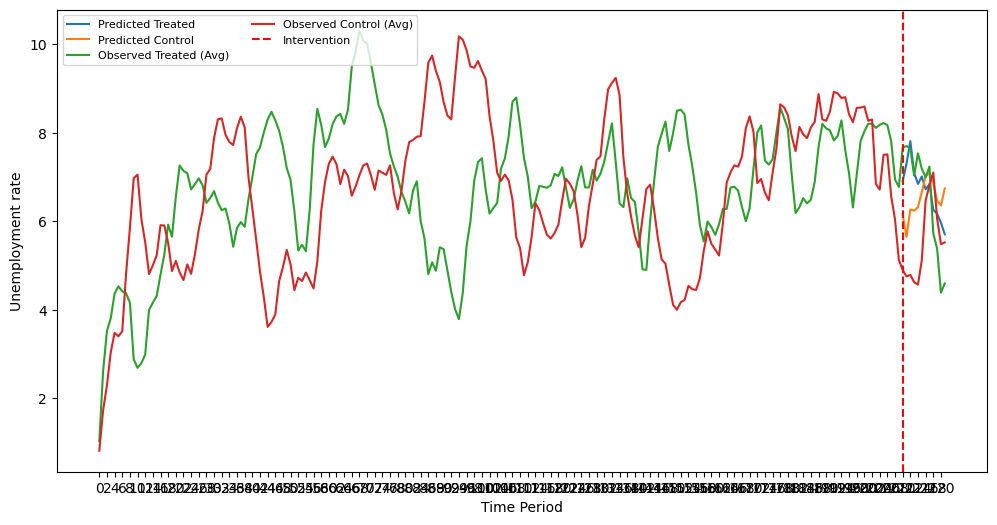

Treated Group - Mean: 9.09703397345646 Median: 7.160295064892715
Control Group - Mean: 15.817678594739062 Median: 16.935593120818424
Shapiro-Wilk test p-value for Treated Group: 0.1181935966014862
Shapiro-Wilk test p-value for Control Group: 0.2823305130004883
T-Test p-value: 0.09004088514174173
 
sim_101_60_l_ho
101
True Average Treatement Effect on the Treated Unit for q > 90%: :  2.080015196911815
Average Treatment Effect on the Treated Unit for q > 90%:  1.470217957895204
mean_SMAPE for TTE :0.35025115871555235


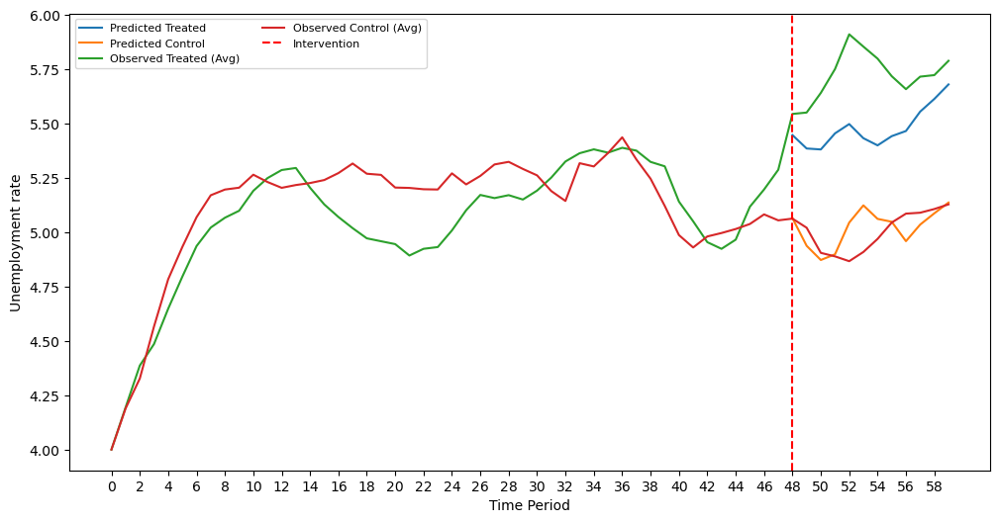

Treated Group - Mean: 4.427274732453457 Median: 4.17899505211339
Control Group - Mean: 1.3652090943861275 Median: 0.8798881735582029
Shapiro-Wilk test p-value for Treated Group: 0.12879329919815063
Shapiro-Wilk test p-value for Control Group: 0.05467082932591438
T-Test p-value: 6.126462221676292e-05
 
sim_101_60_nl_ho
101
True Average Treatement Effect on the Treated Unit for q > 90%: :  3.0385411072075974
Average Treatment Effect on the Treated Unit for q > 90%:  0.752247079836859
mean_SMAPE for TTE :1.2897589007091979


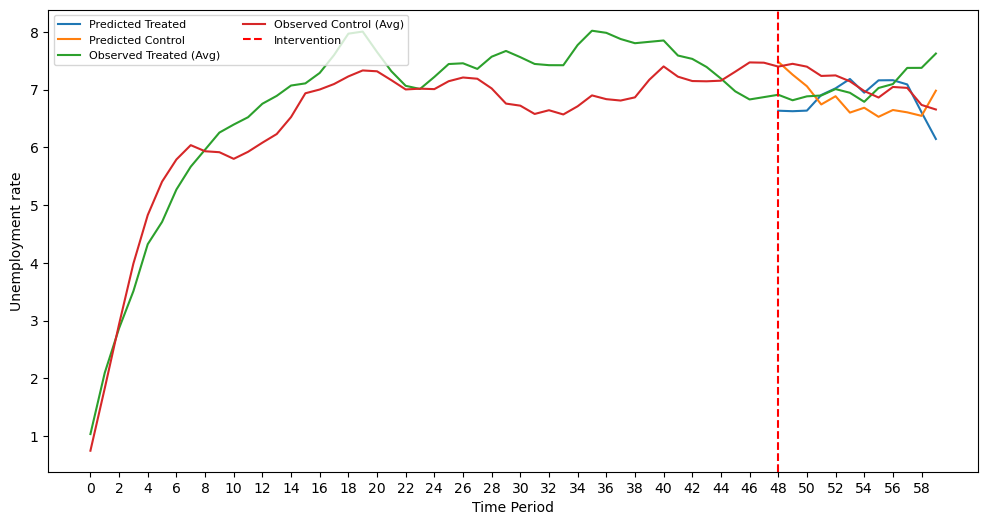

Treated Group - Mean: 4.933418508868683 Median: 3.0962234967025015
Control Group - Mean: 4.88918357817817 Median: 4.955457026083643
Shapiro-Wilk test p-value for Treated Group: 0.0003661444643512368
Shapiro-Wilk test p-value for Control Group: 0.9855207204818726
Wilcoxon test p-value: 0.4697265625
 
sim_101_222_l_ho
101
True Average Treatement Effect on the Treated Unit for q > 90%: :  2.592828716096483
Average Treatment Effect on the Treated Unit for q > 90%:  1.2442109940085884
mean_SMAPE for TTE :0.8166779434684145


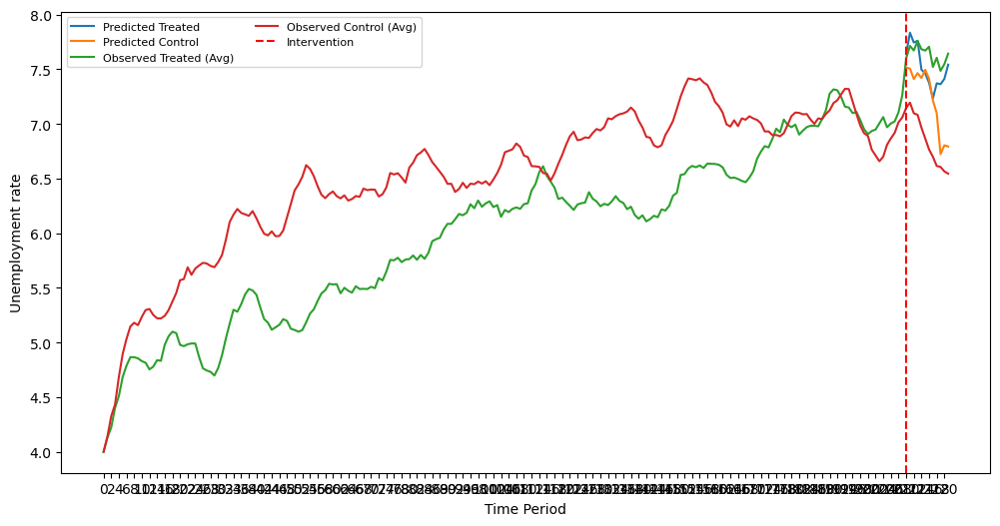

Treated Group - Mean: 2.0617894579942253 Median: 1.738832382932325
Control Group - Mean: 5.37436580423021 Median: 5.015312004842185
Shapiro-Wilk test p-value for Treated Group: 0.9179922938346863
Shapiro-Wilk test p-value for Control Group: 0.8687613010406494
T-Test p-value: 1.1219147764936092e-05
 
sim_101_222_nl_ho
101
True Average Treatement Effect on the Treated Unit for q > 90%: :  2.8790365504901403
Average Treatment Effect on the Treated Unit for q > 90%:  2.1040650871831894
mean_SMAPE for TTE :0.5476356133909751


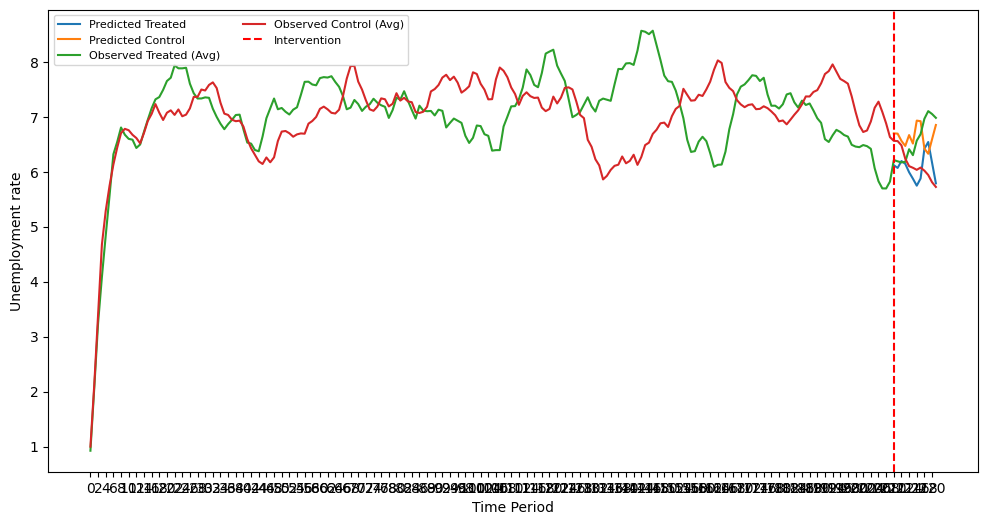

Treated Group - Mean: 8.231513930452993 Median: 7.90638245135853
Control Group - Mean: 7.493544939290669 Median: 6.510452300846256
Shapiro-Wilk test p-value for Treated Group: 0.3083397150039673
Shapiro-Wilk test p-value for Control Group: 0.4363206624984741
T-Test p-value: 0.2307318431407673
 
sim_500_60_l_ho
500
True Average Treatement Effect on the Treated Unit for q > 90%: :  2.255246493880215
Average Treatment Effect on the Treated Unit for q > 90%:  2.7004657836781614
mean_SMAPE for TTE :0.23162985771308872


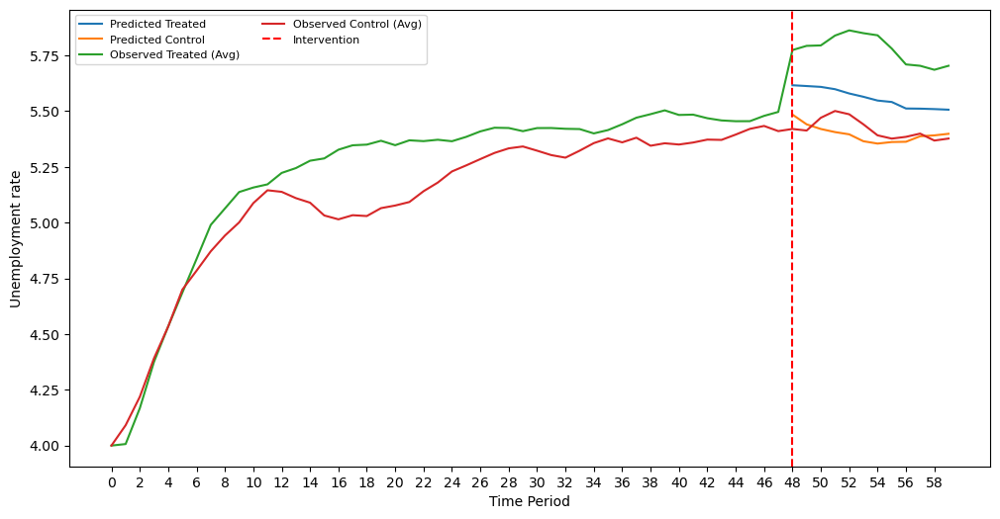

Treated Group - Mean: 3.9408340460480424 Median: 3.581568700836514
Control Group - Mean: 0.8233979794562964 Median: 0.5994718956403144
Shapiro-Wilk test p-value for Treated Group: 0.12064392119646072
Shapiro-Wilk test p-value for Control Group: 0.07958172261714935
T-Test p-value: 2.942352886583919e-08
 
sim_500_60_nl_ho
500
True Average Treatement Effect on the Treated Unit for q > 90%: :  3.1625222107604984
Average Treatment Effect on the Treated Unit for q > 90%:  4.452124315029073
mean_SMAPE for TTE :0.3328483044620158


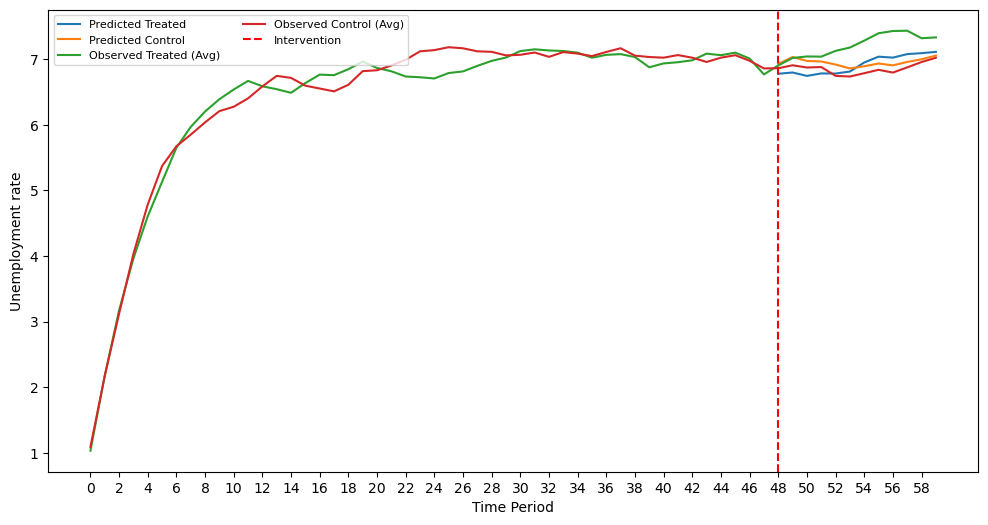

Treated Group - Mean: 4.232005001227832 Median: 4.59272439421927
Control Group - Mean: 1.3695493339184122 Median: 1.4132587726606876
Shapiro-Wilk test p-value for Treated Group: 0.3605567514896393
Shapiro-Wilk test p-value for Control Group: 0.8935973644256592
T-Test p-value: 4.7083933087085305e-07
 
sim_500_222_l_ho
500
True Average Treatement Effect on the Treated Unit for q > 90%: :  2.5674855168681625
Average Treatment Effect on the Treated Unit for q > 90%:  2.0940878415256754
mean_SMAPE for TTE :0.2036523263722324


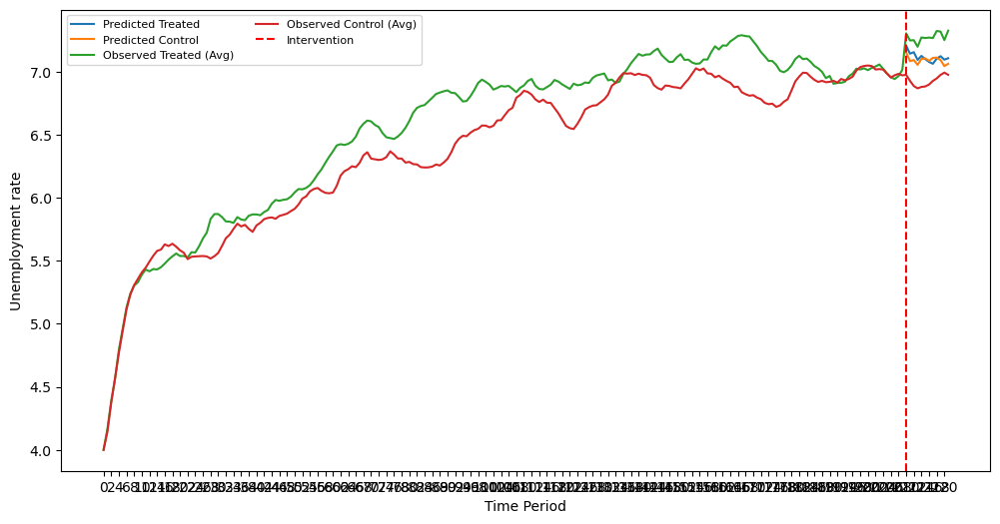

Treated Group - Mean: 2.2304864729957004 Median: 2.2749886468587333
Control Group - Mean: 2.3070531216725065 Median: 2.5268168919024783
Shapiro-Wilk test p-value for Treated Group: 0.0920289009809494
Shapiro-Wilk test p-value for Control Group: 0.1397031545639038
T-Test p-value: 0.8229237520144155
 
sim_500_222_nl_ho
500
True Average Treatement Effect on the Treated Unit for q > 90%: :  3.052281293202109
Average Treatment Effect on the Treated Unit for q > 90%:  2.4724833398281034
mean_SMAPE for TTE :0.21245438004850523


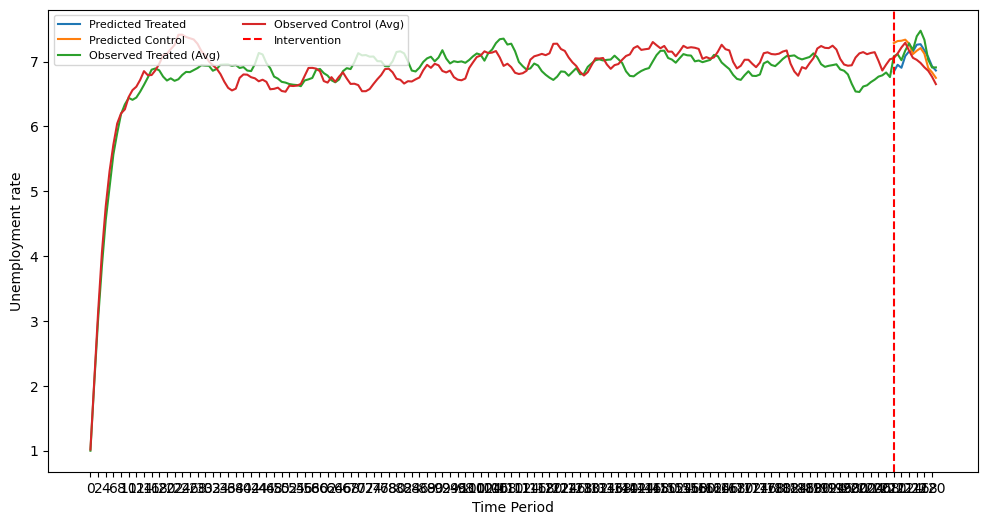

Treated Group - Mean: 1.6041942067262258 Median: 1.7003613406454883
Control Group - Mean: 1.7807438657600316 Median: 1.4831891715948777
Shapiro-Wilk test p-value for Treated Group: 0.6330583691596985
Shapiro-Wilk test p-value for Control Group: 0.11094122380018234
T-Test p-value: 0.1857933343218358
 
sim_10_60_l_he
10
True Average Treatement Effect on the Treated Unit for q > 90%: :  0.7508459062654844
Average Treatment Effect on the Treated Unit for q > 90%:  2.375846929315326
mean_SMAPE for TTE :1.0199534965613815


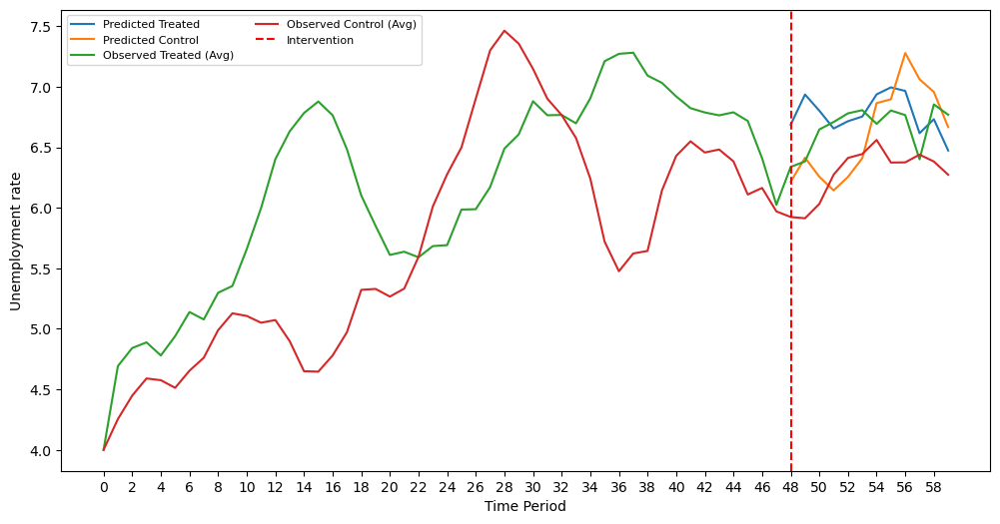

Treated Group - Mean: 3.0642555570404855 Median: 2.7992865685504955
Control Group - Mean: 5.721875020252598 Median: 5.295696799459961
Shapiro-Wilk test p-value for Treated Group: 0.18823812901973724
Shapiro-Wilk test p-value for Control Group: 0.938686728477478
T-Test p-value: 0.014560064729633275
 
sim_10_60_nl_he
10
True Average Treatement Effect on the Treated Unit for q > 90%: :  2.986924125892758
Average Treatment Effect on the Treated Unit for q > 90%:  -1.9566618247530083
mean_SMAPE for TTE :1.5208418027698993


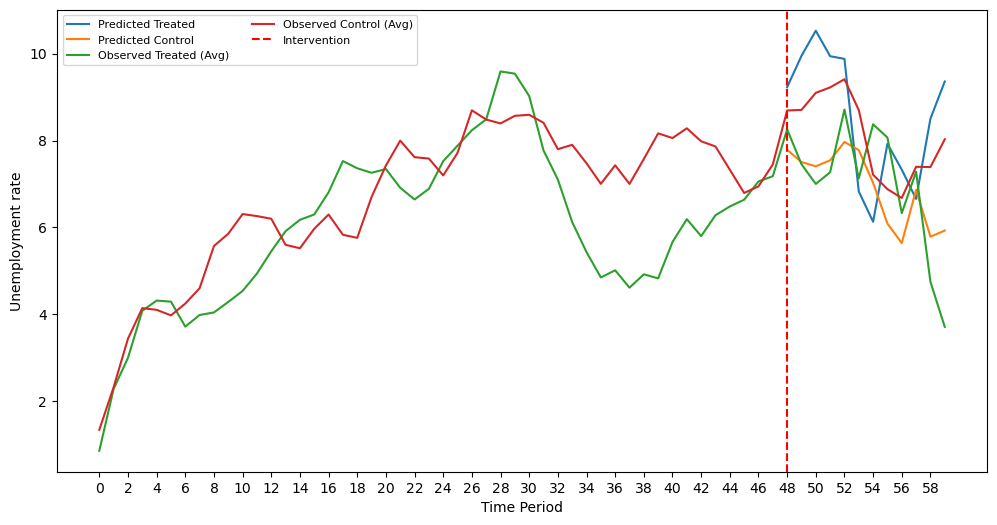

Treated Group - Mean: 23.202340890278478 Median: 19.369996420256896
Control Group - Mean: 17.31763096626985 Median: 17.068163213123697
Shapiro-Wilk test p-value for Treated Group: 0.36143121123313904
Shapiro-Wilk test p-value for Control Group: 0.9897517561912537
T-Test p-value: 0.16788679277106025
 
sim_10_222_l_he
10
True Average Treatement Effect on the Treated Unit for q > 90%: :  -0.15427761455658695
Average Treatment Effect on the Treated Unit for q > 90%:  -0.5436182809054638
mean_SMAPE for TTE :0.9823950235297941


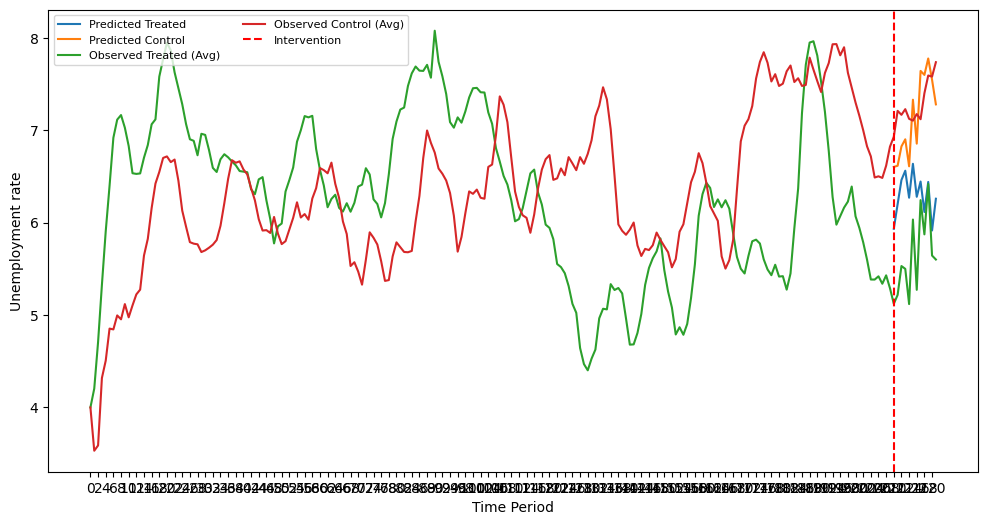

Treated Group - Mean: 10.509339156752283 Median: 12.093705050356068
Control Group - Mean: 4.809277336665583 Median: 4.829334219106818
Shapiro-Wilk test p-value for Treated Group: 0.19005529582500458
Shapiro-Wilk test p-value for Control Group: 0.9873142242431641
T-Test p-value: 0.002583369631898469
 
sim_10_222_nl_he
10
True Average Treatement Effect on the Treated Unit for q > 90%: :  1.6994226634140002
Average Treatment Effect on the Treated Unit for q > 90%:  5.249577344613422
mean_SMAPE for TTE :1.190735421465054


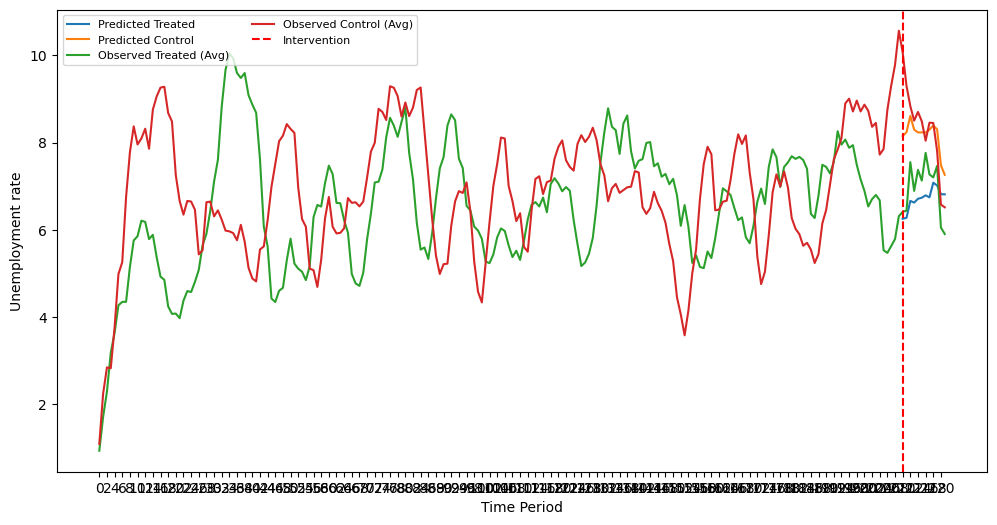

Treated Group - Mean: 7.744423695563739 Median: 7.072066713578394
Control Group - Mean: 6.955100649945145 Median: 4.395474456706832
Shapiro-Wilk test p-value for Treated Group: 0.2549007833003998
Shapiro-Wilk test p-value for Control Group: 0.01694267988204956
Wilcoxon test p-value: 0.2333984375
 
sim_101_60_l_he
101
True Average Treatement Effect on the Treated Unit for q > 90%: :  3.0706363348683783
Average Treatment Effect on the Treated Unit for q > 90%:  2.5791048119045166
mean_SMAPE for TTE :0.16900072680079448


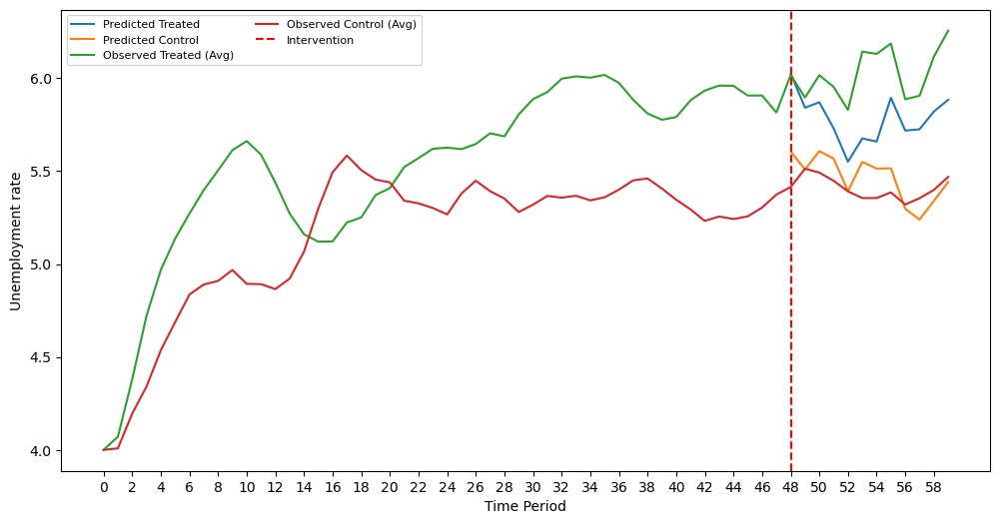

Treated Group - Mean: 4.285627395112658 Median: 4.423577294488162
Control Group - Mean: 1.7227587637774906 Median: 2.1018259972254545
Shapiro-Wilk test p-value for Treated Group: 0.8145986795425415
Shapiro-Wilk test p-value for Control Group: 0.2347659468650818
T-Test p-value: 0.006343874083013059
 
sim_101_60_nl_he
101
True Average Treatement Effect on the Treated Unit for q > 90%: :  3.0640631051167166
Average Treatment Effect on the Treated Unit for q > 90%:  0.626177461123571
mean_SMAPE for TTE :1.2463953581747254


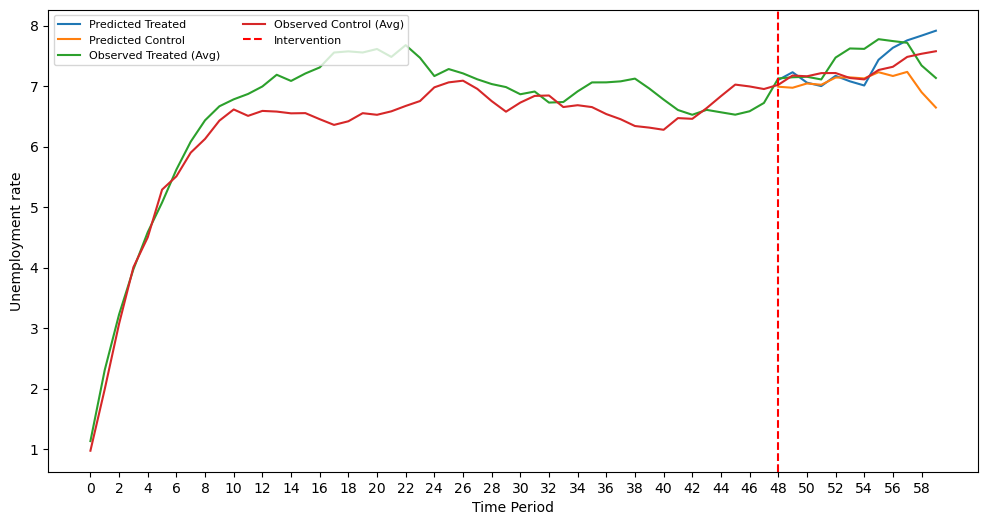

Treated Group - Mean: 3.970962184339662 Median: 2.8885053980955187
Control Group - Mean: 3.2039305387944648 Median: 1.9041085251522727
Shapiro-Wilk test p-value for Treated Group: 0.0803317055106163
Shapiro-Wilk test p-value for Control Group: 0.0012963138287886977
Wilcoxon test p-value: 0.9697265625
 
sim_101_222_l_he
101
True Average Treatement Effect on the Treated Unit for q > 90%: :  2.353568361350783
Average Treatment Effect on the Treated Unit for q > 90%:  0.8791696433119632
mean_SMAPE for TTE :1.0052581955322815


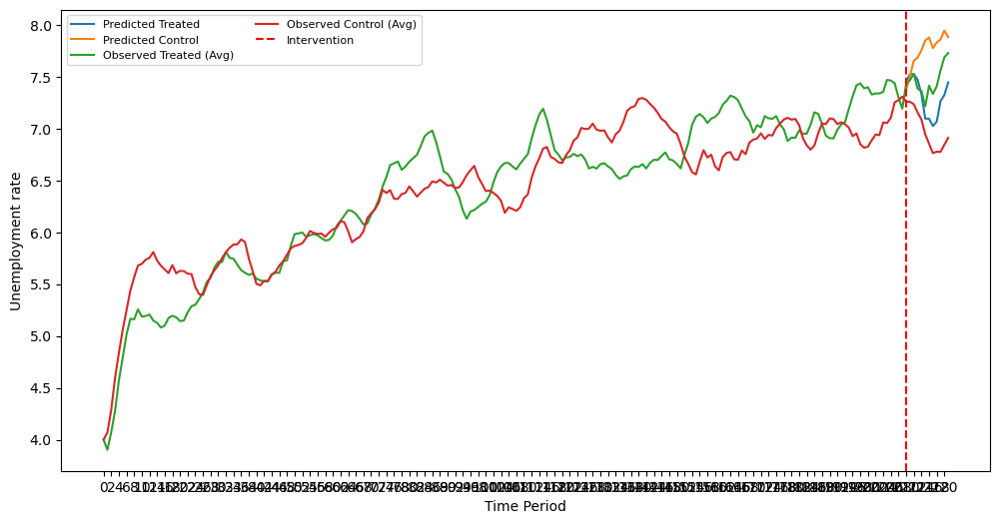

Treated Group - Mean: 2.5741562918523964 Median: 2.73123736716495
Control Group - Mean: 9.728928303449116 Median: 11.930811309345149
Shapiro-Wilk test p-value for Treated Group: 0.028080495074391365
Shapiro-Wilk test p-value for Control Group: 0.03602061793208122
Wilcoxon test p-value: 0.00048828125
 
sim_101_222_nl_he
101
True Average Treatement Effect on the Treated Unit for q > 90%: :  3.9865590709073255
Average Treatment Effect on the Treated Unit for q > 90%:  -1.4135548809753906
mean_SMAPE for TTE :1.790805718853952


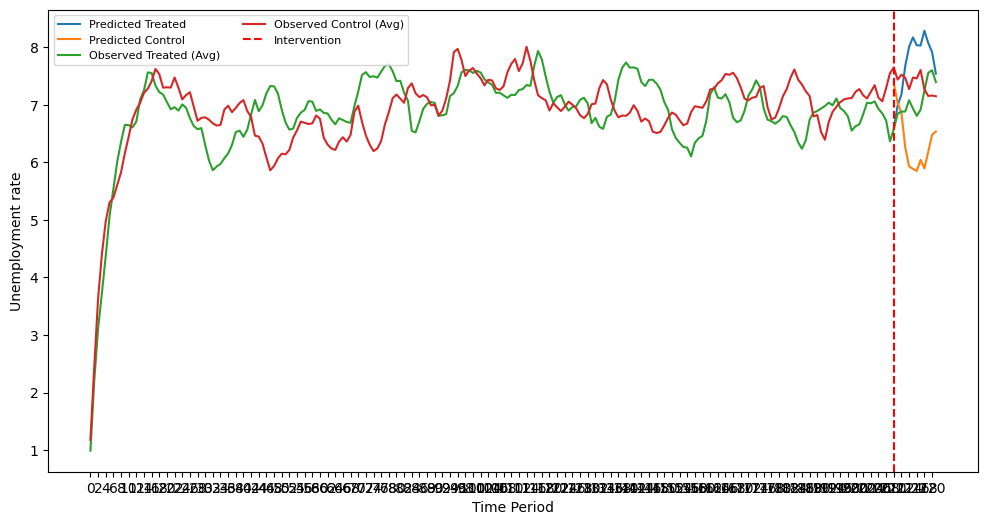

Treated Group - Mean: 8.133955875117222 Median: 8.407306476314663
Control Group - Mean: 16.704671039318573 Median: 17.54225921325198
Shapiro-Wilk test p-value for Treated Group: 0.1590013951063156
Shapiro-Wilk test p-value for Control Group: 0.20683200657367706
T-Test p-value: 1.4818661518999497e-06
 
sim_500_60_l_he
500
True Average Treatement Effect on the Treated Unit for q > 90%: :  1.573119762057276
Average Treatment Effect on the Treated Unit for q > 90%:  2.1291242293373007
mean_SMAPE for TTE :0.2984346168643638


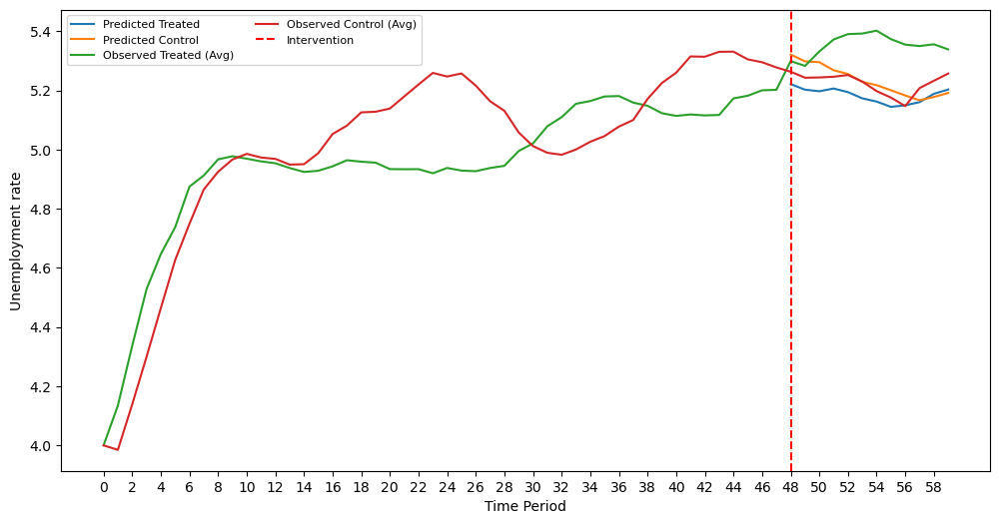

Treated Group - Mean: 3.2839098581907966 Median: 3.4505674465039515
Control Group - Mean: 0.689920642289417 Median: 0.7445454307342201
Shapiro-Wilk test p-value for Treated Group: 0.36876440048217773
Shapiro-Wilk test p-value for Control Group: 0.3891333341598511
T-Test p-value: 4.45901346526733e-05
 
sim_500_60_nl_he
500
True Average Treatement Effect on the Treated Unit for q > 90%: :  2.1767980454062545
Average Treatment Effect on the Treated Unit for q > 90%:  3.3095736255311983
mean_SMAPE for TTE :0.4025441801922618


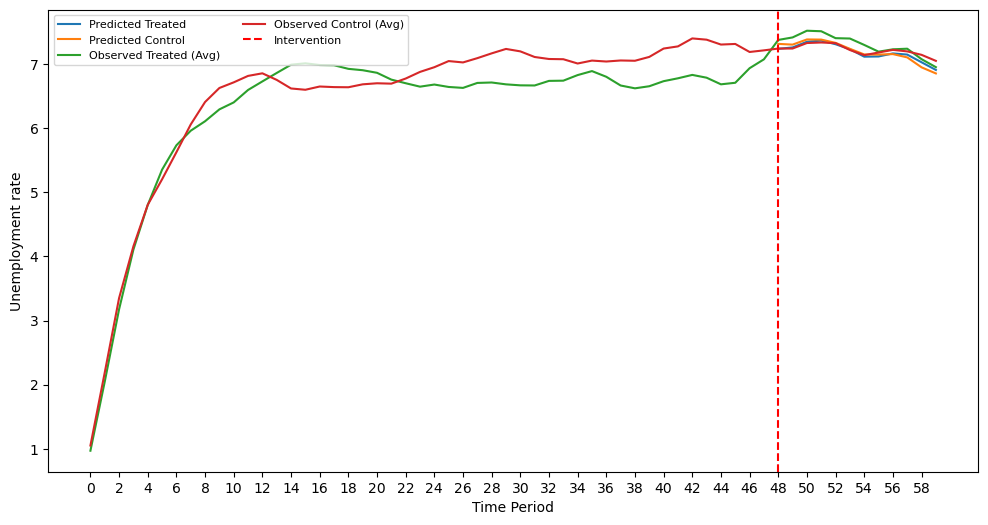

Treated Group - Mean: 1.5928224966091618 Median: 1.6060726985407907
Control Group - Mean: 1.0019038493151624 Median: 0.7955933904116701
Shapiro-Wilk test p-value for Treated Group: 0.2451866716146469
Shapiro-Wilk test p-value for Control Group: 0.013131042011082172
Wilcoxon test p-value: 0.26611328125
 
sim_500_222_l_he
500
True Average Treatement Effect on the Treated Unit for q > 90%: :  2.1153736510739116
Average Treatment Effect on the Treated Unit for q > 90%:  1.9703461066789785
mean_SMAPE for TTE :0.11437645342600485


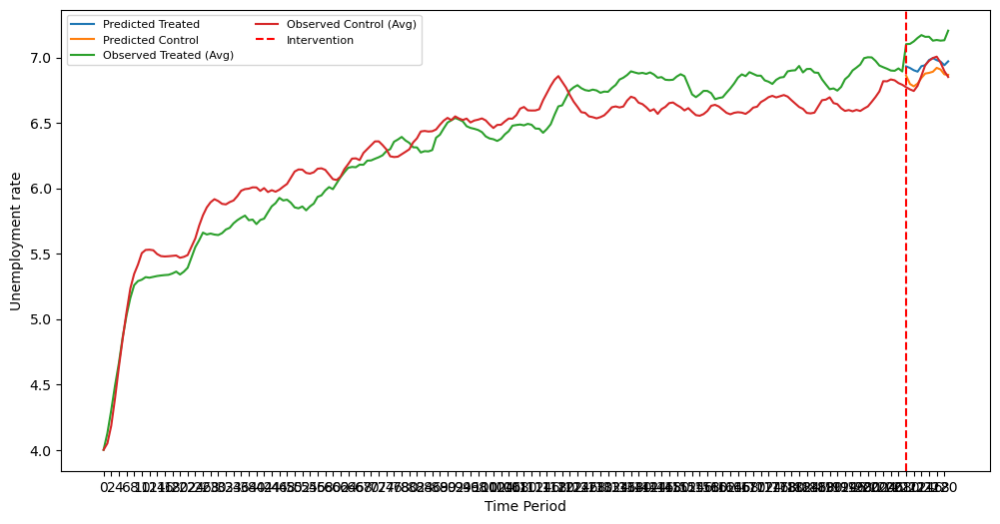

Treated Group - Mean: 2.8075740875856945 Median: 2.704787305245845
Control Group - Mean: 0.7760073465445929 Median: 0.6866260143473897
Shapiro-Wilk test p-value for Treated Group: 0.9091391563415527
Shapiro-Wilk test p-value for Control Group: 0.1319231241941452
T-Test p-value: 1.9448264714689595e-05
 
sim_500_222_nl_he
500
True Average Treatement Effect on the Treated Unit for q > 90%: :  2.7214775465194383
Average Treatment Effect on the Treated Unit for q > 90%:  2.2690975619864893
mean_SMAPE for TTE :0.19026715186347587


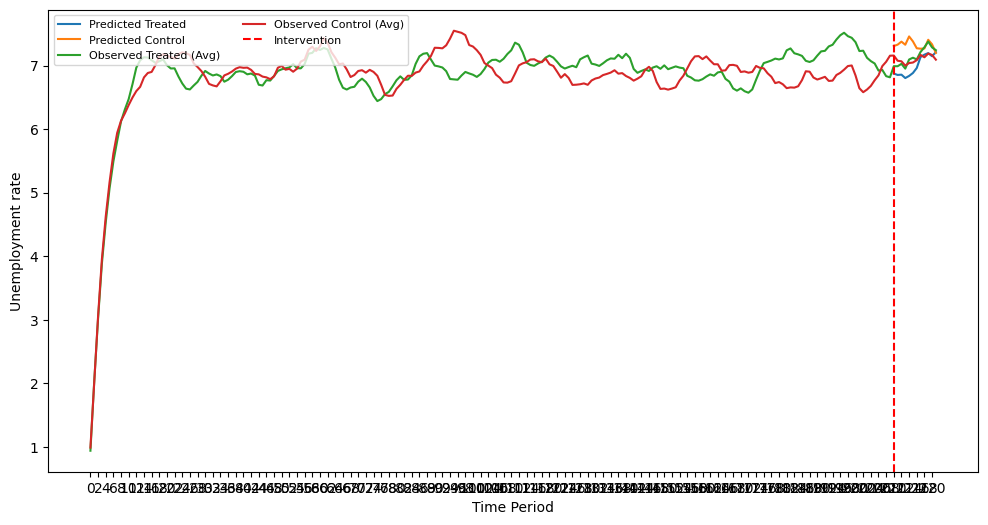

Treated Group - Mean: 2.0986089337353557 Median: 1.9744527265652185
Control Group - Mean: 3.0666879100796813 Median: 2.7496393962842296
Shapiro-Wilk test p-value for Treated Group: 0.7557204365730286
Shapiro-Wilk test p-value for Control Group: 0.45604953169822693
T-Test p-value: 0.0006052057106645982
 


In [23]:
dataset_name_test = ['calls911_benchmarks',\
                     'sim_10_60_l_ho','sim_10_60_nl_ho',\
                     'sim_10_222_l_ho','sim_10_222_nl_ho',\
                     'sim_101_60_l_ho', 'sim_101_60_nl_ho',\
                     'sim_101_222_l_ho', 'sim_101_222_nl_ho',\
                     'sim_500_60_l_ho', 'sim_500_60_nl_ho',\
                     'sim_500_222_l_ho', 'sim_500_222_nl_ho',\
                     'sim_10_60_l_he', 'sim_10_60_nl_he',\
                     'sim_10_222_l_he', 'sim_10_222_nl_he',\
                     'sim_101_60_l_he', 'sim_101_60_nl_he',\
                     'sim_101_222_l_he', 'sim_101_222_nl_he',\
                     'sim_500_60_l_he', 'sim_500_60_nl_he',\
                     'sim_500_222_l_he', 'sim_500_222_nl_he']
data_type = ['calls911'] + ['sim']*24
forecast_horizon = [7] + [12]*24 
model = 'causalimpact'
# plot_or_not = [True] + [False]*24 

for i in range(len(dataset_name_test)):
    print(dataset_name_test[i])
    table2(dataset_name_test[i], data_type[i], model, forecast_horizon[i], plot_or_not=True)
    print(" ")

calls911_benchmarks
(7, 62)
Average Treatment Effect for q > 10%:  -54.2892279125395
Average Treatment Effect for q > 50%:  -79.69118162878391
Average Treatment Effect for q > 90%:  -171.03495142930217


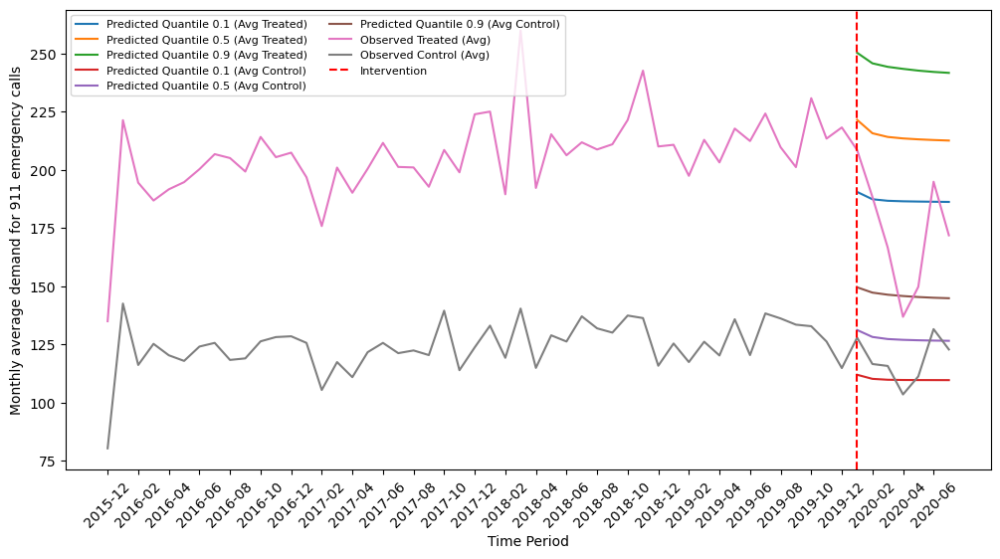

Treated Group - Mean: 19.13933853096878 Median: 19.158826840045997
Control Group - Mean: 8.32022306612296 Median: 9.07464424816061
Shapiro-Wilk test p-value for Treated Group: 0.7855235934257507
Shapiro-Wilk test p-value for Control Group: 0.34583091735839844
T-Test p-value: 0.005270702094324551
 
sim_10_60_l_ho
(12, 10)
10
True Average Treatement Effect on the Treated Unit for q > 90%: :  1.3650308462837772
Average Treatment Effect on the Treated Unit for q > 90%:  0.30185102495075383
mean_SMAPE for TTE :1.0187918753411433


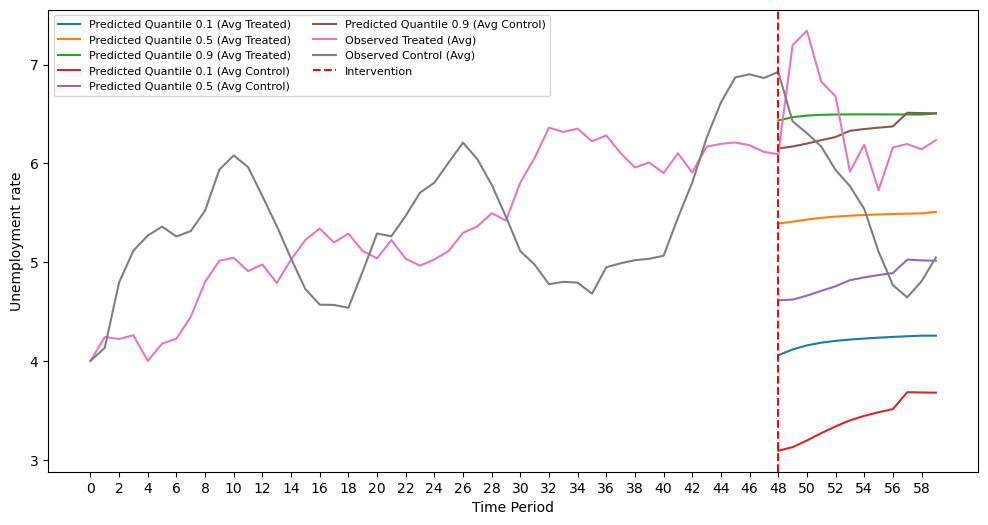

Treated Group - Mean: 17.040839876842945 Median: 13.003187774048946
Control Group - Mean: 19.515848599619726 Median: 17.034932331423278
Shapiro-Wilk test p-value for Treated Group: 0.05510040372610092
Shapiro-Wilk test p-value for Control Group: 0.2797148823738098
T-Test p-value: 0.5223771715122613
 
sim_10_60_nl_ho
(12, 10)
10
True Average Treatement Effect on the Treated Unit for q > 90%: :  2.492755423923825
Average Treatment Effect on the Treated Unit for q > 90%:  2.900088419681182
mean_SMAPE for TTE :0.8139229557433348


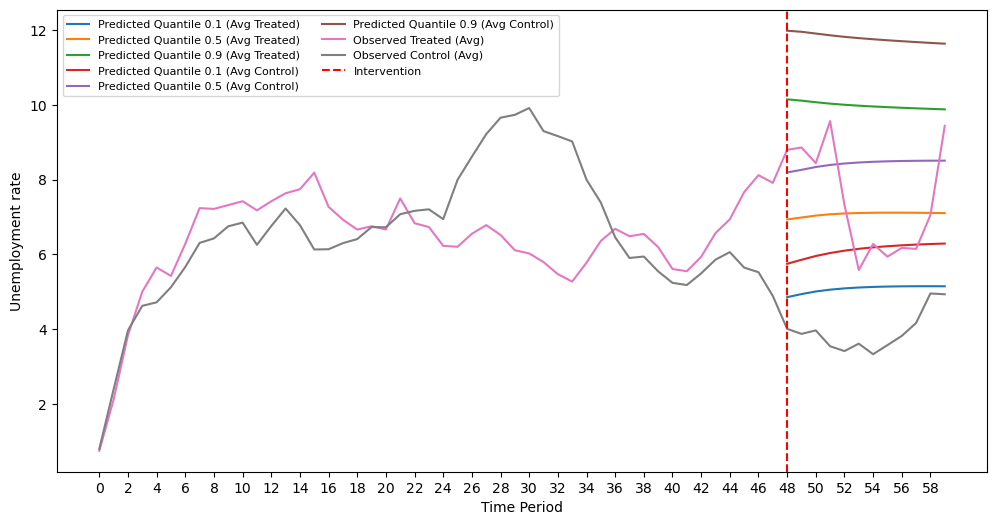

Treated Group - Mean: 18.539376910001067 Median: 18.251829119156433
Control Group - Mean: 53.34447017792996 Median: 54.1217922032335
Shapiro-Wilk test p-value for Treated Group: 0.8777707815170288
Shapiro-Wilk test p-value for Control Group: 0.09675095975399017
T-Test p-value: 1.3262129672721606e-06
 
sim_10_222_l_ho
(12, 10)
10
True Average Treatement Effect on the Treated Unit for q > 90%: :  2.5418054451841
Average Treatment Effect on the Treated Unit for q > 90%:  7.01490272222371
mean_SMAPE for TTE :0.9277244595952796


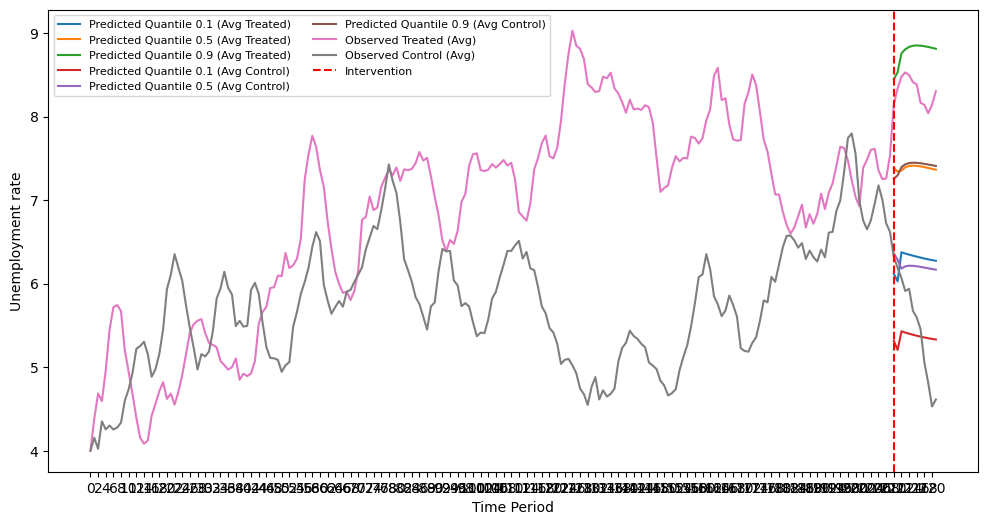

Treated Group - Mean: 12.361026908300717 Median: 12.96753974403798
Control Group - Mean: 11.354258492304874 Median: 9.274967974720422
Shapiro-Wilk test p-value for Treated Group: 0.18519429862499237
Shapiro-Wilk test p-value for Control Group: 0.12758253514766693
T-Test p-value: 0.7567125179338817
 
sim_10_222_nl_ho
(12, 10)
10
True Average Treatement Effect on the Treated Unit for q > 90%: :  2.9018507485705833
Average Treatment Effect on the Treated Unit for q > 90%:  1.2739734852099958
mean_SMAPE for TTE :0.8046094697663119


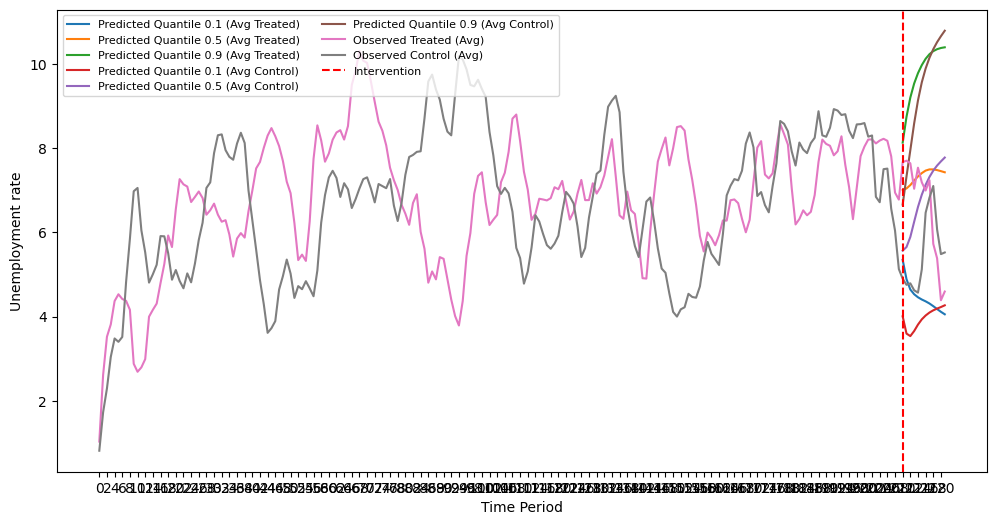

Treated Group - Mean: 14.606229407344882 Median: 8.31115275068692
Control Group - Mean: 18.96802239121251 Median: 19.349124653080164
Shapiro-Wilk test p-value for Treated Group: 0.00872861035168171
Shapiro-Wilk test p-value for Control Group: 0.3116321265697479
Wilcoxon test p-value: 0.423828125
 
sim_101_60_l_ho
(12, 101)
101
True Average Treatement Effect on the Treated Unit for q > 90%: :  2.080015196911815
Average Treatment Effect on the Treated Unit for q > 90%:  2.5494731431741613
mean_SMAPE for TTE :0.19718350101740437


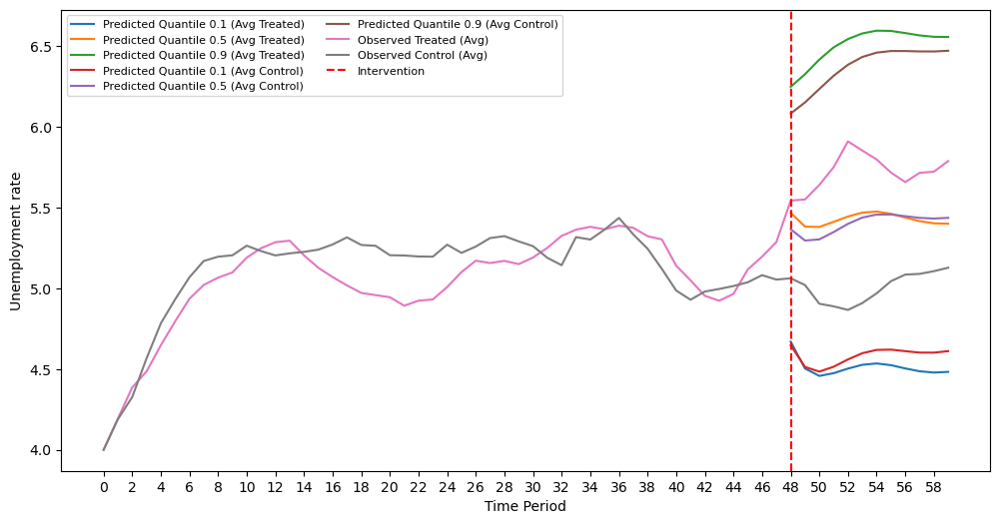

Treated Group - Mean: 5.367689998989252 Median: 5.708756978246521
Control Group - Mean: 7.318708244527445 Median: 7.0795295209928355
Shapiro-Wilk test p-value for Treated Group: 0.9805606007575989
Shapiro-Wilk test p-value for Control Group: 0.2735786437988281
T-Test p-value: 0.0010951909584579374
 
sim_101_60_nl_ho
(12, 101)
101
True Average Treatement Effect on the Treated Unit for q > 90%: :  3.0385411072075974
Average Treatment Effect on the Treated Unit for q > 90%:  2.5801937672796393
mean_SMAPE for TTE :0.398388550692166


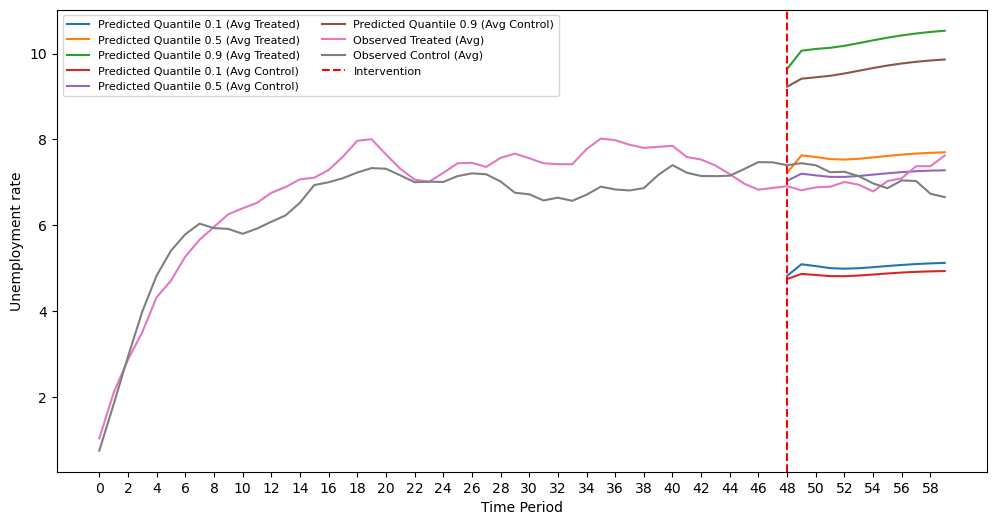

Treated Group - Mean: 6.833375131816133 Median: 7.445907181901312
Control Group - Mean: 3.715253360876454 Median: 3.212607253048474
Shapiro-Wilk test p-value for Treated Group: 0.5046215653419495
Shapiro-Wilk test p-value for Control Group: 0.4766325354576111
T-Test p-value: 0.051519485131686214
 
sim_101_222_l_ho
(12, 101)
101
True Average Treatement Effect on the Treated Unit for q > 90%: :  2.592828716096483
Average Treatment Effect on the Treated Unit for q > 90%:  3.109469853495513
mean_SMAPE for TTE :0.1774995498281338


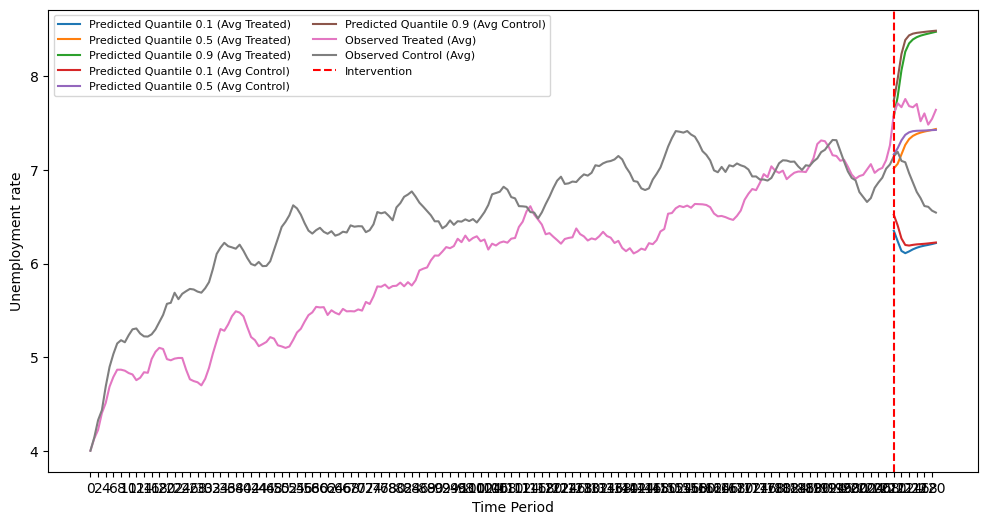

Treated Group - Mean: 4.502904573300212 Median: 4.244802561526669
Control Group - Mean: 7.083879372585172 Median: 8.116079996677483
Shapiro-Wilk test p-value for Treated Group: 0.45757943391799927
Shapiro-Wilk test p-value for Control Group: 0.14550282061100006
T-Test p-value: 0.22585714821454544
 
sim_101_222_nl_ho
(12, 101)
101
True Average Treatement Effect on the Treated Unit for q > 90%: :  2.8790365504901403
Average Treatment Effect on the Treated Unit for q > 90%:  4.915789788721386
mean_SMAPE for TTE :0.5157309054523099


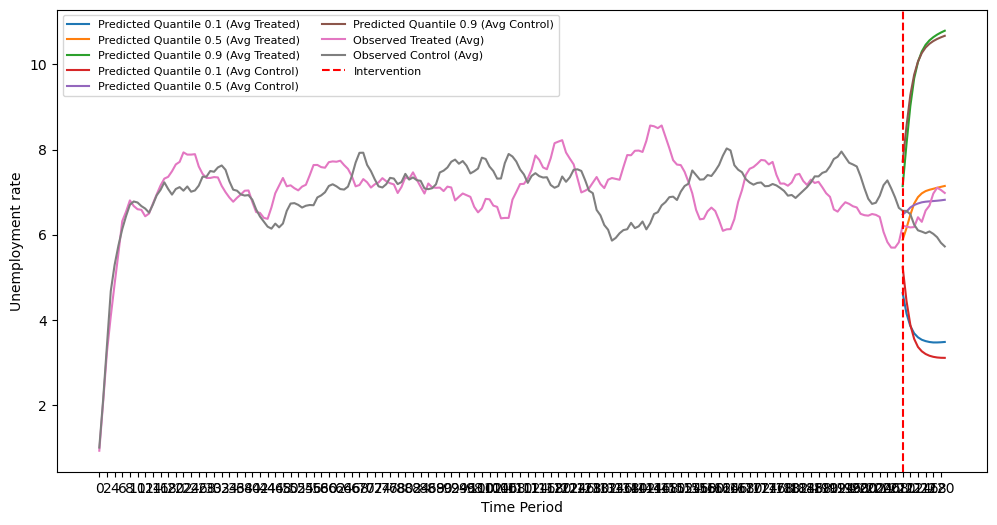

Treated Group - Mean: 4.347601125468271 Median: 4.90894816911999
Control Group - Mean: 8.868041984724734 Median: 10.304110898041838
Shapiro-Wilk test p-value for Treated Group: 0.5316693782806396
Shapiro-Wilk test p-value for Control Group: 0.27146443724632263
T-Test p-value: 0.03413266669976105
 
sim_500_60_l_ho
(12, 500)
500
True Average Treatement Effect on the Treated Unit for q > 90%: :  2.255246493880215
Average Treatment Effect on the Treated Unit for q > 90%:  2.4554207063501963
mean_SMAPE for TTE :0.1455537299180982


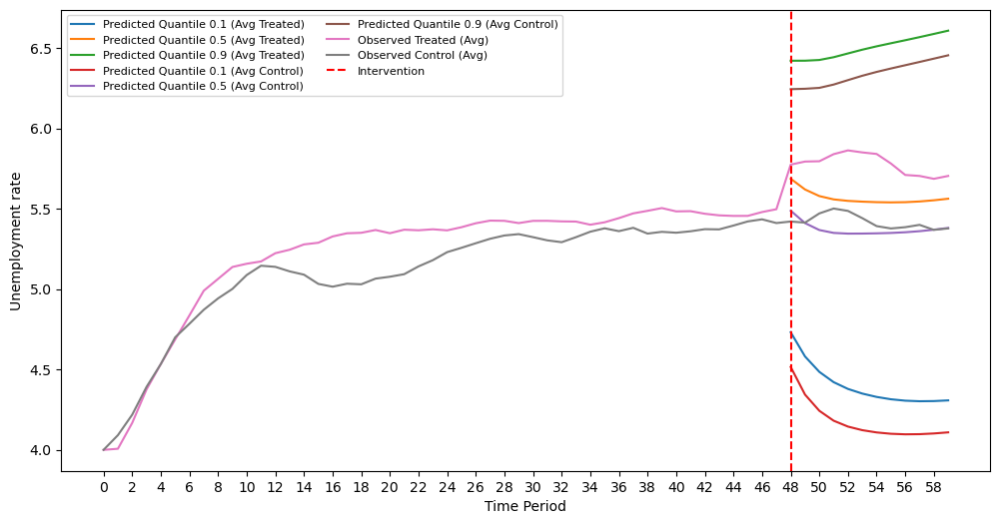

Treated Group - Mean: 3.7846195984262927 Median: 3.486340912684166
Control Group - Mean: 1.1028231924762164 Median: 0.7877216342325278
Shapiro-Wilk test p-value for Treated Group: 0.3234367072582245
Shapiro-Wilk test p-value for Control Group: 0.15769600868225098
T-Test p-value: 3.4904345119605637e-06
 
sim_500_60_nl_ho
(12, 500)
500
True Average Treatement Effect on the Treated Unit for q > 90%: :  3.1625222107604984
Average Treatment Effect on the Treated Unit for q > 90%:  2.859152177034286
mean_SMAPE for TTE :0.22310942051443125


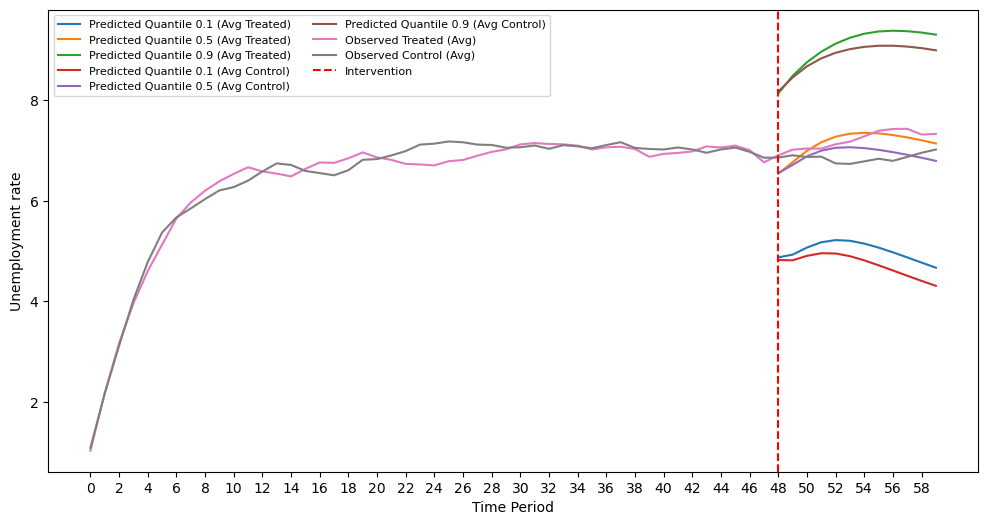

Treated Group - Mean: 2.152399538738615 Median: 1.916386630588433
Control Group - Mean: 2.7230539398857 Median: 2.6934334028321416
Shapiro-Wilk test p-value for Treated Group: 0.06388743221759796
Shapiro-Wilk test p-value for Control Group: 0.6074681878089905
T-Test p-value: 0.21510748677533523
 
sim_500_222_l_ho
(12, 500)
500
True Average Treatement Effect on the Treated Unit for q > 90%: :  2.5674855168681625
Average Treatment Effect on the Treated Unit for q > 90%:  3.154633259921694
mean_SMAPE for TTE :0.19992935182754365


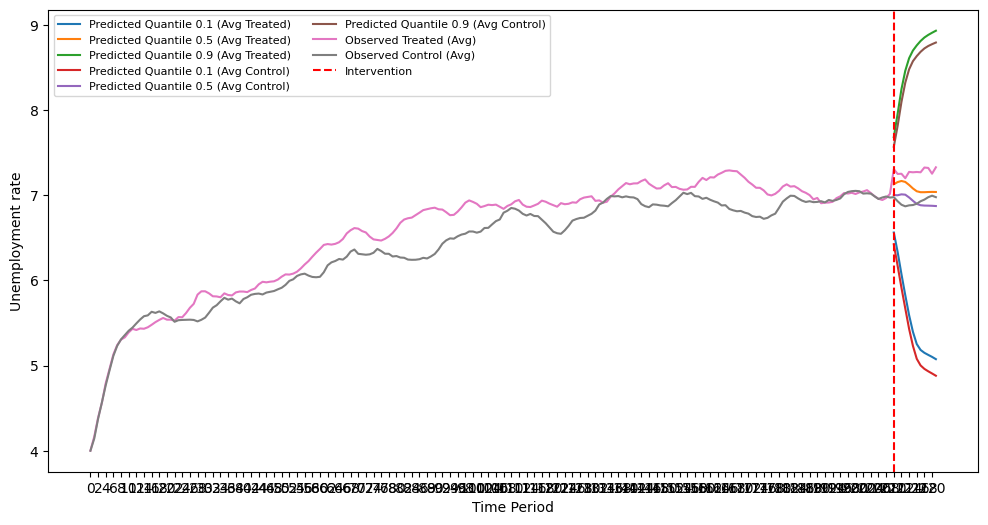

Treated Group - Mean: 2.689889478277904 Median: 2.859618018718799
Control Group - Mean: 1.124183949462867 Median: 1.173643352574008
Shapiro-Wilk test p-value for Treated Group: 0.4055247902870178
Shapiro-Wilk test p-value for Control Group: 0.767443060874939
T-Test p-value: 0.003574244958831071
 
sim_500_222_nl_ho
(12, 500)
500
True Average Treatement Effect on the Treated Unit for q > 90%: :  3.052281293202109
Average Treatment Effect on the Treated Unit for q > 90%:  5.839103353580609
mean_SMAPE for TTE :0.5913982247253048


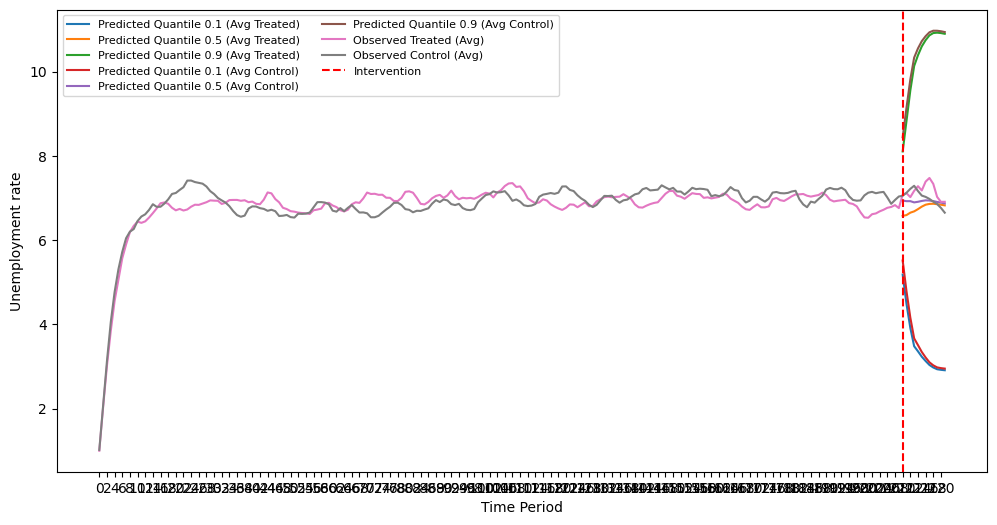

Treated Group - Mean: 5.897761265311786 Median: 7.077571608878787
Control Group - Mean: 2.3068145738245653 Median: 1.8277431331290825
Shapiro-Wilk test p-value for Treated Group: 0.02839161828160286
Shapiro-Wilk test p-value for Control Group: 0.5416334271430969
Wilcoxon test p-value: 0.0068359375
 
sim_10_60_l_he
(12, 10)
10
True Average Treatement Effect on the Treated Unit for q > 90%: :  0.7508459062654844
Average Treatment Effect on the Treated Unit for q > 90%:  2.786720159216743
mean_SMAPE for TTE :1.0909029411024813


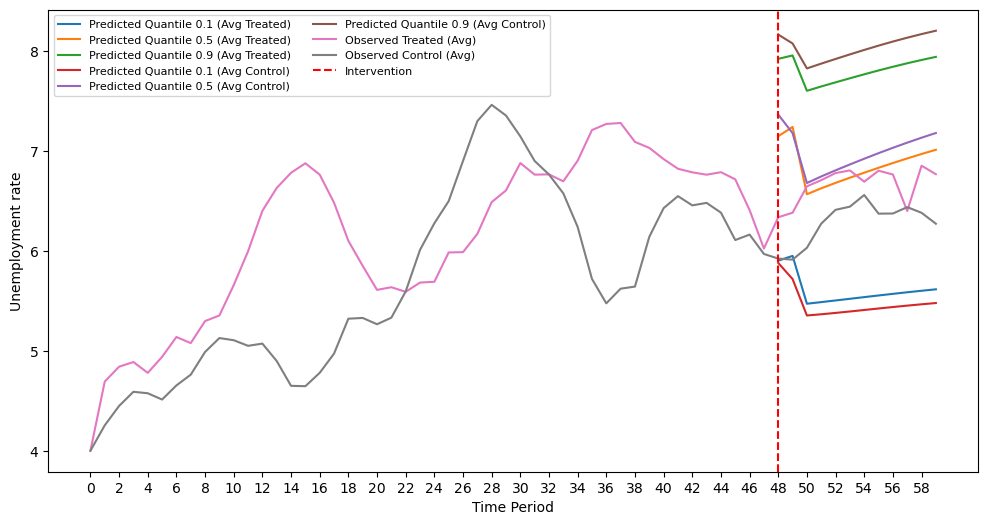

Treated Group - Mean: 3.699386549677868 Median: 1.5711230671097387
Control Group - Mean: 10.124088966739842 Median: 9.235308178874504
Shapiro-Wilk test p-value for Treated Group: 0.0010141059756278992
Shapiro-Wilk test p-value for Control Group: 0.06574364751577377
Wilcoxon test p-value: 0.00048828125
 
sim_10_60_nl_he
(12, 10)
10
True Average Treatement Effect on the Treated Unit for q > 90%: :  2.986924125892758
Average Treatment Effect on the Treated Unit for q > 90%:  1.5576622208899098
mean_SMAPE for TTE :0.7772617281479012


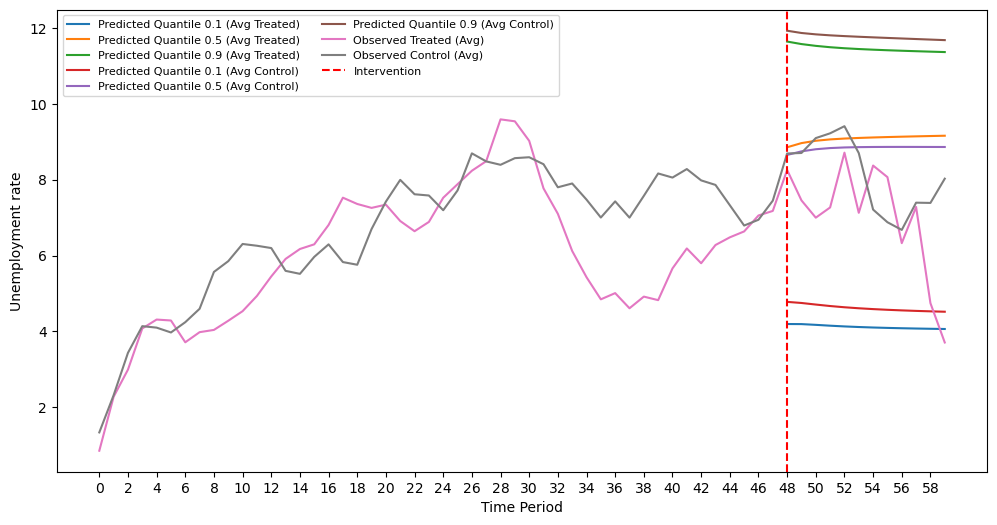

Treated Group - Mean: 22.51475295628398 Median: 20.082465031499314
Control Group - Mean: 10.432272787435997 Median: 7.8807902005867145
Shapiro-Wilk test p-value for Treated Group: 0.06967157870531082
Shapiro-Wilk test p-value for Control Group: 0.12939925491809845
T-Test p-value: 0.035149718483812584
 
sim_10_222_l_he
(12, 10)
10
True Average Treatement Effect on the Treated Unit for q > 90%: :  -0.15427761455658695
Average Treatment Effect on the Treated Unit for q > 90%:  -0.8115925700535112
mean_SMAPE for TTE :1.0875780389280176


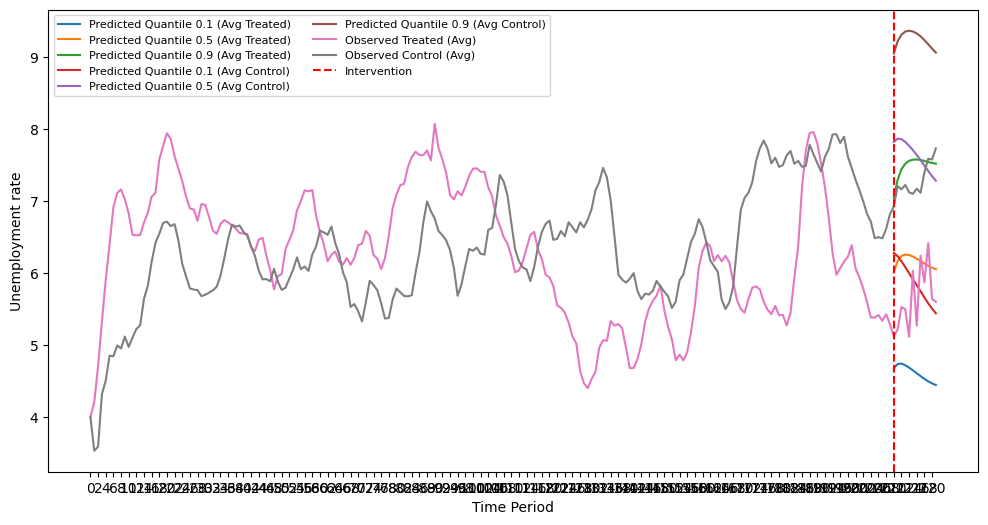

Treated Group - Mean: 9.61429493510777 Median: 9.443577698151895
Control Group - Mean: 6.469470052942197 Median: 6.9044824082486755
Shapiro-Wilk test p-value for Treated Group: 0.5132200717926025
Shapiro-Wilk test p-value for Control Group: 0.5382578372955322
T-Test p-value: 0.03375158096012057
 
sim_10_222_nl_he
(12, 10)
10
True Average Treatement Effect on the Treated Unit for q > 90%: :  1.6994226634140002
Average Treatment Effect on the Treated Unit for q > 90%:  5.469329642774888
mean_SMAPE for TTE :1.2675455282691603


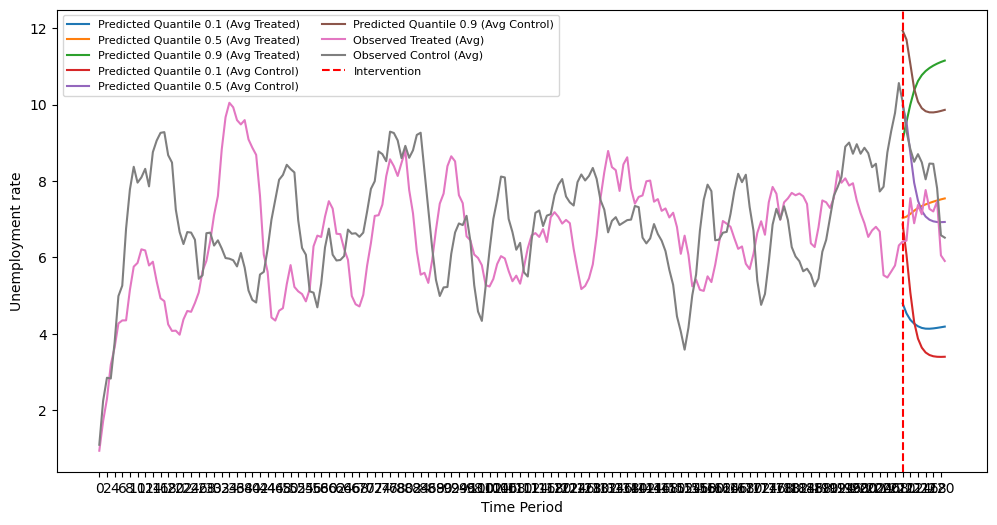

Treated Group - Mean: 7.01887150153122 Median: 4.822586725391996
Control Group - Mean: 10.45781522035008 Median: 9.82820015367303
Shapiro-Wilk test p-value for Treated Group: 0.012161502614617348
Shapiro-Wilk test p-value for Control Group: 0.22867436707019806
Wilcoxon test p-value: 0.33935546875
 
sim_101_60_l_he
(12, 101)
101
True Average Treatement Effect on the Treated Unit for q > 90%: :  3.0706363348683783
Average Treatment Effect on the Treated Unit for q > 90%:  3.698402292790495
mean_SMAPE for TTE :0.17805526767898253


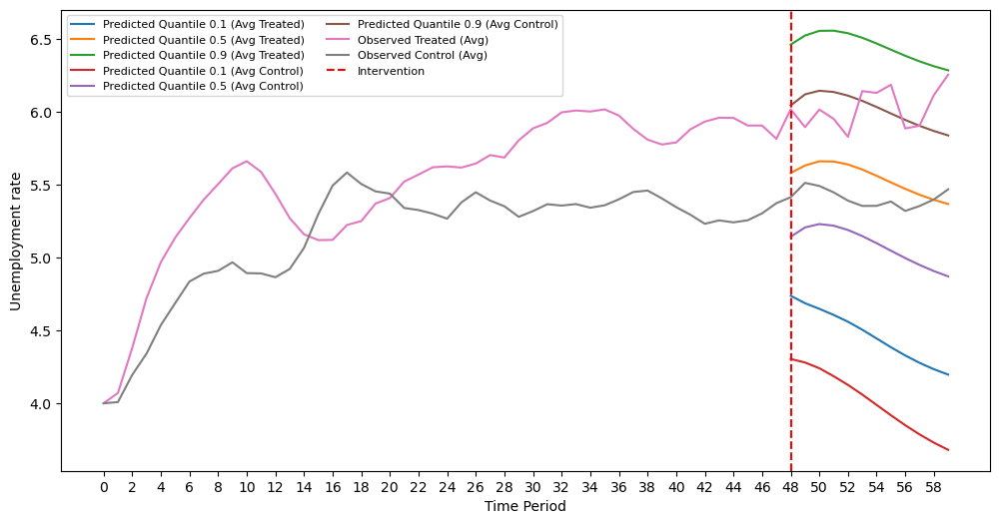

Treated Group - Mean: 8.789833638256587 Median: 8.277252531214312
Control Group - Mean: 6.423008194131509 Median: 5.574347424719745
Shapiro-Wilk test p-value for Treated Group: 0.9120497107505798
Shapiro-Wilk test p-value for Control Group: 0.05339233949780464
T-Test p-value: 0.005414240213505617
 
sim_101_60_nl_he
(12, 101)
101
True Average Treatement Effect on the Treated Unit for q > 90%: :  3.0640631051167166
Average Treatment Effect on the Treated Unit for q > 90%:  3.0485430341371007
mean_SMAPE for TTE :0.14224176136315744


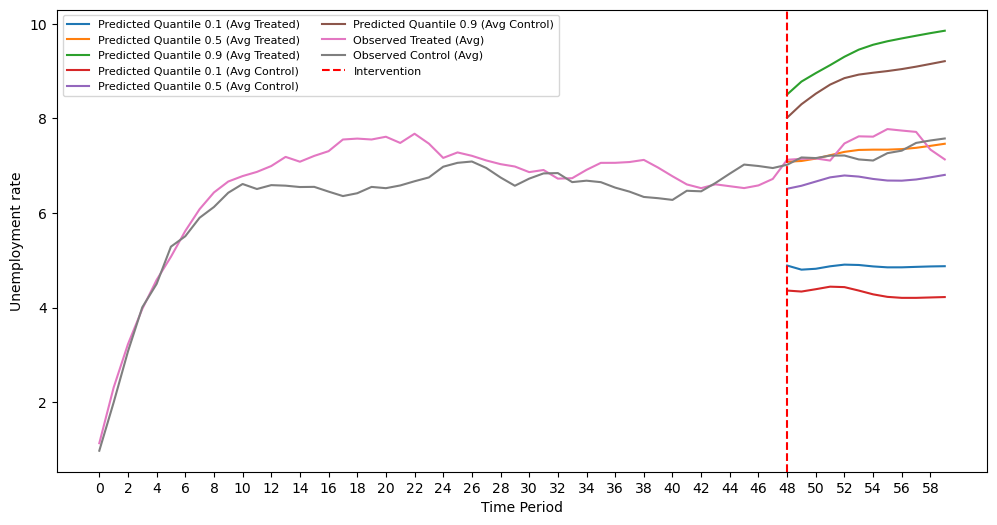

Treated Group - Mean: 2.8543002219816436 Median: 3.0914153975841865
Control Group - Mean: 8.418698573693932 Median: 8.222682578406902
Shapiro-Wilk test p-value for Treated Group: 0.3164820075035095
Shapiro-Wilk test p-value for Control Group: 0.31164100766181946
T-Test p-value: 2.454124432809989e-05
 
sim_101_222_l_he
(12, 101)
101
True Average Treatement Effect on the Treated Unit for q > 90%: :  2.353568361350783
Average Treatment Effect on the Treated Unit for q > 90%:  3.658529736223585
mean_SMAPE for TTE :0.42338195349973545


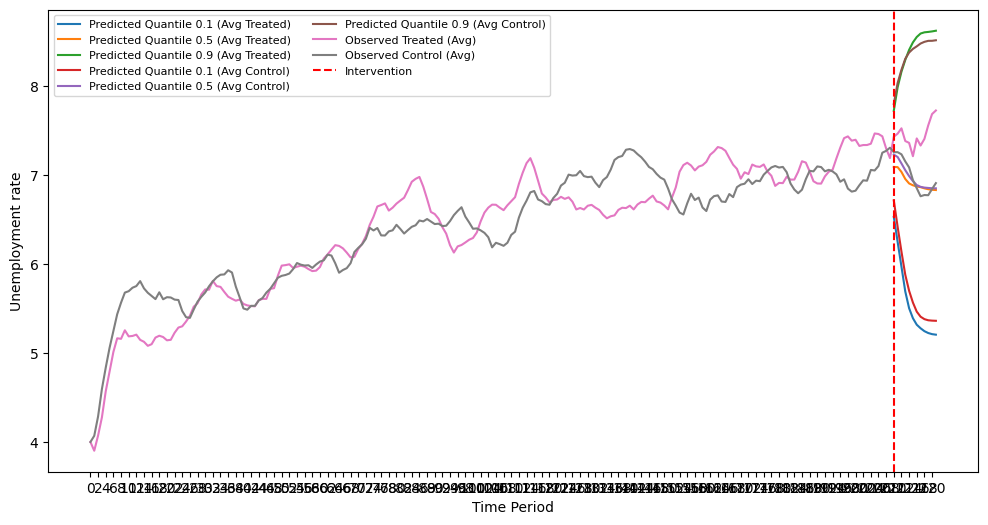

Treated Group - Mean: 7.782876548959462 Median: 6.897764388282272
Control Group - Mean: 0.9130304645235712 Median: 1.0239470878791632
Shapiro-Wilk test p-value for Treated Group: 0.08466925472021103
Shapiro-Wilk test p-value for Control Group: 0.1374264806509018
T-Test p-value: 5.245659406519761e-06
 
sim_101_222_nl_he
(12, 101)
101
True Average Treatement Effect on the Treated Unit for q > 90%: :  3.9865590709073255
Average Treatment Effect on the Treated Unit for q > 90%:  6.063278728760527
mean_SMAPE for TTE :0.394262653860659


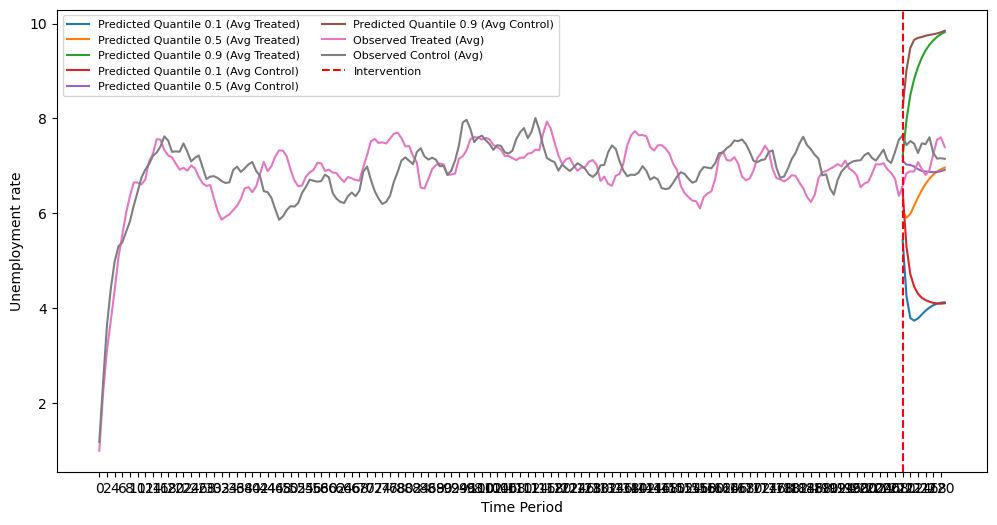

Treated Group - Mean: 9.004468845658705 Median: 9.41638893351043
Control Group - Mean: 6.437742764693184 Median: 6.392549754019546
Shapiro-Wilk test p-value for Treated Group: 0.7045038342475891
Shapiro-Wilk test p-value for Control Group: 0.8474960923194885
T-Test p-value: 0.13131091487751576
 
sim_500_60_l_he
(12, 500)
500
True Average Treatement Effect on the Treated Unit for q > 90%: :  1.573119762057276
Average Treatment Effect on the Treated Unit for q > 90%:  2.150551897263652
mean_SMAPE for TTE :0.3143991074980297


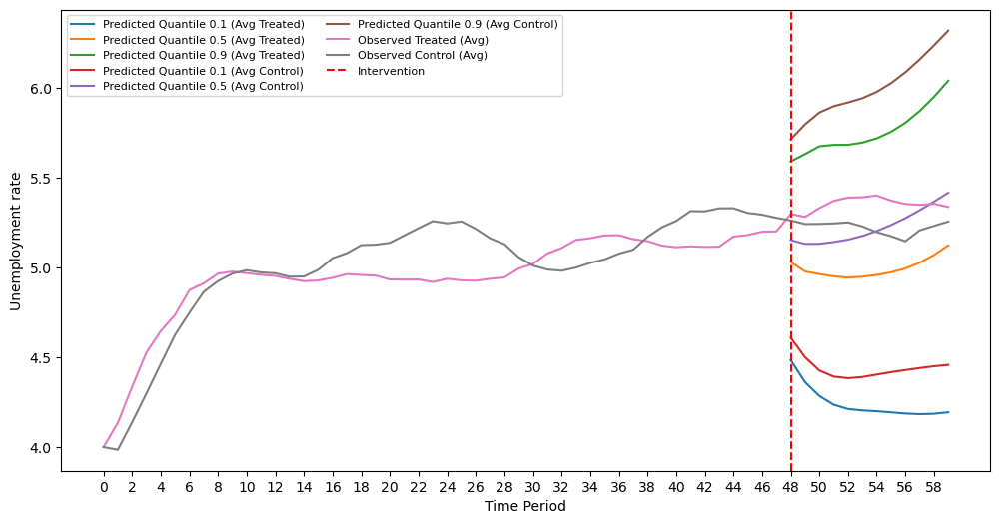

Treated Group - Mean: 7.143126717599144 Median: 7.303479840998779
Control Group - Mean: 1.8886347488287791 Median: 2.11358776173098
Shapiro-Wilk test p-value for Treated Group: 0.38607361912727356
Shapiro-Wilk test p-value for Control Group: 0.13261741399765015
T-Test p-value: 5.748083171582619e-06
 
sim_500_60_nl_he
(12, 500)
500
True Average Treatement Effect on the Treated Unit for q > 90%: :  2.1767980454062545
Average Treatment Effect on the Treated Unit for q > 90%:  2.3451490880819374
mean_SMAPE for TTE :0.17522118903150996


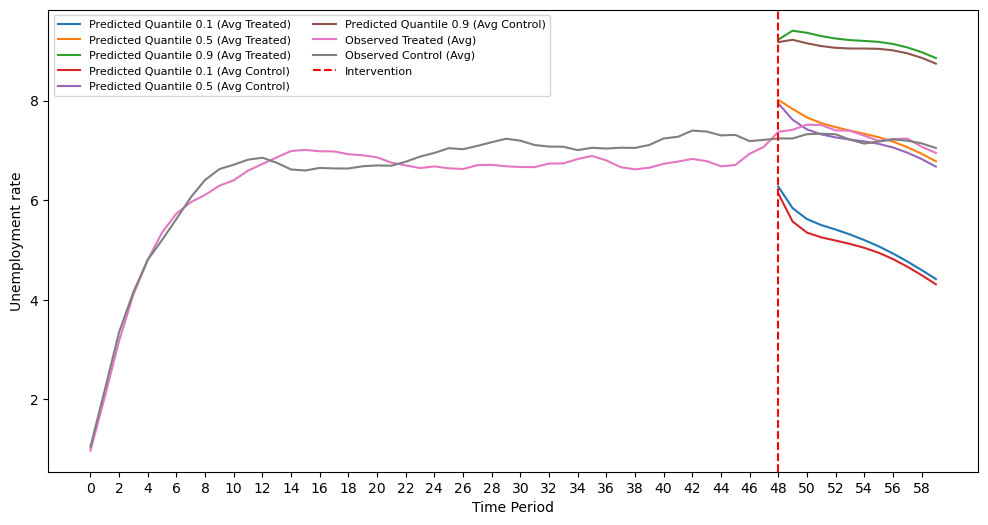

Treated Group - Mean: 2.155587668692382 Median: 1.4592949695004571
Control Group - Mean: 2.7739933892743616 Median: 1.7804749020062438
Shapiro-Wilk test p-value for Treated Group: 0.006695479620248079
Shapiro-Wilk test p-value for Control Group: 0.08896663784980774
Wilcoxon test p-value: 0.30126953125
 
sim_500_222_l_he
(12, 500)
500
True Average Treatement Effect on the Treated Unit for q > 90%: :  2.1153736510739116
Average Treatment Effect on the Treated Unit for q > 90%:  3.2582908340831165
mean_SMAPE for TTE :0.4206729220688448


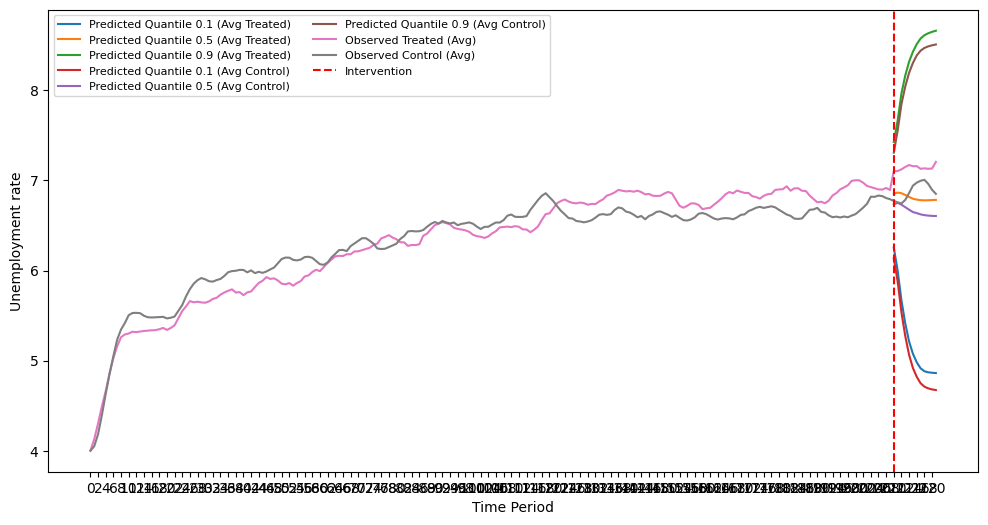

Treated Group - Mean: 4.868815490564168 Median: 5.155045096566905
Control Group - Mean: 3.276801292960451 Median: 4.054660169826089
Shapiro-Wilk test p-value for Treated Group: 0.10922126471996307
Shapiro-Wilk test p-value for Control Group: 0.08474964648485184
T-Test p-value: 0.0063544873129081966
 
sim_500_222_nl_he
(12, 500)
500
True Average Treatement Effect on the Treated Unit for q > 90%: :  2.7214775465194383
Average Treatment Effect on the Treated Unit for q > 90%:  5.418445067716246
mean_SMAPE for TTE :0.6132079819704186


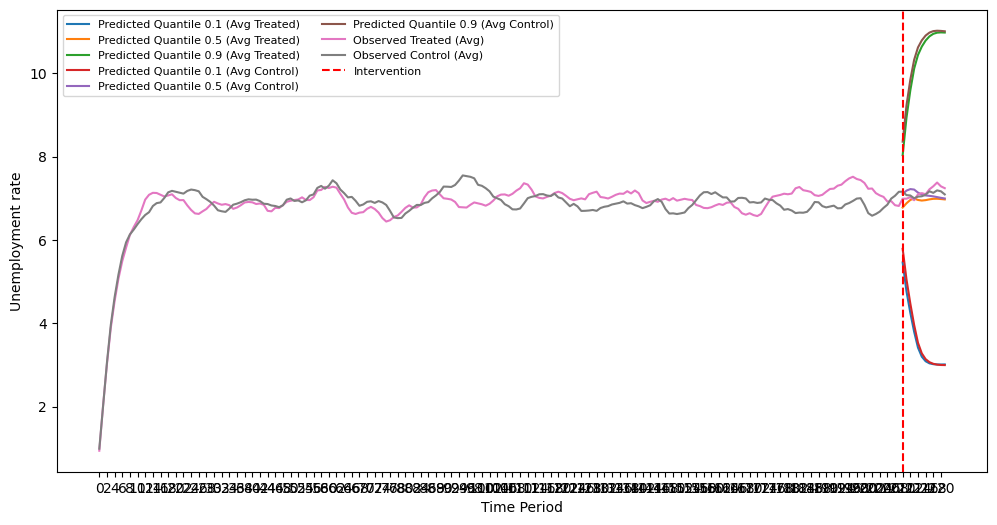

Treated Group - Mean: 2.872527779141095 Median: 2.8594620216812245
Control Group - Mean: 1.513090633207091 Median: 1.449781749890236
Shapiro-Wilk test p-value for Treated Group: 0.9501689672470093
Shapiro-Wilk test p-value for Control Group: 0.9489789009094238
T-Test p-value: 0.018900521762495376
 


In [25]:
dataset_name_test = ['calls911_benchmarks',\
                     'sim_10_60_l_ho','sim_10_60_nl_ho',\
                     'sim_10_222_l_ho','sim_10_222_nl_ho',\
                     'sim_101_60_l_ho', 'sim_101_60_nl_ho',\
                     'sim_101_222_l_ho', 'sim_101_222_nl_ho',\
                     'sim_500_60_l_ho', 'sim_500_60_nl_ho',\
                     'sim_500_222_l_ho', 'sim_500_222_nl_ho',\
                     'sim_10_60_l_he', 'sim_10_60_nl_he',\
                     'sim_10_222_l_he', 'sim_10_222_nl_he',\
                     'sim_101_60_l_he', 'sim_101_60_nl_he',\
                     'sim_101_222_l_he', 'sim_101_222_nl_he',\
                     'sim_500_60_l_he', 'sim_500_60_nl_he',\
                     'sim_500_222_l_he', 'sim_500_222_nl_he']
data_type = ['calls911'] + ['sim']*24
forecast_horizon = [7] + [12]*24 
model = 'tft'
# plot_or_not = [True] + [False]*24 

for i in range(len(dataset_name_test)):
    print(dataset_name_test[i])
    table2(dataset_name_test[i], data_type[i], model, forecast_horizon[i], plot_or_not=True)
    print(" ")

calls911_benchmarks
Average Treatment Effect for q > 10%:  -56.31819422916669
Average Treatment Effect for q > 50%:  -96.87992804978978
Average Treatment Effect for q > 90%:  -137.212019957483


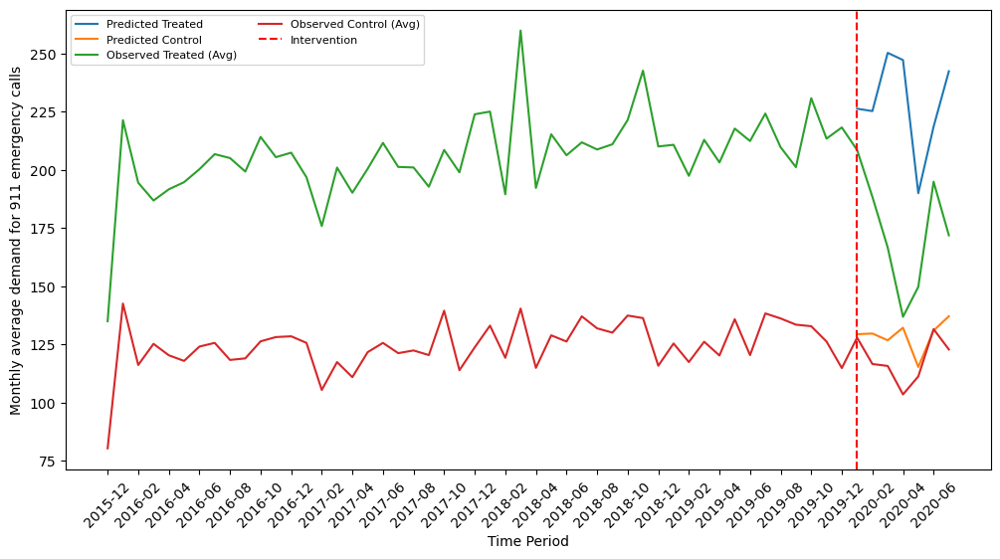

Treated Group - Mean: 23.344812555003028 Median: 21.192866110203436
Control Group - Mean: 8.010520624871043 Median: 8.70542430277326
Shapiro-Wilk test p-value for Treated Group: 0.8163500428199768
Shapiro-Wilk test p-value for Control Group: 0.2945683002471924
T-Test p-value: 0.0017334845967404023
 
sim_10_60_l_ho
10
True Average Treatement Effect on the Treated Unit for q > 90%: :  1.3650308462837772
Average Treatment Effect on the Treated Unit for q > 90%:  2.1109098192378632
mean_SMAPE for TTE :1.1595851368111059


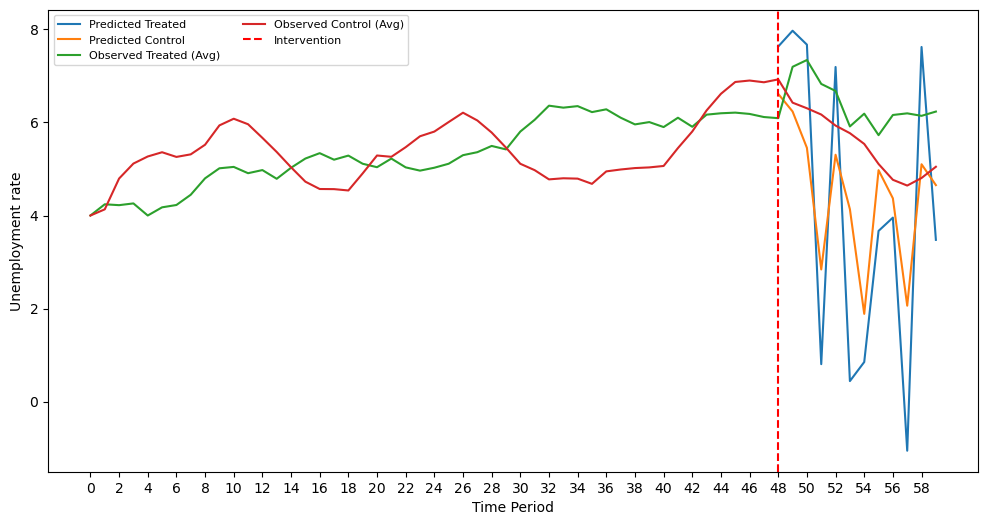

Treated Group - Mean: 182.1746434938128 Median: 37.98420128748117
Control Group - Mean: 44.7512214726133 Median: 10.467929003052994
Shapiro-Wilk test p-value for Treated Group: 0.020754870027303696
Shapiro-Wilk test p-value for Control Group: 0.0008477825904265046
Wilcoxon test p-value: 0.06396484375
 
sim_10_60_nl_ho
10
True Average Treatement Effect on the Treated Unit for q > 90%: :  2.492755423923825
Average Treatment Effect on the Treated Unit for q > 90%:  -4.930652137651175
mean_SMAPE for TTE :1.5970898915431118


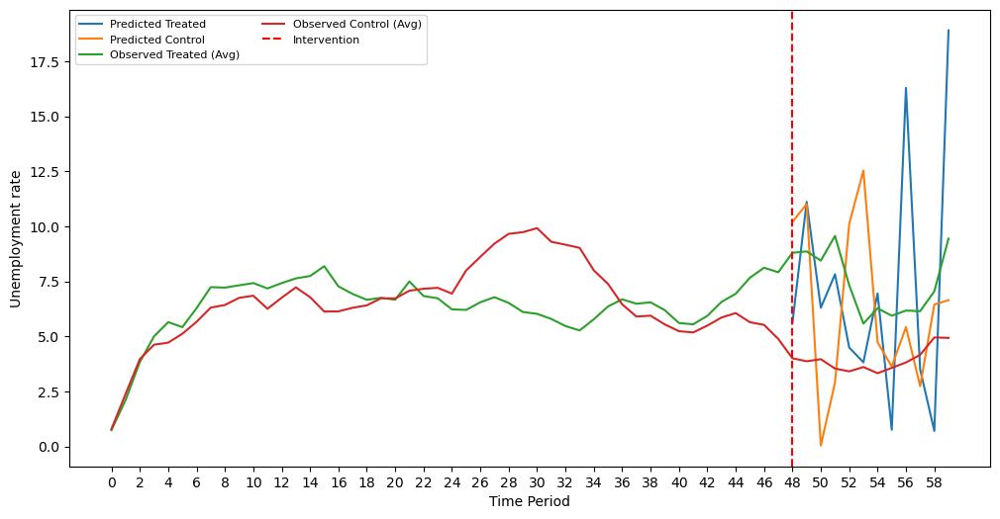

Treated Group - Mean: 168.68558808708624 Median: 53.379801637799716
Control Group - Mean: 843.4044602255026 Median: 40.82178349848552
Shapiro-Wilk test p-value for Treated Group: 4.277386324247345e-05
Shapiro-Wilk test p-value for Control Group: 1.3370308806770481e-06
Wilcoxon test p-value: 0.90966796875
 
sim_10_222_l_ho
10
True Average Treatement Effect on the Treated Unit for q > 90%: :  2.5418054451841
Average Treatment Effect on the Treated Unit for q > 90%:  2.353413854090167
mean_SMAPE for TTE :0.48940356773995375


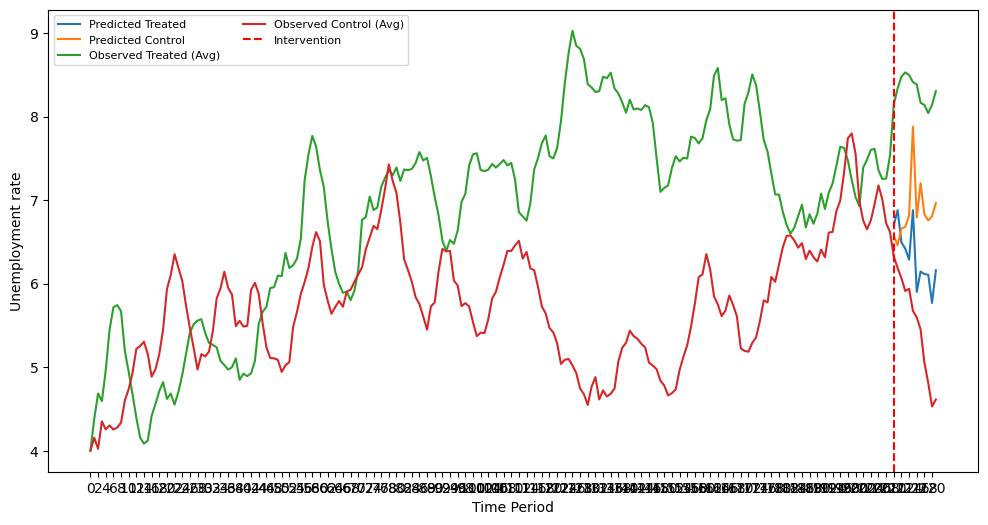

Treated Group - Mean: 31.615301562589323 Median: 32.8754531994676
Control Group - Mean: 19.430570643203033 Median: 20.943010748559367
Shapiro-Wilk test p-value for Treated Group: 0.1667642444372177
Shapiro-Wilk test p-value for Control Group: 0.24925526976585388
T-Test p-value: 0.001305320189875272
 
sim_10_222_nl_ho
10
True Average Treatement Effect on the Treated Unit for q > 90%: :  2.9018507485705833
Average Treatment Effect on the Treated Unit for q > 90%:  -2.5302705422710834
mean_SMAPE for TTE :1.8242055430411614


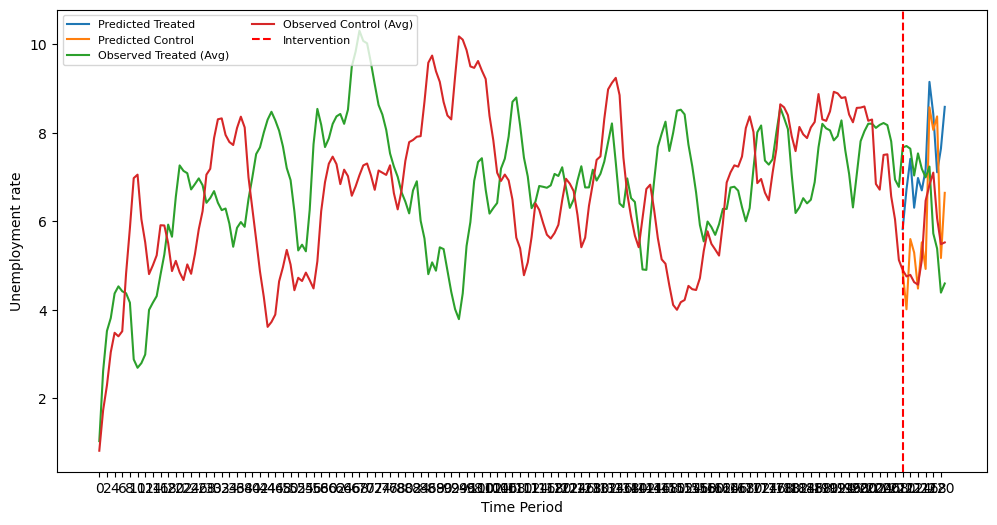

Treated Group - Mean: 20.413856359807824 Median: 17.760246102007066
Control Group - Mean: 14.138883046492987 Median: 13.542480046410299
Shapiro-Wilk test p-value for Treated Group: 0.32303598523139954
Shapiro-Wilk test p-value for Control Group: 0.8893268704414368
T-Test p-value: 0.28593601544460395
 
sim_101_60_l_ho
101
True Average Treatement Effect on the Treated Unit for q > 90%: :  2.080015196911815
Average Treatment Effect on the Treated Unit for q > 90%:  1.0507617698725669
mean_SMAPE for TTE :0.7612353961890542


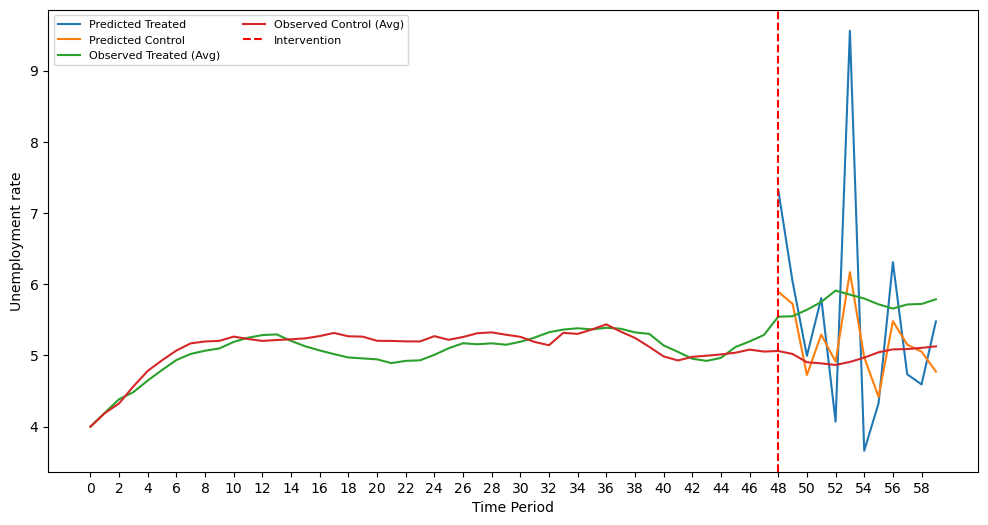

Treated Group - Mean: 23.491480963683014 Median: 22.49304941766895
Control Group - Mean: 7.530794135441076 Median: 7.314608624024796
Shapiro-Wilk test p-value for Treated Group: 0.6318474411964417
Shapiro-Wilk test p-value for Control Group: 0.22182859480381012
T-Test p-value: 0.01586615862901168
 
sim_101_60_nl_ho
101
True Average Treatement Effect on the Treated Unit for q > 90%: :  3.0385411072075974
Average Treatment Effect on the Treated Unit for q > 90%:  -7.6234315277307365
mean_SMAPE for TTE :1.9053225267261433


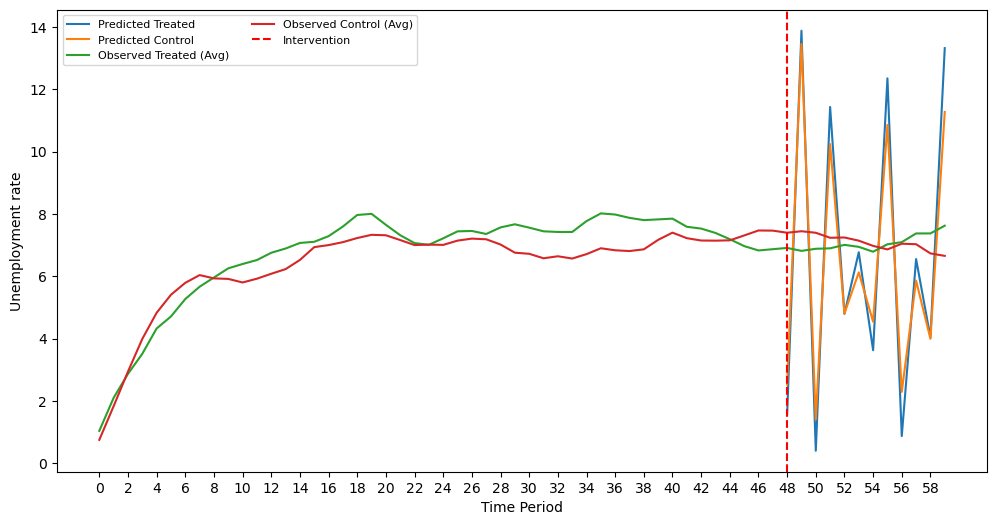

Treated Group - Mean: 258.13170092118526 Median: 48.57089905005222
Control Group - Mean: 99.2467834506546 Median: 47.72822515150234
Shapiro-Wilk test p-value for Treated Group: 7.340836600633338e-05
Shapiro-Wilk test p-value for Control Group: 0.000558357744012028
Wilcoxon test p-value: 0.06396484375
 
sim_101_222_l_ho
101
True Average Treatement Effect on the Treated Unit for q > 90%: :  2.592828716096483
Average Treatment Effect on the Treated Unit for q > 90%:  2.8851185822054326
mean_SMAPE for TTE :0.12516537235847508


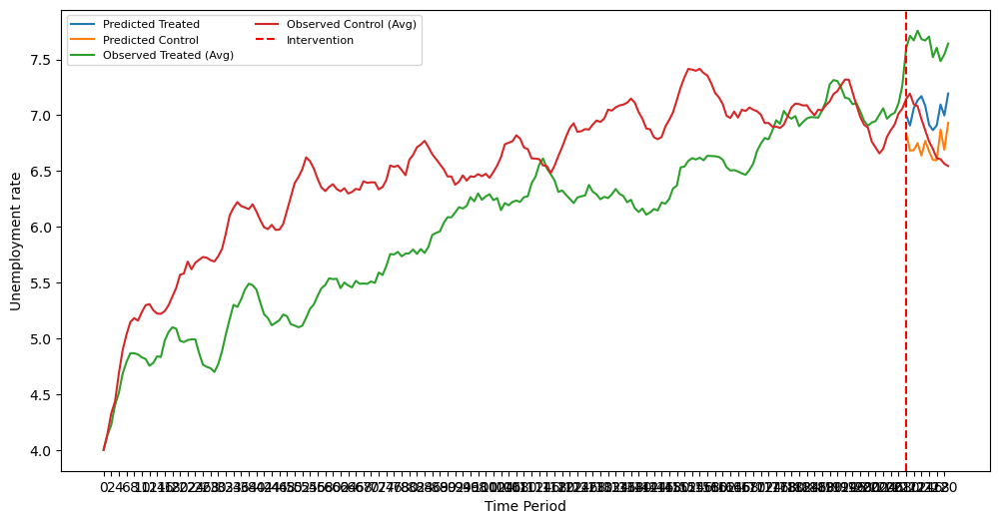

Treated Group - Mean: 8.621929057246616 Median: 8.568149230083954
Control Group - Mean: 3.657672904697361 Median: 4.162745779584081
Shapiro-Wilk test p-value for Treated Group: 0.9035716652870178
Shapiro-Wilk test p-value for Control Group: 0.4267798960208893
T-Test p-value: 0.00020761343888408182
 
sim_101_222_nl_ho
101
True Average Treatement Effect on the Treated Unit for q > 90%: :  2.8790365504901403
Average Treatment Effect on the Treated Unit for q > 90%:  4.476546571195141
mean_SMAPE for TTE :0.421190815191262


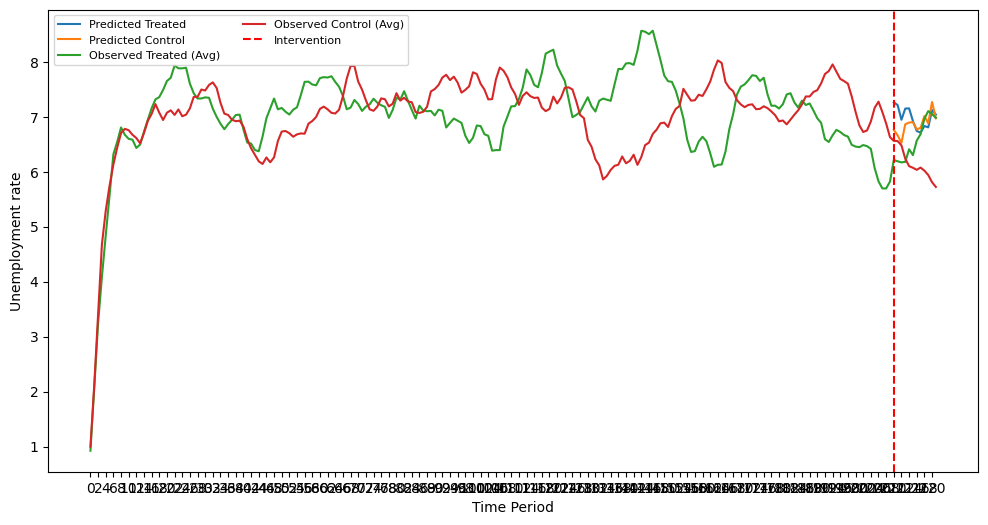

Treated Group - Mean: 6.99011781867036 Median: 6.652995220449842
Control Group - Mean: 10.432991813746012 Median: 11.182264559342922
Shapiro-Wilk test p-value for Treated Group: 0.04809078946709633
Shapiro-Wilk test p-value for Control Group: 0.43925854563713074
Wilcoxon test p-value: 0.423828125
 
sim_500_60_l_ho
500
True Average Treatement Effect on the Treated Unit for q > 90%: :  2.255246493880215
Average Treatment Effect on the Treated Unit for q > 90%:  -1.9028862318329909
mean_SMAPE for TTE :1.620893851369275


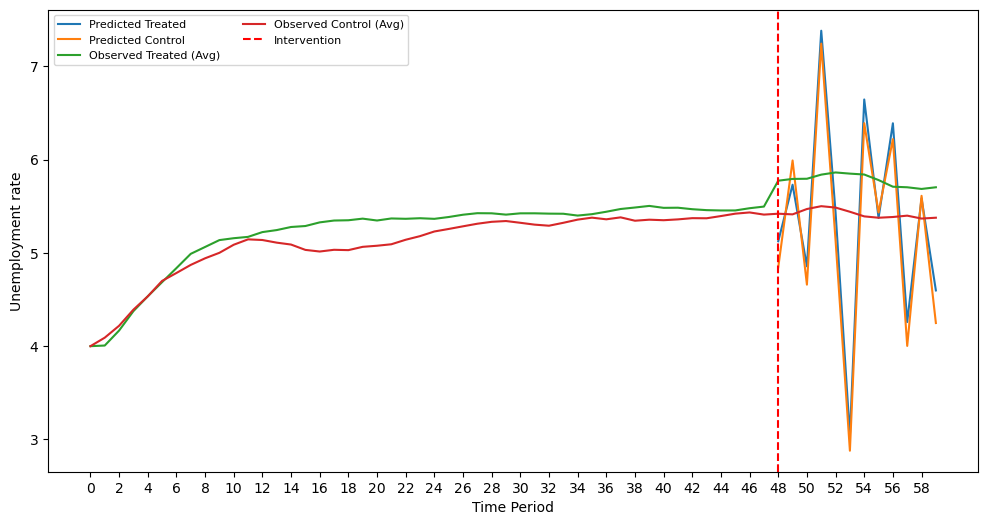

Treated Group - Mean: 20.35366491033034 Median: 12.390022259447008
Control Group - Mean: 21.229202667366156 Median: 14.526538732210426
Shapiro-Wilk test p-value for Treated Group: 0.0006031229277141392
Shapiro-Wilk test p-value for Control Group: 0.0012212666915729642
Wilcoxon test p-value: 0.423828125
 
sim_500_60_nl_ho
500
True Average Treatement Effect on the Treated Unit for q > 90%: :  3.1625222107604984
Average Treatment Effect on the Treated Unit for q > 90%:  -13.006729325071836
mean_SMAPE for TTE :2.0


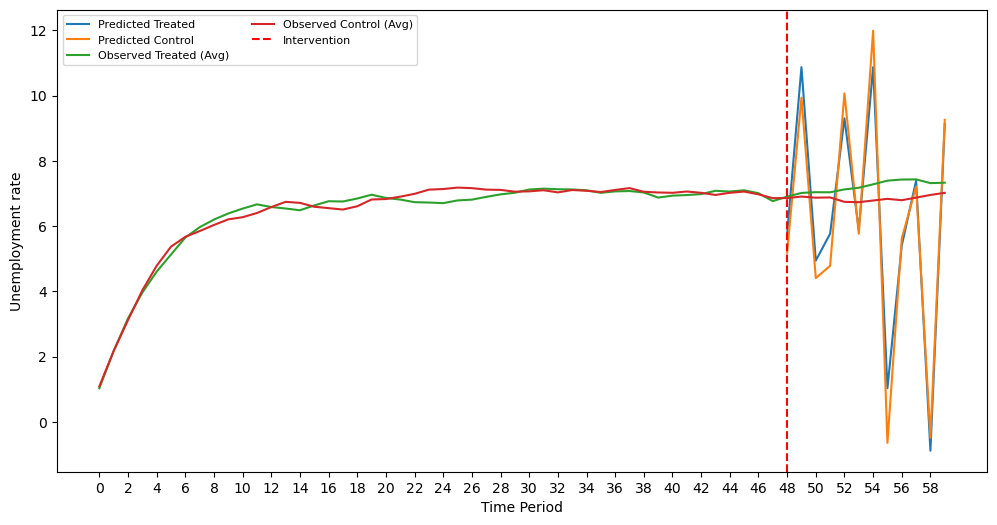

Treated Group - Mean: -5.084500428242319 Median: 22.68998024747102
Control Group - Mean: -200.82969957154702 Median: 27.33400421181192
Shapiro-Wilk test p-value for Treated Group: 0.00011019417433999479
Shapiro-Wilk test p-value for Control Group: 2.061355007754173e-05
Wilcoxon test p-value: 1.0
 
sim_500_222_l_ho
500
True Average Treatement Effect on the Treated Unit for q > 90%: :  2.5674855168681625
Average Treatment Effect on the Treated Unit for q > 90%:  1.6694480678031642
mean_SMAPE for TTE :0.5487687072995


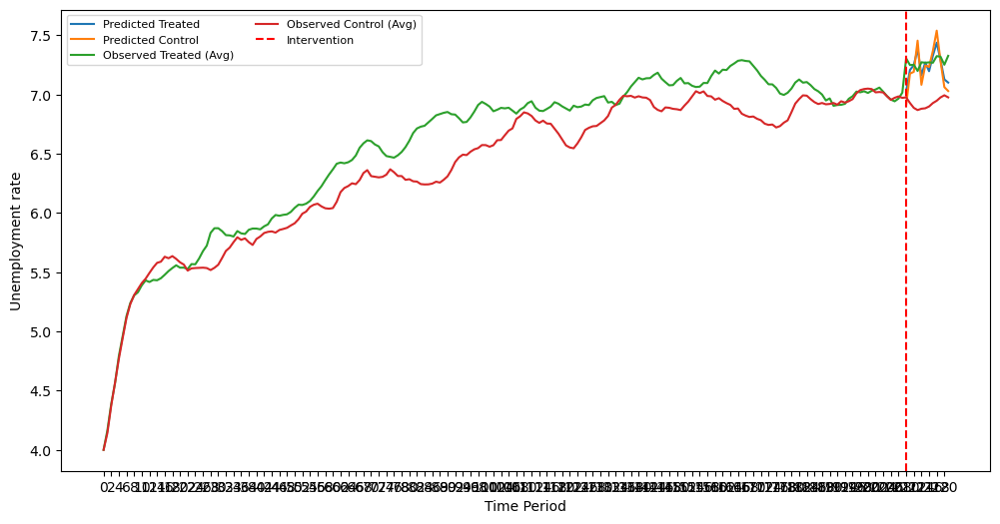

Treated Group - Mean: 1.447683515782126 Median: 1.2853208336926363
Control Group - Mean: 4.063160489296178 Median: 4.224203064024329
Shapiro-Wilk test p-value for Treated Group: 0.31079620122909546
Shapiro-Wilk test p-value for Control Group: 0.3572433888912201
T-Test p-value: 0.014644271768914308
 
sim_500_222_nl_ho
500
True Average Treatement Effect on the Treated Unit for q > 90%: :  3.052281293202109
Average Treatment Effect on the Treated Unit for q > 90%:  4.9285096161691095
mean_SMAPE for TTE :0.46595451256940196


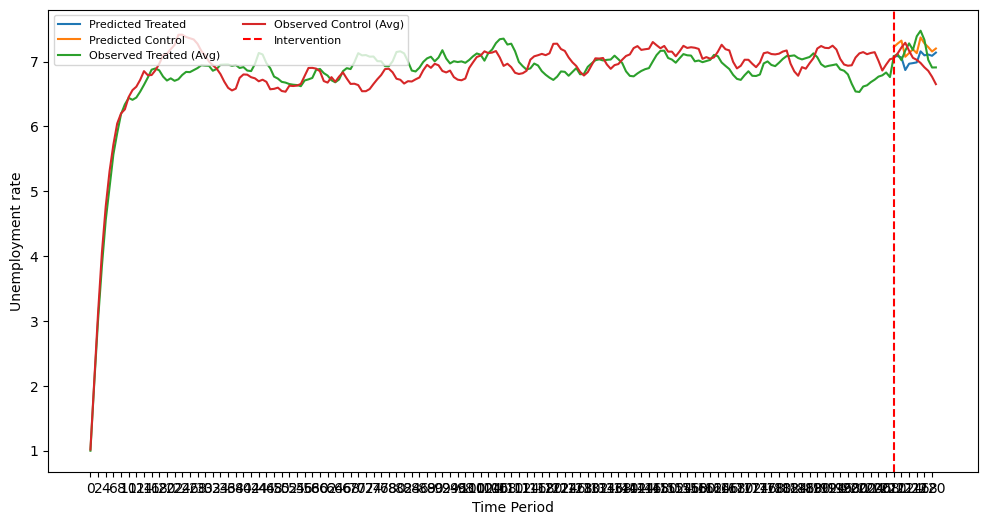

Treated Group - Mean: 2.774504756255061 Median: 3.0585959195572583
Control Group - Mean: 3.4370247769958913 Median: 2.716785647368618
Shapiro-Wilk test p-value for Treated Group: 0.4753609299659729
Shapiro-Wilk test p-value for Control Group: 0.27426570653915405
T-Test p-value: 0.4358198085443318
 
sim_10_60_l_he
10
True Average Treatement Effect on the Treated Unit for q > 90%: :  0.7508459062654844
Average Treatment Effect on the Treated Unit for q > 90%:  3.3254129281681593
mean_SMAPE for TTE :1.153453956746284


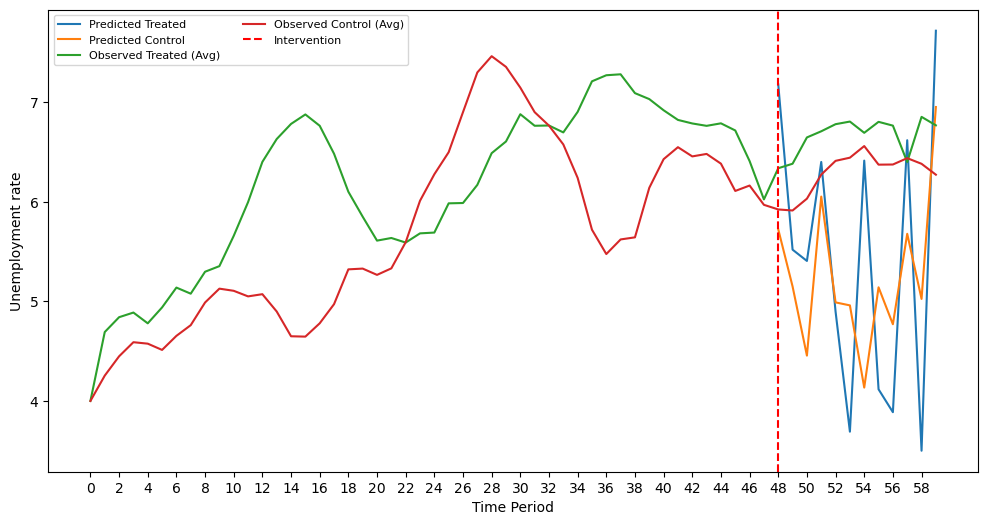

Treated Group - Mean: 36.10073547208031 Median: 19.298195736821906
Control Group - Mean: 23.521887096409518 Median: 25.491704295645572
Shapiro-Wilk test p-value for Treated Group: 0.02912597730755806
Shapiro-Wilk test p-value for Control Group: 0.39715081453323364
Wilcoxon test p-value: 0.2333984375
 
sim_10_60_nl_he
10
True Average Treatement Effect on the Treated Unit for q > 90%: :  2.986924125892758
Average Treatment Effect on the Treated Unit for q > 90%:  -3.633811317857242
mean_SMAPE for TTE :1.524671826487637


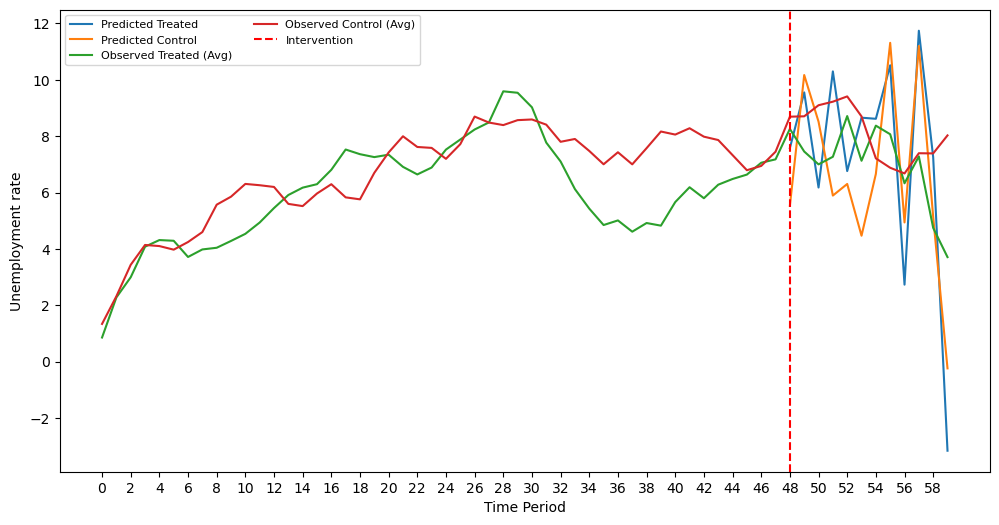

Treated Group - Mean: 11.14484499235659 Median: 22.62474093207127
Control Group - Mean: -246.55234587869776 Median: 37.216030244618835
Shapiro-Wilk test p-value for Treated Group: 0.0003145727969240397
Shapiro-Wilk test p-value for Control Group: 1.6715101764930296e-06
Wilcoxon test p-value: 0.5693359375
 
sim_10_222_l_he
10
True Average Treatement Effect on the Treated Unit for q > 90%: :  -0.15427761455658695
Average Treatment Effect on the Treated Unit for q > 90%:  1.5297877368729624
mean_SMAPE for TTE :1.3420263944700281


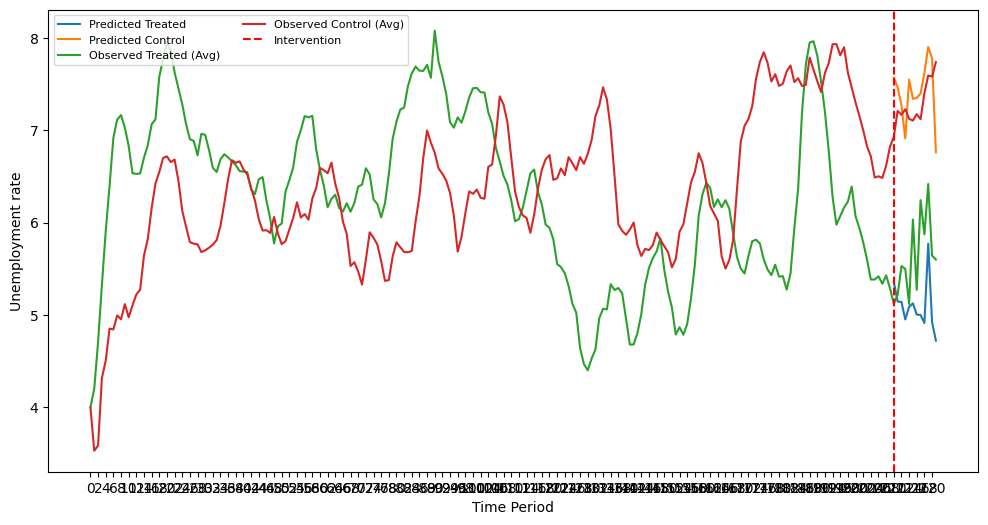

Treated Group - Mean: 11.398198307387515 Median: 11.119908761357692
Control Group - Mean: 4.71704681201728 Median: 3.589251096413344
Shapiro-Wilk test p-value for Treated Group: 0.7511076331138611
Shapiro-Wilk test p-value for Control Group: 0.002697669668123126
Wilcoxon test p-value: 0.01611328125
 
sim_10_222_nl_he
10
True Average Treatement Effect on the Treated Unit for q > 90%: :  1.6994226634140002
Average Treatment Effect on the Treated Unit for q > 90%:  3.8852233851556672
mean_SMAPE for TTE :1.280228340470219


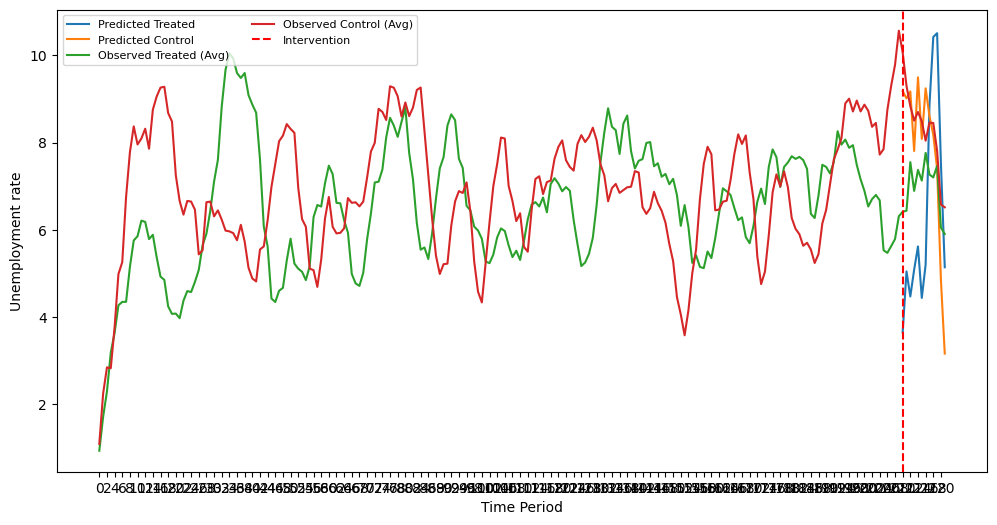

Treated Group - Mean: 38.39307602077032 Median: 31.052439052721923
Control Group - Mean: 17.006956146027207 Median: 6.867141890081043
Shapiro-Wilk test p-value for Treated Group: 0.1264592409133911
Shapiro-Wilk test p-value for Control Group: 3.3095941034844145e-05
Wilcoxon test p-value: 0.05224609375
 
sim_101_60_l_he
101
True Average Treatement Effect on the Treated Unit for q > 90%: :  3.0706363348683783
Average Treatment Effect on the Treated Unit for q > 90%:  -0.7424362633640871
mean_SMAPE for TTE :0.86642049961196


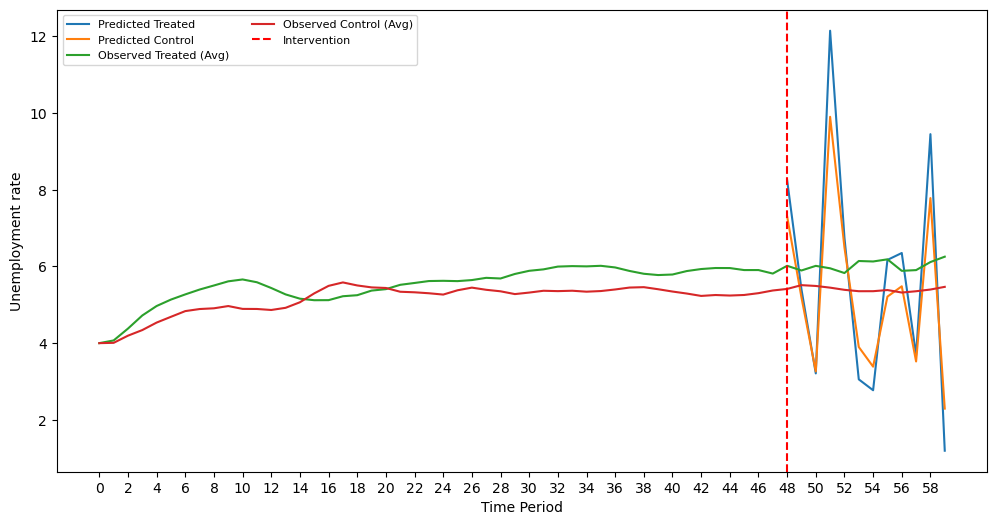

Treated Group - Mean: 78.164088609454 Median: 43.15423928030284
Control Group - Mean: 40.447535815042436 Median: 33.97079469450199
Shapiro-Wilk test p-value for Treated Group: 0.00022291835921350867
Shapiro-Wilk test p-value for Control Group: 0.03761053457856178
Wilcoxon test p-value: 0.00927734375
 
sim_101_60_nl_he
101
True Average Treatement Effect on the Treated Unit for q > 90%: :  3.0640631051167166
Average Treatment Effect on the Treated Unit for q > 90%:  -7.027623657964949
mean_SMAPE for TTE :1.8604495142563273


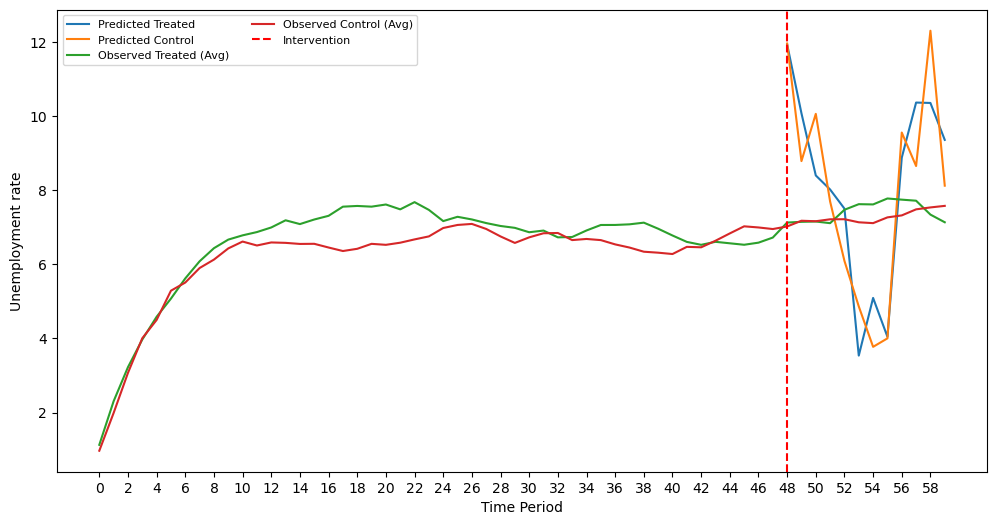

Treated Group - Mean: 36.99775714276267 Median: 27.29615195737005
Control Group - Mean: 34.31937540605741 Median: 26.08930871750431
Shapiro-Wilk test p-value for Treated Group: 0.018856005743145943
Shapiro-Wilk test p-value for Control Group: 0.058683980256319046
Wilcoxon test p-value: 0.90966796875
 
sim_101_222_l_he
101
True Average Treatement Effect on the Treated Unit for q > 90%: :  2.353568361350783
Average Treatment Effect on the Treated Unit for q > 90%:  2.416008885026279
mean_SMAPE for TTE :0.28271103295455285


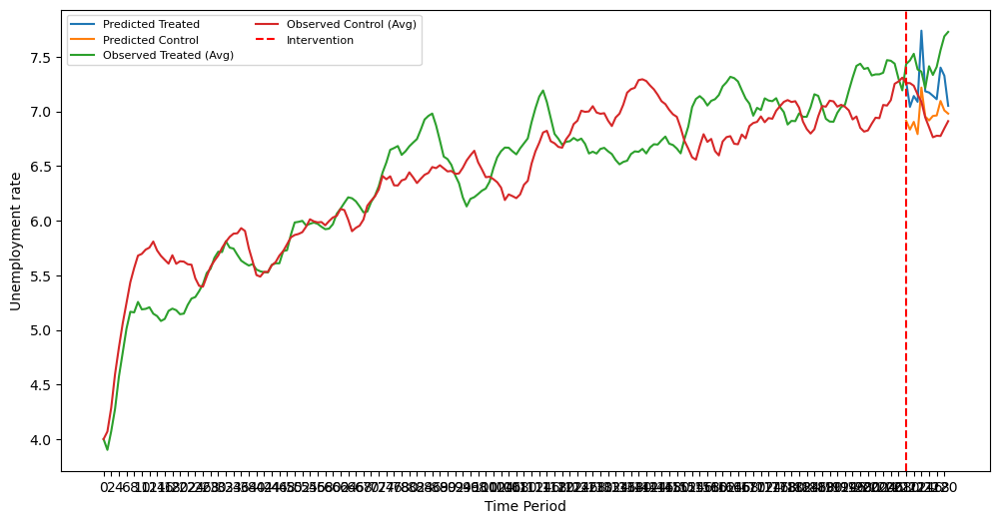

Treated Group - Mean: 4.163004592565808 Median: 4.1736239032497275
Control Group - Mean: 3.124248263321481 Median: 2.7340667759497856
Shapiro-Wilk test p-value for Treated Group: 0.6022194027900696
Shapiro-Wilk test p-value for Control Group: 0.5395115613937378
T-Test p-value: 0.2590448268812334
 
sim_101_222_nl_he
101
True Average Treatement Effect on the Treated Unit for q > 90%: :  3.9865590709073255
Average Treatment Effect on the Treated Unit for q > 90%:  2.903215323893992
mean_SMAPE for TTE :0.4263885134551652


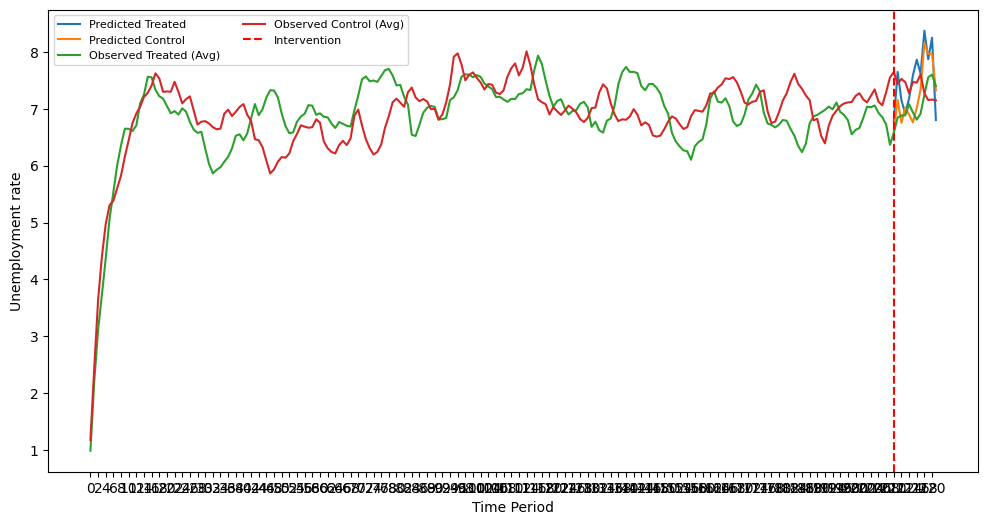

Treated Group - Mean: 7.036158071347541 Median: 8.237541638402234
Control Group - Mean: 8.04373316347037 Median: 8.205621127417581
Shapiro-Wilk test p-value for Treated Group: 0.40491363406181335
Shapiro-Wilk test p-value for Control Group: 0.49841323494911194
T-Test p-value: 0.6038445358344012
 
sim_500_60_l_he
500
True Average Treatement Effect on the Treated Unit for q > 90%: :  1.573119762057276
Average Treatment Effect on the Treated Unit for q > 90%:  -2.612125787815897
mean_SMAPE for TTE :1.4443083665855259


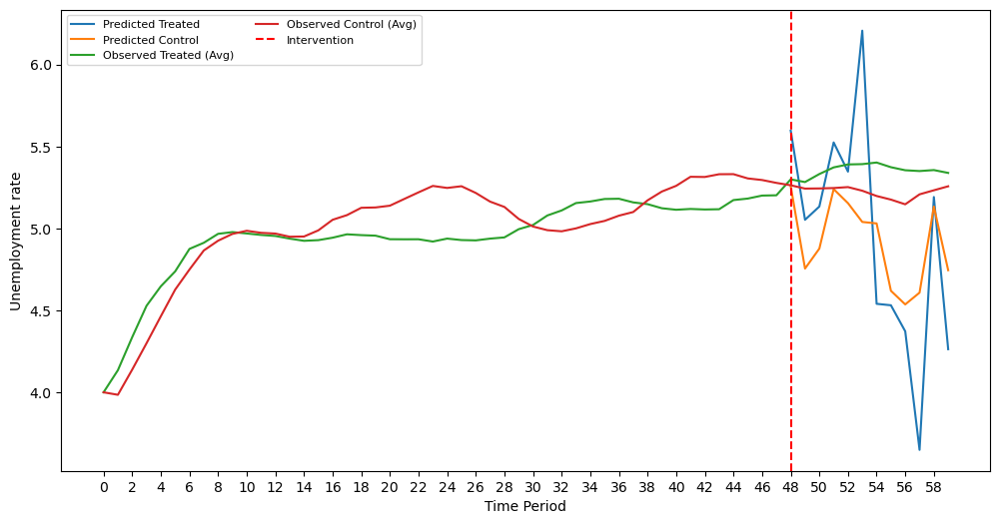

Treated Group - Mean: 13.793599684175668 Median: 9.219524321812735
Control Group - Mean: 6.524387305855786 Median: 5.6530612868630294
Shapiro-Wilk test p-value for Treated Group: 0.030908891931176186
Shapiro-Wilk test p-value for Control Group: 0.08479733765125275
Wilcoxon test p-value: 0.02685546875
 
sim_500_60_nl_he
500
True Average Treatement Effect on the Treated Unit for q > 90%: :  2.1767980454062545
Average Treatment Effect on the Treated Unit for q > 90%:  -15.308497309985079
mean_SMAPE for TTE :2.0


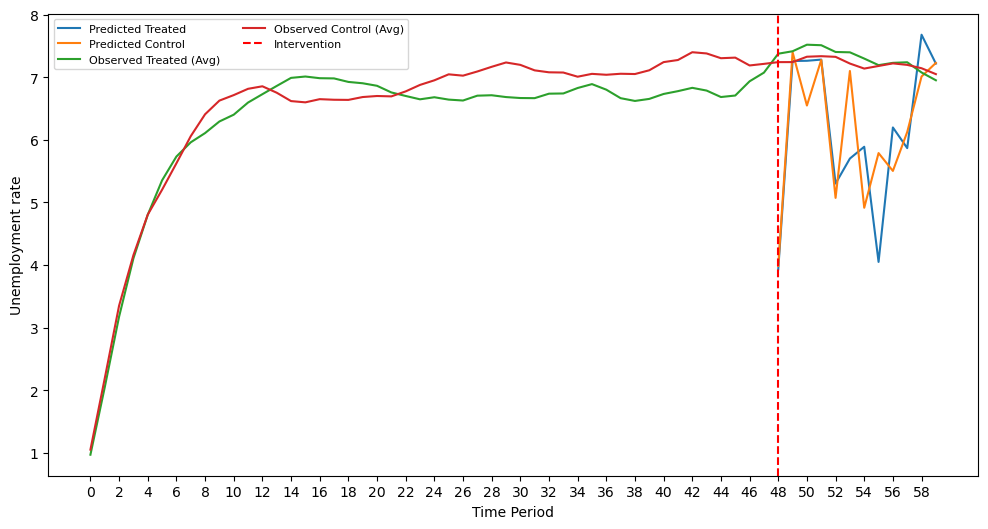

Treated Group - Mean: 26.569464805158372 Median: 20.007511213032807
Control Group - Mean: 22.081884907650164 Median: 14.701093227879113
Shapiro-Wilk test p-value for Treated Group: 0.010164483450353146
Shapiro-Wilk test p-value for Control Group: 0.021882714703679085
Wilcoxon test p-value: 0.5693359375
 
sim_500_222_l_he
500
True Average Treatement Effect on the Treated Unit for q > 90%: :  2.1153736510739116
Average Treatment Effect on the Treated Unit for q > 90%:  3.037303259437527
mean_SMAPE for TTE :0.34436525329732953


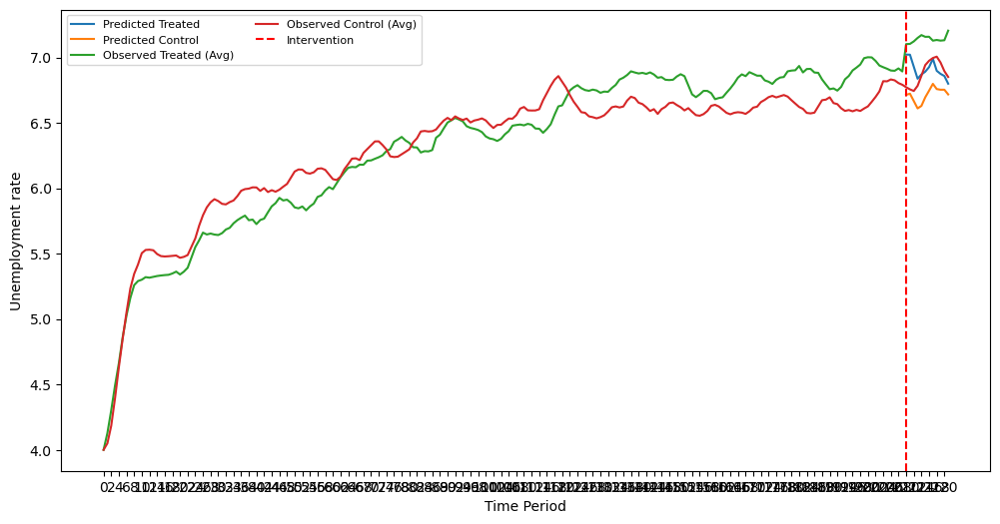

Treated Group - Mean: 3.3593734696686117 Median: 3.5563057569005565
Control Group - Mean: 2.4504718447503797 Median: 2.759542675366835
Shapiro-Wilk test p-value for Treated Group: 0.6909375786781311
Shapiro-Wilk test p-value for Control Group: 0.1682436317205429
T-Test p-value: 0.03388239872372046
 
sim_500_222_nl_he
500
True Average Treatement Effect on the Treated Unit for q > 90%: :  2.7214775465194383
Average Treatment Effect on the Treated Unit for q > 90%:  3.764504234079771
mean_SMAPE for TTE :0.3090218603817916


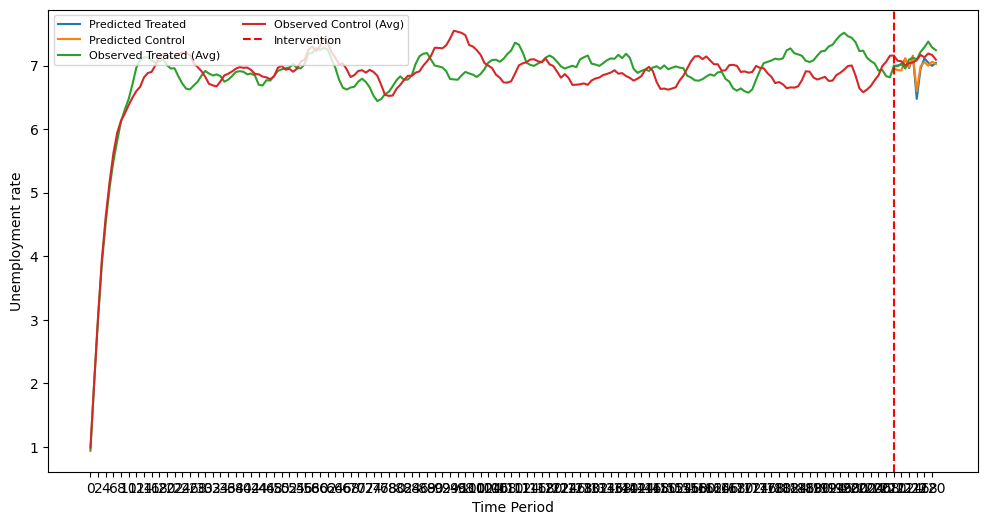

Treated Group - Mean: 2.683657620103959 Median: 2.2908695123985128
Control Group - Mean: 2.2774085860012785 Median: 1.8554795622098164
Shapiro-Wilk test p-value for Treated Group: 0.03382790461182594
Shapiro-Wilk test p-value for Control Group: 0.0006695724441669881
Wilcoxon test p-value: 0.6220703125
 


In [24]:
dataset_name_test = ['calls911_benchmarks',\
                     'sim_10_60_l_ho','sim_10_60_nl_ho',\
                     'sim_10_222_l_ho','sim_10_222_nl_ho',\
                     'sim_101_60_l_ho', 'sim_101_60_nl_ho',\
                     'sim_101_222_l_ho', 'sim_101_222_nl_ho',\
                     'sim_500_60_l_ho', 'sim_500_60_nl_ho',\
                     'sim_500_222_l_ho', 'sim_500_222_nl_ho',\
                     'sim_10_60_l_he', 'sim_10_60_nl_he',\
                     'sim_10_222_l_he', 'sim_10_222_nl_he',\
                     'sim_101_60_l_he', 'sim_101_60_nl_he',\
                     'sim_101_222_l_he', 'sim_101_222_nl_he',\
                     'sim_500_60_l_he', 'sim_500_60_nl_he',\
                     'sim_500_222_l_he', 'sim_500_222_nl_he']
data_type = ['calls911'] + ['sim']*24
forecast_horizon = [7] + [12]*24 
model = 'tsmixer'
# plot_or_not = [True] + [False]*24 

for i in range(len(dataset_name_test)):
    print(dataset_name_test[i])
    table2(dataset_name_test[i], data_type[i], model, forecast_horizon[i], plot_or_not=True)
    print(" ")

In [5]:
dataset_name_test = ['calls911_benchmarks',\
                     'sim_10_60_l_ho','sim_10_60_nl_ho',\
                     'sim_10_222_l_ho','sim_10_222_nl_ho',\
                     'sim_101_60_l_ho', 'sim_101_60_nl_ho',\
                     'sim_101_222_l_ho', 'sim_101_222_nl_ho',\
                     'sim_500_60_l_ho', 'sim_500_60_nl_ho',\
                     'sim_500_222_l_ho', 'sim_500_222_nl_ho',\
                     'sim_10_60_l_he', 'sim_10_60_nl_he',\
                     'sim_10_222_l_he', 'sim_10_222_nl_he',\
                     'sim_101_60_l_he', 'sim_101_60_nl_he',\
                     'sim_101_222_l_he', 'sim_101_222_nl_he',\
                     'sim_500_60_l_he', 'sim_500_60_nl_he',\
                     'sim_500_222_l_he', 'sim_500_222_nl_he']
data_type = ['calls911'] + ['sim']*24
te = [None] + ['homogeneous']*12 + ['heterogeneous']*12
model = 'tft'
for i in range(len(dataset_name_test)):
    print(dataset_name_test[i])
    table2(dataset_name_test[i], data_type[i], model, te[i], plot_or_not=True)
    print(" ")

calls911_benchmarks
(7, 62)


TypeError: bad operand type for unary -: 'NoneType'

In [280]:
def plot_ts2(dataset_name, quantiles, plot=False):
    data_train = pd.read_csv('./datasets/text_data/sim/'+dataset_name+'_train.csv')
    data_test = pd.read_csv('./datasets/text_data/sim/'+dataset_name+'_test_actual.csv')
    data_index = pd.concat([data_train,data_test],axis=0)
    # data_index = data_index.sort_values(by=['series_id','time'], ignore_index=True)
    data_index['tnc'] = ['1' if i == 'treated' else '0' for i in data_index['c_t']]
    data_index.set_index(data_index['time'], inplace=True)
    data_full = data_index.drop(['time'], axis=1)
    
    predicted_csv_files = {q: './results/nn_model_results/rnn/processed_ensemble_forecasts/'+dataset_name+'_LSTMcell_cocob_without_stl_decomposition_'+f'{q}.txt' for q in quantiles}
    
    # Create a dictionary to store the dataframes for each quantile
    dfs = {q: [] for q in quantiles}

    # Iterate over each quantile
    for quantile, files in predicted_csv_files.items():
        # Iterate over each file for the quantile
        # Load the text data from CSV
        data = pd.read_csv(files, header=None)

        # Transpose the data for better visualization (units as rows, time periods as columns)
        transposed_data = data.transpose()

        # Append the transposed dataframe to the list for the current quantile
        dfs[quantile].append(transposed_data)

    # Concatenate the dataframes along the columns (units) for each quantile
    concatenated_data = {q: pd.concat(frames, axis=1) for q, frames in dfs.items()}
    diff_I_vec_all, diff_NI_vec_all = 0, 0
    for i in range(int(len(transposed_data.columns)/2)):
        # predicted treated units
        predicted_treated = {q: concatenated_data[q].iloc[:,\
                         int(i+len(transposed_data.columns)/2)]\
                              for q in quantiles}

        # actual treated units
        actual_treated = data_full[['_'+str(int(1+i+len(transposed_data.columns)/2))+\
                                    '_' in j for j in data_full.series_id]]
        actual_treated = actual_treated.pivot(columns=\
                                    'series_id')['value']

        # predicted control units
        predicted_control = {q: concatenated_data[q].iloc[\
                :,i] for q in quantiles}

        # actual control units
        actual_control = data_full[['_'+str(1+i)+\
                                    '_' in j for j in data_full.series_id]]
        actual_control = actual_control.pivot(columns=\
                                    'series_id')['value']
        if plot:
            # Plot the averages
            fig, ax = plt.subplots(figsize=(12, 6))

            for quantile, data in predicted_treated.items():
                ax.plot((len(actual_treated)-data.index-1)[::-1],\
                        data, label=f'Quantile {quantile} (Avg Treated Unit {i})')
            ax.plot(actual_treated.index, actual_treated,\
                    label=f'Actual (Avg Treated Unit {i})')

            for quantile, data in predicted_control.items():
                ax.plot((len(actual_treated)-data.index-1)[::-1],\
                        data, label=f'Quantile {quantile} (Avg Control Unit {i})')
            ax.plot(actual_control.index, actual_control,\
                    label=f'Actual (Avg Control Unit {i})')

            
            # Add a vertical line at 2020-01
            plt.axvline(len(actual_control)-12, color='red', linestyle='--', label='Intervention')

            ax.set_xlabel('Time Period')
            ax.set_ylabel(str(dataset_name))
            ax.legend(loc='upper left', bbox_to_anchor=(0, 1), ncol=2, fontsize=8)
            plt.xticks(actual_control.index[::2])
            plt.show()

        # MEAN DIFFERENCE TESTING

        # 1. Preparing the data

        # Treated group
        diff_I = pd.DataFrame({'Predicted':predicted_treated['0.5']})
        diff_I['Y'] = actual_treated.iloc[-len(predicted_treated["0.5"]):,0].values
        diff_I['ab_diff'] = abs(diff_I['Predicted'] - diff_I['Y'])
        diff_I['ab_sum_av'] = (abs(diff_I['Predicted']) + abs(diff_I['Y'])) / 2
        diff_I['ab_diff_propY'] = diff_I['ab_diff'] / diff_I['Y']
        diff_I['ab_diff_propT'] = diff_I['ab_diff'] / diff_I['Predicted']
        diff_I['ab_diff_propYF'] = diff_I['ab_diff'] / diff_I['ab_sum_av']

        # Control group
        diff_NI = pd.DataFrame({'Predicted':predicted_control['0.5']})
        diff_NI['Y'] = actual_control.iloc[-len(predicted_control["0.5"]):,0].values
        diff_NI['ab_diff'] = abs(diff_NI['Predicted'] - diff_NI['Y'])
        diff_NI['ab_sum_av'] = (abs(diff_NI['Predicted']) + abs(diff_NI['Y'])) / 2
        diff_NI['ab_diff_propY'] = diff_NI['ab_diff'] / diff_NI['Y']
        diff_NI['ab_diff_propT'] = diff_NI['ab_diff'] / diff_NI['Predicted']
        diff_NI['ab_diff_propYF'] = diff_NI['ab_diff'] / diff_NI['ab_sum_av']

        # 2. MEAN SIGNIFICANCE TESTS FOR relative differences
        diff_I_vec_i = diff_I['ab_diff_propT'].values * 100
        diff_NI_vec_i = diff_NI['ab_diff_propT'].values * 100

        # print(i, int(i+len(transposed_data.columns)/2))
        # # Display mean and median for each group
        # print("Treated Group - Mean:", diff_I_vec_i.mean(), "Median:", pd.Series(diff_I_vec_i).median())
        # print("Control Group - Mean:", diff_NI_vec_i.mean(), "Median:", pd.Series(diff_NI_vec_i).median())

        diff_I_vec_all += diff_I_vec_i
        diff_NI_vec_all += diff_NI_vec_i

    diff_I_vec = diff_I_vec_all/int(len(transposed_data.columns)/2)
    diff_NI_vec = diff_NI_vec_all/int(len(transposed_data.columns)/2)
    # Display mean and median for each group
    print("Treated Group - Mean:", diff_I_vec.mean(), "Median:", pd.Series(diff_I_vec).median())
    print("Control Group - Mean:", diff_NI_vec.mean(), "Median:", pd.Series(diff_NI_vec).median())

    # Shapiro-Wilk’s test for normality
    shapiro_diff_I = shapiro(diff_I_vec)
    shapiro_diff_NI = shapiro(diff_NI_vec)

    print("Shapiro-Wilk test p-value for Treated Group:", shapiro_diff_I.pvalue)
    print("Shapiro-Wilk test p-value for Control Group:", shapiro_diff_NI.pvalue)

    # Apply t-test if data is normally distributed, otherwise Wilcoxon signed-rank test
    if shapiro_diff_I.pvalue > 0.05 and shapiro_diff_NI.pvalue > 0.05:
        t_test_result = ttest_rel(diff_I_vec, diff_NI_vec)
        print("T-Test p-value:", t_test_result.pvalue)
    else:
        wilcoxon_test_result = wilcoxon(diff_I_vec, diff_NI_vec)
        print("Wilcoxon test p-value:", wilcoxon_test_result.pvalue)

In [290]:
dataset_name_test = ['sim_10_60_l_he', 'sim_10_60_l_ho',\
                     'sim_10_60_nl_he', 'sim_10_60_nl_ho',\
                     'sim_10_222_l_he', 'sim_10_222_l_ho',\
                     'sim_10_222_nl_he', 'sim_10_222_nl_ho',\
                     'sim_101_60_l_he', 'sim_101_60_l_ho',\
                     'sim_101_60_nl_he', 'sim_101_60_nl_ho',\
                     'sim_101_222_l_he', 'sim_101_222_l_ho',\
                     'sim_101_222_nl_he', 'sim_101_222_nl_ho',\
                     'sim_500_60_l_he', 'sim_500_60_l_ho',\
                     'sim_500_60_nl_he', 'sim_500_60_nl_ho',\
                     'sim_500_222_l_he', 'sim_500_222_l_ho',\
                     'sim_500_222_nl_he', 'sim_500_222_nl_ho']
for i in dataset_name_test:
    print(i)
    plot_ts2(i, quantiles)
    print(" ")

sim_10_60_l_he
Treated Group - Mean: 15.618215236269316 Median: 15.899502866452757
Control Group - Mean: 29.12917456648903 Median: 25.585543726295175
Shapiro-Wilk test p-value for Treated Group: 0.14155853378382338
Shapiro-Wilk test p-value for Control Group: 0.007962737339305746
Wilcoxon test p-value: 0.0068359375
 
sim_10_60_l_ho
Treated Group - Mean: 20.323539195375744 Median: 20.861970753176642
Control Group - Mean: 15.646872157562195 Median: 15.627142579049405
Shapiro-Wilk test p-value for Treated Group: 0.22107268087287274
Shapiro-Wilk test p-value for Control Group: 0.9199643391541742
T-Test p-value: 0.005536300102258698
 
sim_10_60_nl_he
Treated Group - Mean: 30.24539490028562 Median: 34.74146921048741
Control Group - Mean: 35.48195444074369 Median: 36.53364103284851
Shapiro-Wilk test p-value for Treated Group: 0.07377012825313885
Shapiro-Wilk test p-value for Control Group: 0.3041553763695413
T-Test p-value: 0.06122230336017505
 
sim_10_60_nl_ho
Treated Group - Mean: 38.150497

In [282]:
dataset_name = ''

plot_ts2(dataset_name, quantiles)

Treated Group - Mean: 20.323539195375744 Median: 20.861970753176642
Control Group - Mean: 15.646872157562195 Median: 15.627142579049405
Shapiro-Wilk test p-value for Treated Group: 0.22107268087287274
Shapiro-Wilk test p-value for Control Group: 0.9199643391541742
T-Test p-value: 0.005536300102258698


In [284]:
dataset_name = ''

plot_ts2(dataset_name, quantiles)

Treated Group - Mean: 30.24539490028562 Median: 34.74146921048741
Control Group - Mean: 35.48195444074369 Median: 36.53364103284851
Shapiro-Wilk test p-value for Treated Group: 0.07377012825313885
Shapiro-Wilk test p-value for Control Group: 0.3041553763695413
T-Test p-value: 0.06122230336017505


In [285]:
dataset_name = ''

plot_ts2(dataset_name, quantiles)

Treated Group - Mean: 38.150497276036994 Median: 40.10201255057345
Control Group - Mean: 37.096155381747955 Median: 38.60516960851412
Shapiro-Wilk test p-value for Treated Group: 0.11587994082224157
Shapiro-Wilk test p-value for Control Group: 0.5199990123338567
T-Test p-value: 0.8011664820798412


In [286]:
dataset_name = ''

plot_ts2(dataset_name, quantiles)

Treated Group - Mean: 20.815194799366747 Median: 21.40583616084313
Control Group - Mean: 21.71242806026271 Median: 21.04102333413226
Shapiro-Wilk test p-value for Treated Group: 0.5906986399592229
Shapiro-Wilk test p-value for Control Group: 0.9997779914706143
T-Test p-value: 0.7379919963783228


In [287]:
dataset_name = ''

plot_ts2(dataset_name, quantiles)

Treated Group - Mean: 21.993227808329888 Median: 21.81527513204629
Control Group - Mean: 70.15176436364546 Median: 66.64181729191866
Shapiro-Wilk test p-value for Treated Group: 0.6479539553505806
Shapiro-Wilk test p-value for Control Group: 0.06574801474918941
T-Test p-value: 0.0018825822836798108


In [190]:
for quantile, files in predicted_csv_files.items():
    # Iterate over each file for the quantile
    # Load the text data from CSV
    data = pd.read_csv(files, header=None)

    # Transpose the data for better visualization (units as rows, time periods as columns)
    transposed_data = data.transpose()

    # Append the transposed dataframe to the list for the current quantile
    dfs[quantile].append(transposed_data)

# Concatenate the dataframes along the columns (units) for each quantile
concatenated_data = {q: pd.concat(frames, axis=1) for q, frames in dfs.items()}

# # average predicted treated units
# averages_predicted_treated = {q: concatenated_data[q].iloc[\
#         :,int(len(concatenated_data[q].columns)/2):].mean(axis=1)\
#             for q in quantiles}

In [192]:
transposed_data

,0,1,2,3,4,5,6,7,8,9
0,6.991125,6.301158,1.595579,4.514176,2.202325,10.145553,2.893547,12.484855,10.268354,6.131543
1,7.375317,6.254870,1.572927,5.039123,1.954142,9.927241,2.912477,12.661434,10.317207,6.068119
2,7.393527,6.176349,1.663244,5.125019,2.138897,9.569663,3.100625,12.745415,10.405247,6.069724
3,7.445085,6.170067,1.693623,5.148317,2.022850,9.543782,3.166734,12.699887,10.411573,6.076473
4,7.664696,6.187992,1.740414,5.297991,1.603850,9.578660,3.270230,12.557126,10.404446,6.129312
5,7.391281,6.169939,1.860753,4.889910,1.727492,9.499311,3.498094,12.416968,10.431839,6.205075
6,7.419874,6.200983,1.950261,4.669951,1.547841,9.502851,3.709254,12.109759,10.419241,6.323229
7,7.198283,6.163843,2.115844,4.126119,1.765592,9.431769,4.047940,11.730433,10.492127,6.499066
8,6.974879,6.237054,2.111642,3.937458,1.799502,9.581570,3.906496,11.514966,10.271623,6.534376
9,6.677223,6.250865,2.138978,3.792397,1.888351,9.691827,3.758876,11.395530,10.090722,6.540368


In [193]:
'_'+str(int(1+i+len(transposed_data.columns)/2))+'_'

'_6_'

In [185]:
data

,0,1,2,3,4,5,6
0,749.475704,737.535298,764.122440,744.457077,757.296805,745.614027,753.450149
1,89.830816,91.081558,90.196615,90.344832,91.594619,93.727380,91.320186
2,69.725046,68.559856,73.372229,67.084703,72.235212,68.509814,69.460234
3,19.081296,20.417678,19.283856,20.288594,19.004172,19.247797,18.572866
4,596.114991,590.852926,609.884294,597.265229,594.718439,599.238530,592.664973
...,...,...,...,...,...,...,...
57,220.480456,210.161015,224.722394,216.109689,223.845882,218.216368,214.091775
58,54.456753,52.058861,55.152684,51.724736,52.761087,54.720700,53.670357
59,364.904556,353.128350,358.760936,361.222271,363.943835,372.317152,352.748806
60,260.758865,254.443023,261.349114,254.430366,265.506477,261.775601,260.008779


In [195]:
['_'+str(int(1+i+len(transposed_data.columns)/2))+'_' in j for j in data_index.series_id]

[False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,


In [198]:
data_index[['_'+str(int(1+i+len(transposed_data.columns)/2))+'_' in j for j in data_index.series_id]]


,series_id,value,c_t,time_series_length,amount_of_time_series,dgp,te_intervention,tnc
time,,,,,,,,
1,10_6_60_linear_heterogeneous,4.000000,treated,60,10,linear,heterogeneous,1
2,10_6_60_linear_heterogeneous,3.274956,treated,60,10,linear,heterogeneous,1
3,10_6_60_linear_heterogeneous,2.927431,treated,60,10,linear,heterogeneous,1
4,10_6_60_linear_heterogeneous,3.431322,treated,60,10,linear,heterogeneous,1
5,10_6_60_linear_heterogeneous,4.344974,treated,60,10,linear,heterogeneous,1
6,10_6_60_linear_heterogeneous,4.314408,treated,60,10,linear,heterogeneous,1
7,10_6_60_linear_heterogeneous,4.935989,treated,60,10,linear,heterogeneous,1
8,10_6_60_linear_heterogeneous,5.225889,treated,60,10,linear,heterogeneous,1
9,10_6_60_linear_heterogeneous,5.136426,treated,60,10,linear,heterogeneous,1


In [170]:
predicted_treated = {q: concatenated_data[q].iloc[:,\
                         i+int(len(transposed_data.columns)/2)]\
                              for q in quantiles}
predicted_treated


{'0.1': 0    38.322643
 1    35.662481
 2    39.862146
 3    36.022479
 4    40.885728
 5    35.140271
 6    37.075441
 Name: 31, dtype: float64,
 '0.5': 0    38.324875
 1    35.008483
 2    38.287383
 3    35.588827
 4    40.924504
 5    34.946373
 6    36.610415
 Name: 31, dtype: float64,
 '0.9': 0    37.262190
 1    34.855126
 2    38.201173
 3    35.746027
 4    40.145178
 5    35.050868
 6    35.776349
 Name: 31, dtype: float64}

In [161]:
{q: concatenated_data[q].iloc[:, i+int(len(transposed_data.columns)/2)] for q in quantiles}


{'0.1': 0    38.322643
 1    35.662481
 2    39.862146
 3    36.022479
 4    40.885728
 5    35.140271
 6    37.075441
 Name: 31, dtype: float64,
 '0.5': 0    38.324875
 1    35.008483
 2    38.287383
 3    35.588827
 4    40.924504
 5    34.946373
 6    36.610415
 Name: 31, dtype: float64,
 '0.9': 0    37.262190
 1    34.855126
 2    38.201173
 3    35.746027
 4    40.145178
 5    35.050868
 6    35.776349
 Name: 31, dtype: float64}

In [151]:
{q: concatenated_data[q].iloc[\
            :,:int(len(concatenated_data[q].columns)/2)].mean(axis=1)\
                for q in quantiles}

{'0.1': 0    227.065415
 1    223.228078
 2    228.546682
 3    224.285867
 4    226.856080
 5    225.576496
 6    222.606710
 dtype: float64,
 '0.5': 0    227.724645
 1    222.898295
 2    228.617927
 3    224.062429
 4    226.992512
 5    226.346564
 6    223.782983
 dtype: float64,
 '0.9': 0    227.493749
 1    222.761924
 2    229.614520
 3    224.327265
 4    227.636264
 5    226.877305
 6    225.132150
 dtype: float64}

In [156]:
type(concatenated_data[q].iloc[\
            :,:int(len(concatenated_data[q].columns)/2)].mean(axis=1))

pandas.core.series.Series